# Industrial safety. NLP based Chatbot

## Input: Context and Dataset



CONTEXT:
The database comes from one of the biggest industry in Brazil and in the world. It is an urgent need for industries/companies around the globe to understand why employees still suffer some injuries/accidents in plants. Sometimes they also die in such environment.

DATA DESCRIPTION: This The database is basically records of accidents from12 different plants in 03 different countrieswhich every line in the data is an occurrence of an accident.

Columns description:

‣Data: timestamp or time/date information

‣Countries: which country the accident occurred (anonymised)

‣Local: the city where the manufacturing plant is located (anonymised)

‣Industry sector: which sector the plant belongs to

‣Accident level: from I to VI, it registers how severe was the accident (I means not severe but VI means very severe)

‣Potential Accident Level: Depending on the Accident Level, the database also registers how severe the accident could have been (due to other factors involved in the accident)

‣Genre: if the person is male or female

‣Employee or Third Party: if the injured person is an employee or a third party

‣Critical Risk: some description of the risk involved in the accident

‣Description: Detailed description of how the accident happened

PROJECT OBJECTIVE:
Design a ML/DL based chatbot utility which can help the professionals to highlight the safety risk as per the incident description

###### Import necessary libraries and mount google drive

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import random, re
import time
import warnings
warnings.filterwarnings("ignore")

# nlp libraries
import nltk
nltk.download('punkt')
nltk.download('stopwords')

from nltk.tokenize import word_tokenize
from tqdm import tqdm
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
from sklearn.feature_extraction.text import TfidfVectorizer

from wordcloud import WordCloud

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, recall_score, precision_score
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from xgboost.sklearn import XGBClassifier

pd.options.display.max_columns = None
pd.options.display.max_rows = None

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


###### Mount Google Drive

In [ ]:
# mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Milestone 1

### Process:

#### Step 1: Import the data

In [ ]:
#load the data from xlsl file
data = pd.read_excel('drive/My Drive/AIML/Data+Set+-+industrial_safety_and_health_database_with_accidents_description.xlsx')

In [ ]:
print("Shape of Data Provided : \n")
print("Number of Columns : ",data.shape[1])
print("Number of Rows : ",data.shape[0])

Shape of Data Provided : 

Number of Columns :  11
Number of Rows :  425


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Unnamed: 0                425 non-null    int64         
 1   Data                      425 non-null    datetime64[ns]
 2   Countries                 425 non-null    object        
 3   Local                     425 non-null    object        
 4   Industry Sector           425 non-null    object        
 5   Accident Level            425 non-null    object        
 6   Potential Accident Level  425 non-null    object        
 7   Genre                     425 non-null    object        
 8   Employee or Third Party   425 non-null    object        
 9   Critical Risk             425 non-null    object        
 10  Description               425 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(9)
memory usage: 36.6+ KB


In [ ]:
data.head()

,Unnamed: 0,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
0,0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


#### Step 2: Data cleansing

##### Cleaning null values, duplicates, typos

In [ ]:
# Remove 'Unnamed: 0' column from Data frame
data.drop("Unnamed: 0", axis=1, inplace=True)
data.head()

,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


The second column is a date column with typo in column name. Lets change that first along with the the type of column to date format. Similar for Genre , the values pertain to Gender


In [ ]:
# Rename 'Data', 'Countries', 'Genre', 'Employee or Third Party' columns in Data frame
data.rename(columns={'Data':'Date', 'Countries':'Country', 'Genre':'Gender', 'Employee or Third Party':'EmployeeType'}, inplace=True)
data.head()

,Date,Country,Local,Industry Sector,Accident Level,Potential Accident Level,Gender,EmployeeType,Critical Risk,Description
0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


In [ ]:
#check missing values in data
data.isnull().sum()

,0
Date,0
Country,0
Local,0
Industry Sector,0
Accident Level,0
Potential Accident Level,0
Gender,0
EmployeeType,0
Critical Risk,0
Description,0


There are no missing values

In [ ]:
#checking for duplicate rows
data.duplicated().sum()

7

There are 7 duplicate entries, let us remove them from the dataset

In [ ]:
data.drop_duplicates(inplace=True)
data=data.reset_index(drop=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    object        
 2   Local                     418 non-null    object        
 3   Industry Sector           418 non-null    object        
 4   Accident Level            418 non-null    object        
 5   Potential Accident Level  418 non-null    object        
 6   Gender                    418 non-null    object        
 7   EmployeeType              418 non-null    object        
 8   Critical Risk             418 non-null    object        
 9   Description               418 non-null    object        
dtypes: datetime64[ns](1), object(9)
memory usage: 32.8+ KB


In [ ]:
#going through the unique values of each column. Description is more free text, so will have all unique almost. Omitting the description column alone
for col in data.columns:
    if col != 'Description':
        print("\nColumn : ",col)
        print("Unique Values : \n",data[col].value_counts())


Column :  Date
Unique Values : 
 Date
2017-02-08    6
2016-06-16    5
2016-05-04    4
2016-06-08    4
2016-10-03    4
2016-02-15    4
2017-06-11    4
2016-06-24    3
2016-12-12    3
2017-04-11    3
2016-03-22    3
2016-03-31    3
2017-05-06    3
2017-02-13    3
2017-02-17    3
2016-02-24    3
2017-05-16    3
2017-02-25    3
2016-09-20    3
2017-01-17    3
2017-04-25    3
2016-04-30    3
2016-03-18    3
2017-02-07    2
2016-06-18    2
2016-06-07    2
2017-01-31    2
2017-02-23    2
2016-06-05    2
2016-07-08    2
2016-05-26    2
2016-05-25    2
2016-05-22    2
2017-02-26    2
2017-02-27    2
2016-05-12    2
2016-05-11    2
2016-05-05    2
2016-06-03    2
2017-01-09    2
2016-07-07    2
2016-12-13    2
2016-11-08    2
2016-10-18    2
2016-10-13    2
2016-10-10    2
2016-11-23    2
2016-09-22    2
2016-09-21    2
2016-12-01    2
2016-12-08    2
2016-09-13    2
2016-09-06    2
2016-09-04    2
2016-12-15    2
2017-01-24    2
2016-08-30    2
2016-12-23    2
2016-08-24    2
2016-12-22    2
2

In [ ]:
#let us split the date column into day, month, year and day of week
data['Date'] = pd.to_datetime(data['Date'])
data['Year'] = data.Date.apply(lambda x : x.year)
data['Month'] = data.Date.apply(lambda x : x.month)
data['Day'] = data.Date.apply(lambda x : x.day)
data['WeekDay'] = data.Date.apply(lambda x : x.day_name())

In [ ]:
# function to create month variable into seasons
def seasons(x):
    if x in [9, 10, 11]:
        season = 'Spring'
    elif x in [12, 1, 2]:
        season = 'Summer'
    elif x in [3, 4, 5]:
        season = 'Autumn'
    elif x in [6, 7, 8]:
        season = 'Winter'
    return season

In [ ]:
data['Season'] = data['Month'].apply(seasons)
data.head()

,Date,Country,Local,Industry Sector,Accident Level,Potential Accident Level,Gender,EmployeeType,Critical Risk,Description,Year,Month,Day,WeekDay,Season
0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...,2016,1,1,Friday,Summer
1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...,2016,1,2,Saturday,Summer
2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...,2016,1,6,Wednesday,Summer
3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...,2016,1,8,Friday,Summer
4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...,2016,1,10,Sunday,Summer


##### Inferences from above data cleaning

1. We can see that there are records of accidents from 1/1/2016 to 9/7/2017 in every month. So there are no outliers in the 'Date' column.

2. There are only three country types.

3. There are total of 12 Local cities where the manufacturing plant is located. They appear to be in sequence 1-12.

4. There are only three Industry Sector types - Mining, Metals or Others
There are five Accident Level types which are in sequence.

5. There are six Potential Accident Level types which are in sequence.

6. Gender column also has only 2 values Male/Female, so there is no wrong input in this column as well.

7. There are three Employee types in the provided data.

8. There are quite a lot of Critical risk descriptions and we don't see any outliers.

##### Exploratory Data Analysis (EDA)

 Variable Split:
Target variable: 'Accident Level', 'Potential Accident Level'
Predictors (Dependent varibles): 'Date', 'Country', 'Local', 'Industry Sector', 'Gender', 'Employee type', 'Critical Risk', 'Description'

###### Univariate analysis

In [ ]:
def plot(x, df, type, y=""):
  plt.figure(figsize=(6, 6))
  title = "Distribution of " + x
  plt.title(x)
  if y != "" and type == "bar":
    sns.countplot(x =x, data = df, hue =y)
  elif y == "" and type == "bar":
    sns.countplot(x =x, data = df)
  elif type == "pie":
    category_counts = df[x].value_counts()
    plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
  plt.show()

Country


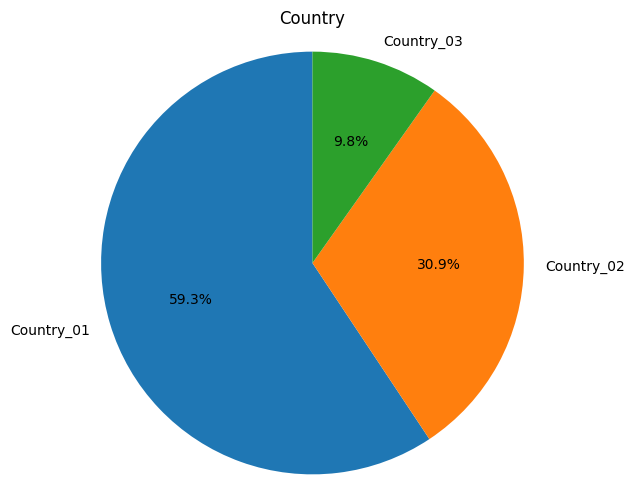

Industry Sector


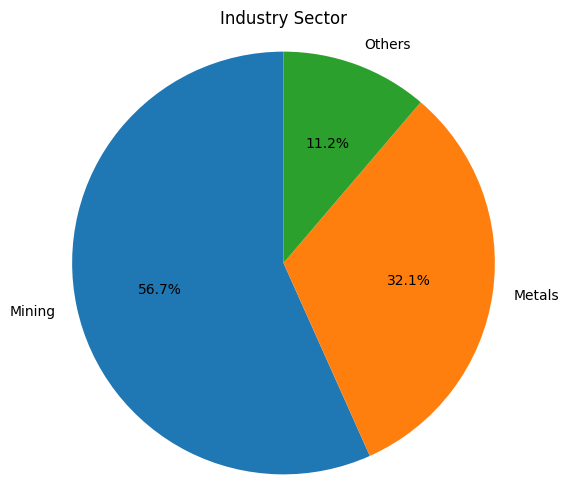

Gender


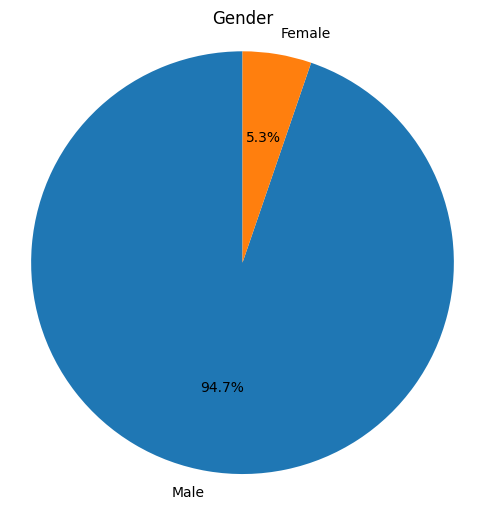

EmployeeType


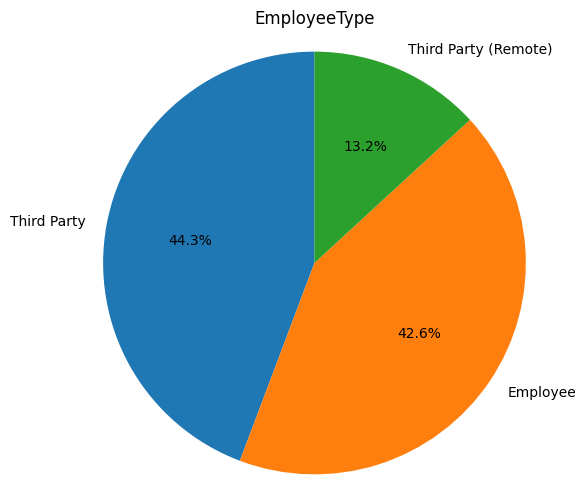

Year


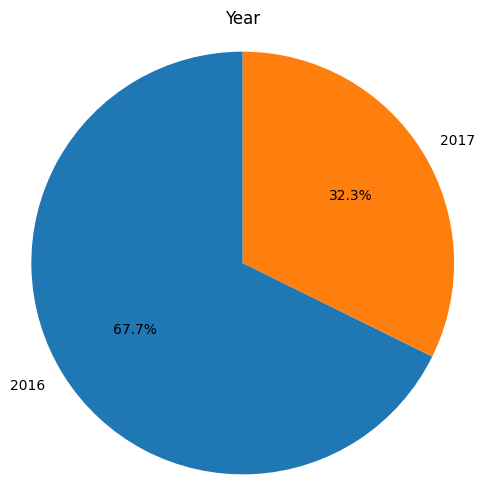

Month


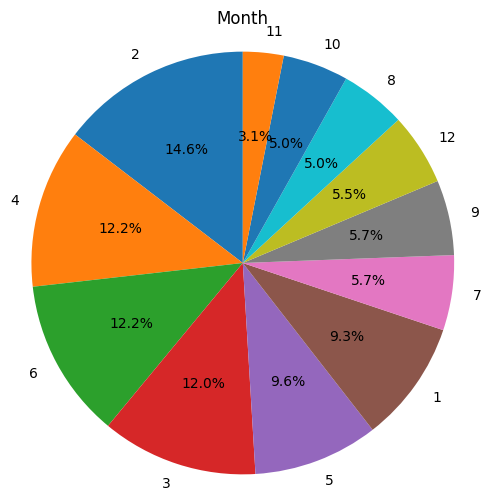

WeekDay


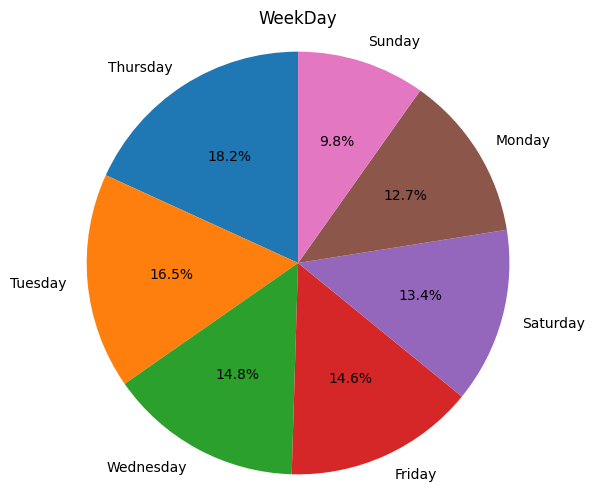

Season


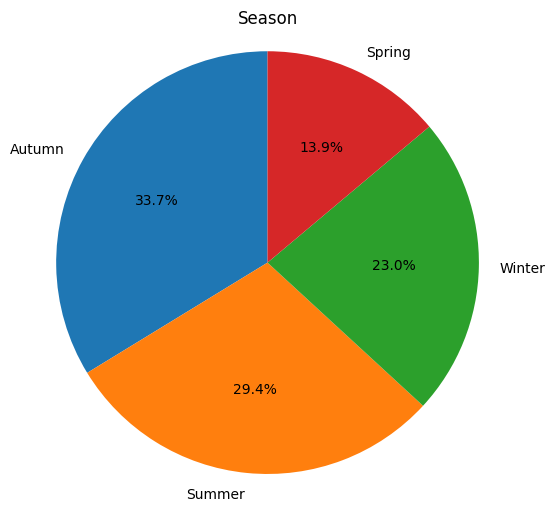

In [ ]:
#Plotting dependent variables - Pie chart
for col in data.columns:
    if col not in ['Description', 'Date', 'Local', 'Day', 'Accident Level', 'Potential Accident Level', 'Critical Risk']:
        print(col)
        plot(col, data, "pie")

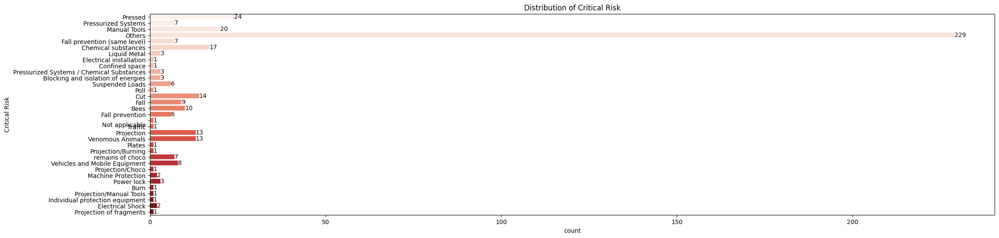

In [ ]:
#Critical risk column
plt.figure(figsize=(25, 6))
ax = sns.countplot(y='Critical Risk', data=data, palette="Reds")
for container in ax.containers:
    ax.bar_label(container)
#plt.xticks(rotation=20)
plt.title("Distribution of Critical Risk")
plt.show()

For most of the cases, critical risk type is categorised as Others (229)
The next highest cases are categorised as Presses with 24 cases

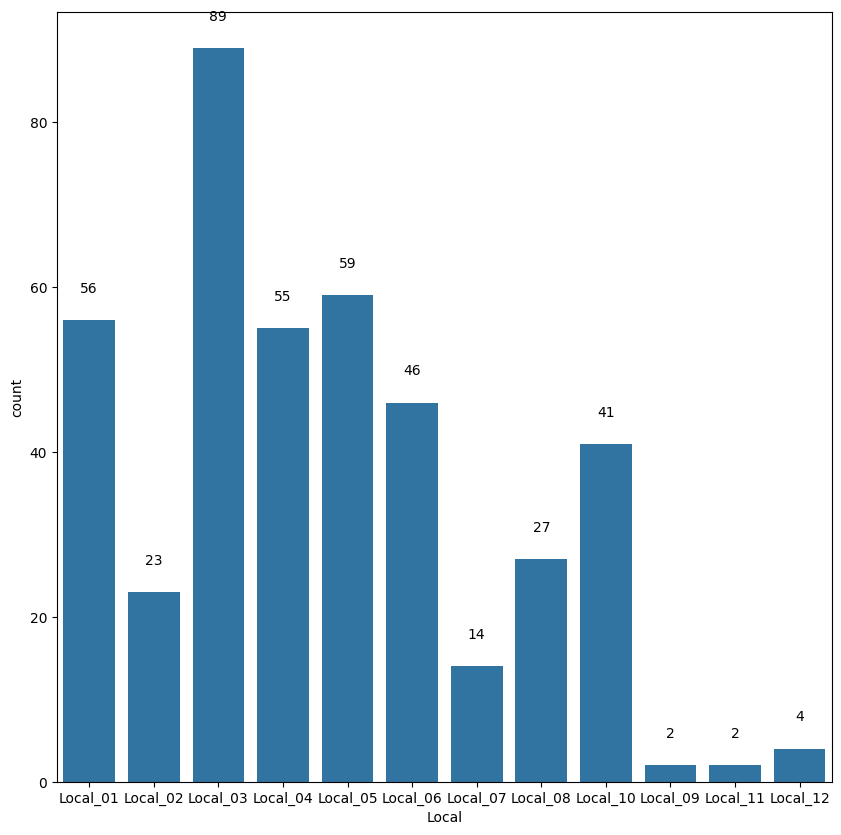

In [ ]:
fig = plt.figure(figsize=(10,10))
ax = sns.countplot(data=data, x='Local')
for p in ax.patches:
   height = p.get_height()
   ax.text(p.get_x() + p.get_width() / 2.,
           height + 3,
           '{:1.0f}'.format(height),
           ha="center", va="bottom")

labels = list(data['Local'].value_counts().index)
#handles = [plt.Rectangle((0, 0), 1, 1, color=sns.color_palette()[i]) for i in range(len(labels))]
#plt.legend(handles, labels, loc='upper right', title="Category Count");

Accident Level


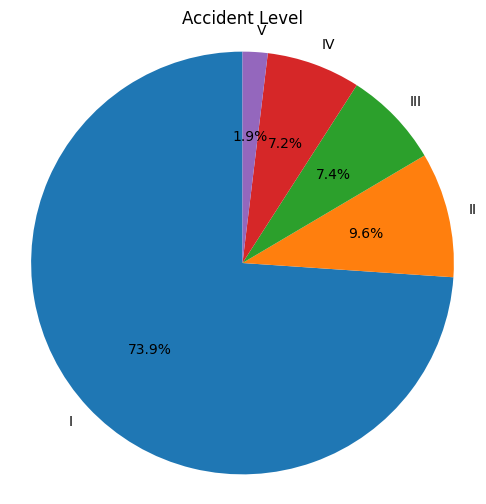

Potential Accident Level


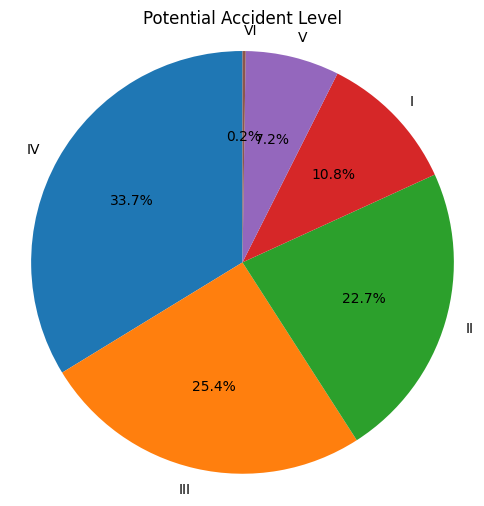

In [ ]:
#Target variable distribution
for col in data.columns:
    if col in ['Accident Level', 'Potential Accident Level']:
        print(col)
        plot(col, data, "pie")

###### Inferences from Univariate analysis



*   Country_01 has ~ 60% of the total accidents recorded followed by Country_2 (30%) and Country_03 (10%) with the least accidents.
*   Sector wise accident plot shows that ~ 56% of the accidents are ocuuring in Mining industries and ~ 32% of accidents in Metal industries.
*   Gender plot shows that ~ 95% of the people who met with accidents are Male.
*   Third party employees have met with more accidents among all employee types, contributing to ~ 45% of the total accidents.
*   This is followed by Employees who contributed ~ 42% to the total accidents.
*   ~ 65% of the accidents have taken place in March-August timeperiod of the year.
*   More accidents happen in Autumn seaspn (35%) followed by Summer (~ 30%)
Number of accidents increased during the middle of the week (Tue-Thur) and then decline.
*   Most accidents happen in Location 3, followed by Local_5, local_1 and local_4.
















###### Bi-variate analysis

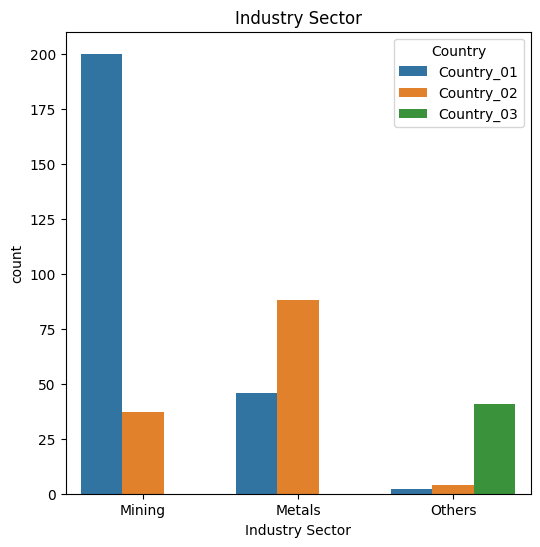

In [ ]:
plot("Industry Sector", data, "bar", "Country")

- Metals and Mining industry sector plants are not available in Country_03.
- Distribution of industry sector differs significantly in each country.

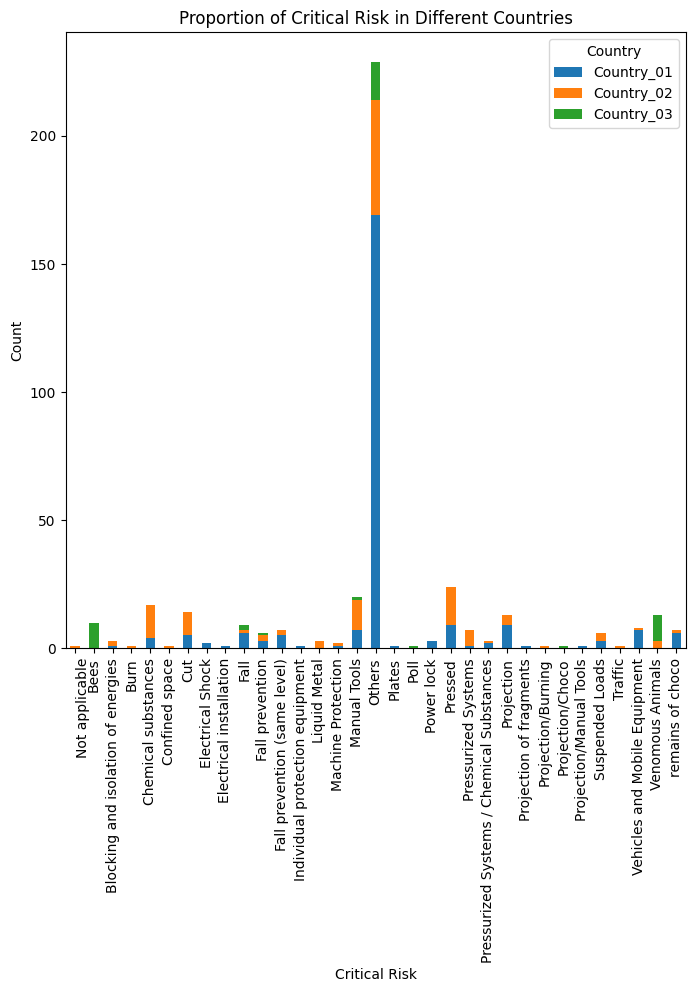

In [ ]:
# Create a crosstab of Critical Risk and Country
crit_risk_cntry_table = pd.crosstab(index=data['Critical Risk'], columns=data['Country'])
#plot
crit_risk_cntry_table.plot(kind='bar', figsize=(8, 8), stacked=True)

plt.title("Proportion of Critical Risk in Different Countries")
plt.xlabel("Critical Risk")
plt.ylabel("Count")
plt.show()

Dominance of 'Manual Tools' risk: Country_01 has a significantly higher count for the "Manual Tools" critical risk compared to the other countries.
<br><br>Varied risk distribution: Other critical risks, such as "Fall prevention," "Machine Protection," and "Confined Space," show more evenly distributed counts across the three countries.
<br><br>Low incident categories: Several critical risk categories have very low counts across all countries, indicating less frequent occurrence.
Country-specific risks: Certain risks, such as "Blocking and isolation of energies" and "Electrical Shock," have notable counts in specific countries, hinting at region-specific hazards.
<br><br>'Not applicable' category: This category has minimal entries, suggesting that most incidents fall under defined critical risks.

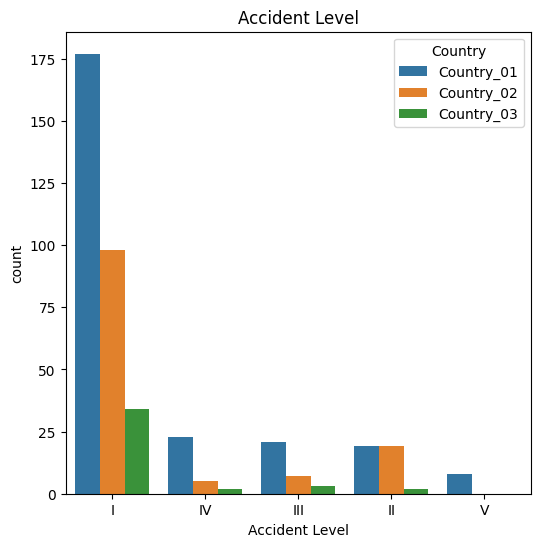

In [ ]:
plot("Accident Level", data, "bar", "Country")

In [ ]:
acc_cntry_table = pd.crosstab(index=data['Accident Level'], columns=data['Country'])
acc_cntry_table

Country,Country_01,Country_02,Country_03
Accident Level,,,
I,177,98,34
II,19,19,2
III,21,7,3
IV,23,5,2
V,8,0,0


In [ ]:
from scipy.stats import chi2_contingency
# Hypothesis Testing for Accident Levels by Country

# H0​: The proportions of accident levels does not differ in different countries.
# Ha​: The proportions of accident levels differ in different countries.

# Test Statistic: Chi-squared test

chi2, p, dof, expected = chi2_contingency(acc_cntry_table)

print("Chi-squared Statistic:", chi2)
print("p-value:", p)

reject_null = p < 0.05
print("Reject Null Hypothesis?:", reject_null)

if reject_null:
    print("We reject the null hypothesis. We have enough evidence to prove that the accident level distribution differs significantly across countries.")
else:
    print("We fail to reject the null hypothesis. We do not have enough evidence to prove that the accident level distribution differs significantly across countries.")


Chi-squared Statistic: 16.539177604348506
p-value: 0.03528174940919624
Reject Null Hypothesis?: True
We reject the null hypothesis. We have enough evidence to prove that the accident level distribution differs significantly across countries.


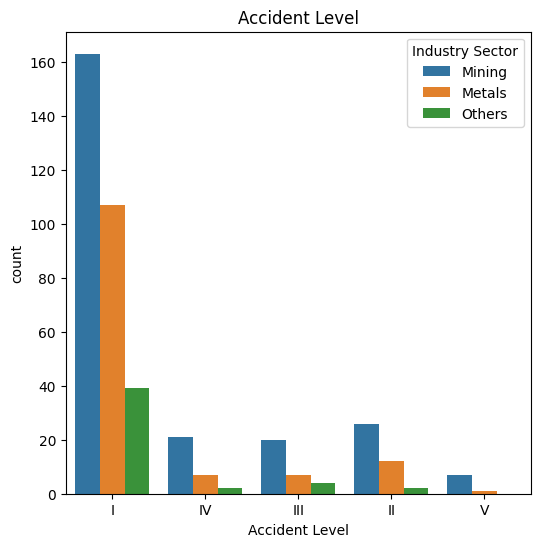

In [ ]:
plot("Accident Level", data, "bar", "Industry Sector")

**Accident** level I has more data, the given dataset is imbalanced - it might be challenge to train model on predicting other accident levels

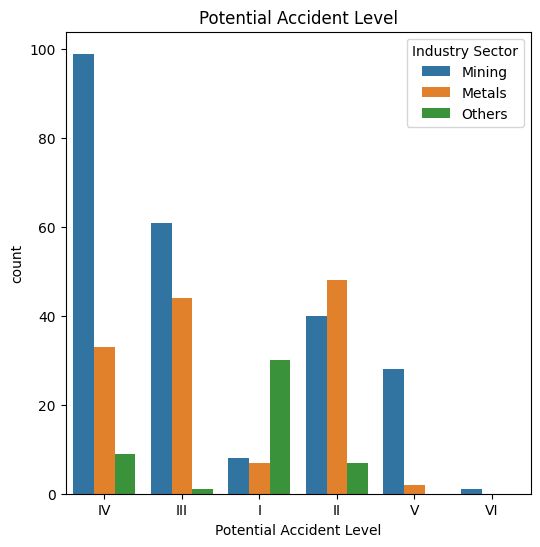

In [ ]:
plot("Potential Accident Level", data, "bar", "Industry Sector")

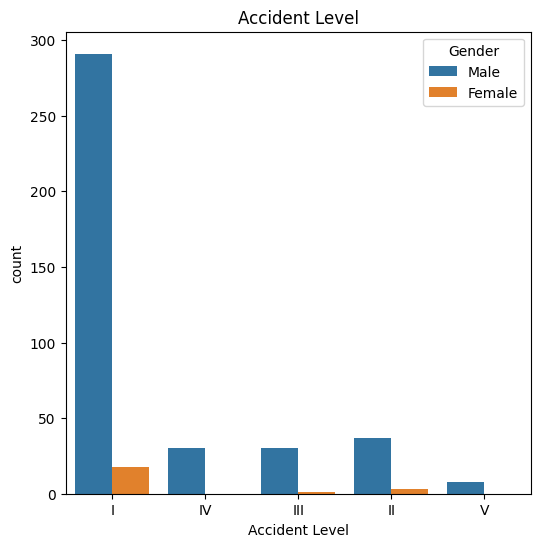

In [ ]:
plot("Accident Level", data, "bar", "Gender")

Male are involved in more accidents across levels, this is expected given the dataset has highly imbalanced Gender ratio

> Add blockquote

> Add blockquote





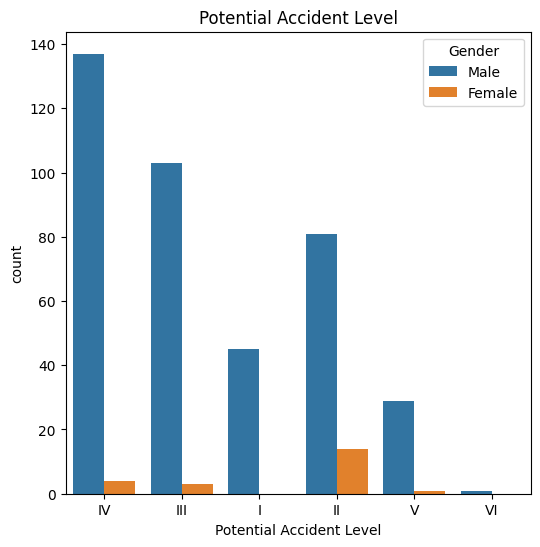

In [ ]:
plot("Potential Accident Level", data, "bar", "Gender")

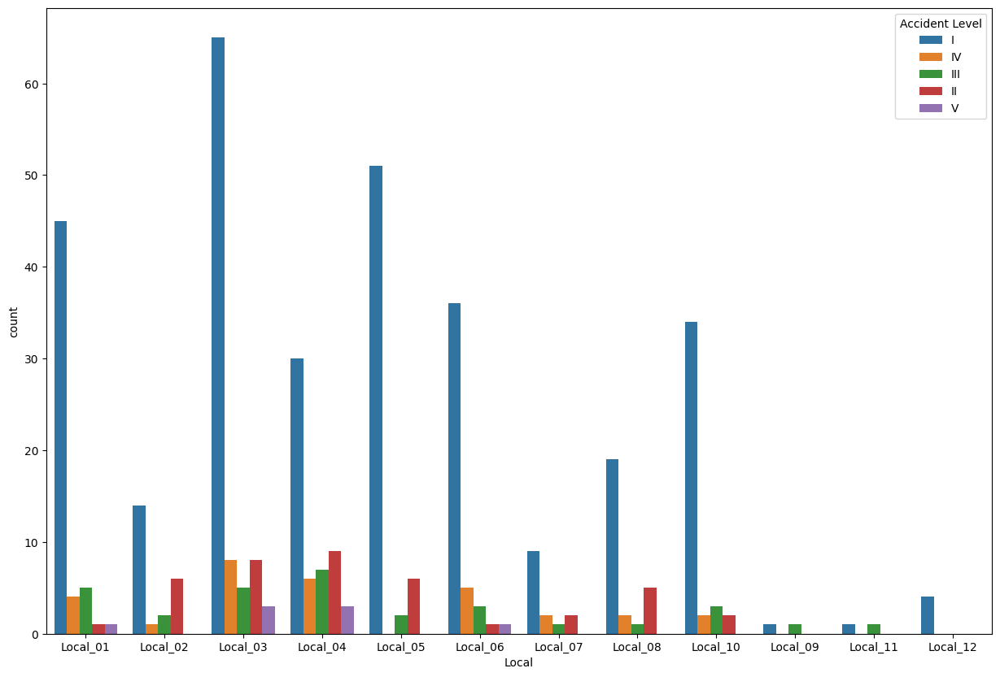

In [ ]:
plt.figure(figsize=(15,10))
sns.countplot(data=data, x='Local', hue='Accident Level')
plt.show()

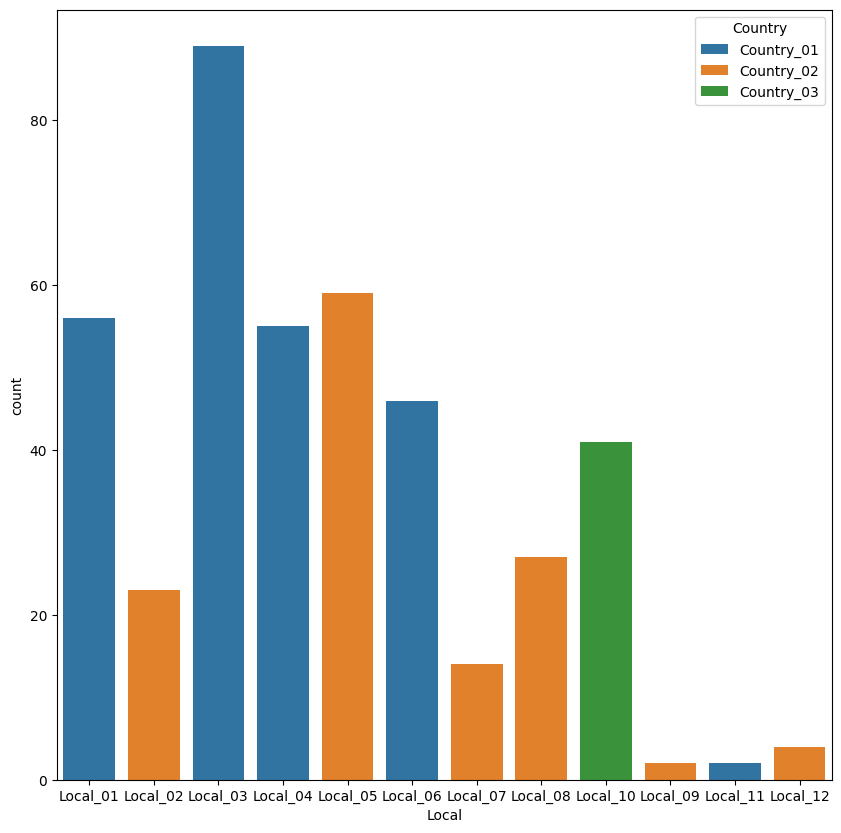

In [ ]:
plt.figure(figsize=(10,10))
sns.countplot(data=data, x='Local', hue='Country')
plt.show()

In [ ]:
country_cosstab= pd.crosstab(data["Country"], data["Local"])
country_cosstab

Local,Local_01,Local_02,Local_03,Local_04,Local_05,Local_06,Local_07,Local_08,Local_09,Local_10,Local_11,Local_12
Country,,,,,,,,,,,,
Country_01,56,0,89,55,0,46,0,0,0,0,2,0
Country_02,0,23,0,0,59,0,14,27,2,0,0,4
Country_03,0,0,0,0,0,0,0,0,0,41,0,0


From the above table it is noticed that Local column values have unique relation with Country column values.
<br>That is, every Local is related to only one country. As both Local and Countries gives the same info, we can remove Countries column from dataframe.

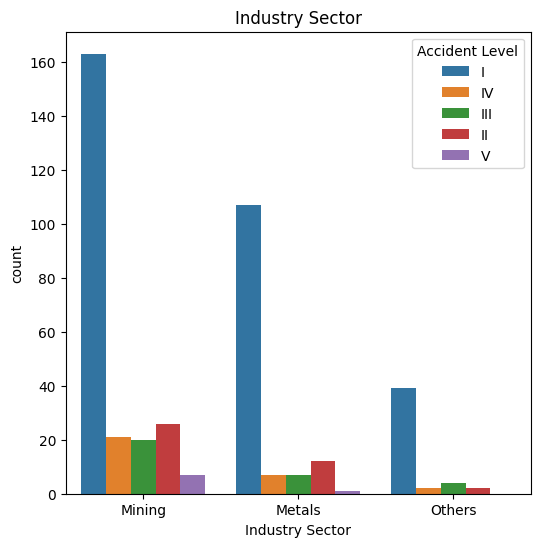

In [ ]:
plot("Industry Sector", data, "bar", "Accident Level")

Mining industry has highest no. of accidents, followed by metal industry

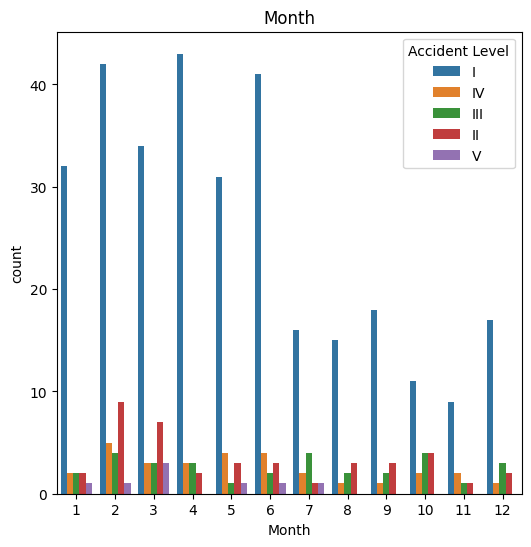

In [ ]:
plot("Month", data, "bar", "Accident Level")

Text(0, 0.5, 'Number of cases')

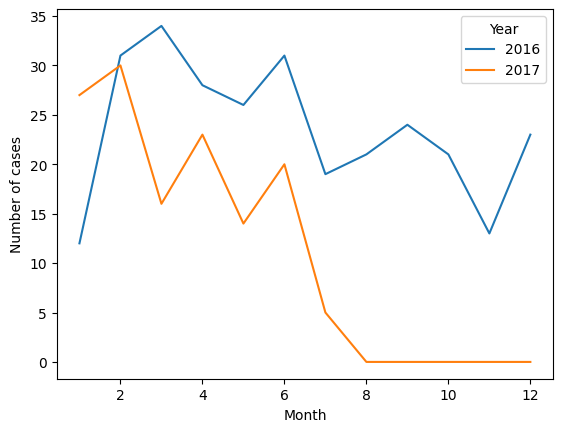

In [ ]:
date_crosstab = pd.crosstab(data["Month"], data["Year"])
date_crosstab.plot(kind='line')
plt.xlabel('Month')
plt.ylabel('Number of cases')

There is no data in 2017 from the month of August (8). <br> So this will not give any relavant information as data is missing to compare data 2017 to 2016. <br>
The last two graphs will also give misinformation as data is missing in 2017. We can probably delete date info(year, date) from the table.

###### Multivariate analysis

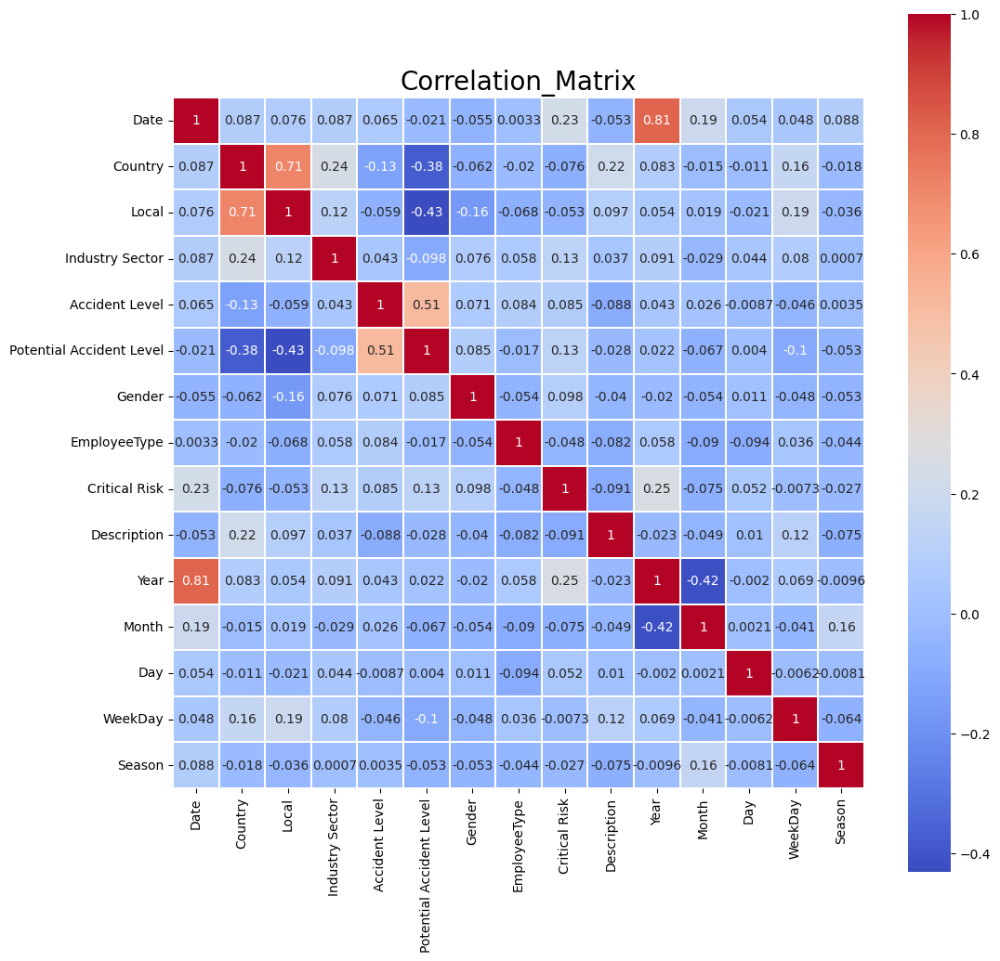

In [ ]:
# Calculate the correlation matrix
le = LabelEncoder()
df_encoder = data.apply(le.fit_transform)

plt.figure(figsize=(12,12))
plt.title('Correlation_Matrix', fontsize=20)
sns.heatmap(df_encoder.corr(), square=True, cmap='coolwarm', annot=True, linewidth=0.2);




1.   From the above heap map, Countries and Local are highly corellated with value 0.71
2.   Next, Accident level and Potential Accident Level are corellated with value .51

<br> This is in alignment with our analysis that Country and Local columns are related and we can drop any one.


In [ ]:
#Chi-Square test of Independence
# Hypothesis Testing for Accident Level and  Potential Accident Level

 #H0​: Accident Level and Potential accident level are not related.
 #Ha​: Accident Level and Potential accident level are related.

crosstab = pd.crosstab(data["Accident Level"], data["Potential Accident Level"])
crosstab

Potential Accident Level,I,II,III,IV,V,VI
Accident Level,,,,,,
I,45,88,89,78,9,0
II,0,7,14,16,3,0
III,0,0,3,26,2,0
IV,0,0,0,21,9,0
V,0,0,0,0,7,1


In [ ]:
chi2, p, dof, expected = chi2_contingency(crosstab)
print("Chi-squared Statistic:", chi2)
print("p-value:", p)
print("degree of freedom", dof)
reject_null = p < 0.05
print("Reject Null Hypothesis?:", reject_null)

if reject_null:
    print("We reject the null hypothesis. We have enough evidence to prove that the accident level and potential accident level are dependent.")
else:
    print("We fail to reject the null hypothesis. We do not have enough evidence to prove that the accident level distribution and potential accident level are not dependent.")


Chi-squared Statistic: 249.45260461536674
p-value: 1.4728348366116975e-41
degree of freedom 20
Reject Null Hypothesis?: True
We reject the null hypothesis. We have enough evidence to prove that the accident level and potential accident level are dependent.


In [ ]:
#Drop unnecessary columns as per EDA inferences
df = data.drop(columns=['Country', 'Date', 'Year', 'Day'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Local                     418 non-null    object
 1   Industry Sector           418 non-null    object
 2   Accident Level            418 non-null    object
 3   Potential Accident Level  418 non-null    object
 4   Gender                    418 non-null    object
 5   EmployeeType              418 non-null    object
 6   Critical Risk             418 non-null    object
 7   Description               418 non-null    object
 8   Month                     418 non-null    int64 
 9   WeekDay                   418 non-null    object
 10  Season                    418 non-null    object
dtypes: int64(1), object(10)
memory usage: 36.0+ KB


#### Step 3: Data preprocessing (NLP Preprocessing techniques)

###### Import/download necessary packages

In [ ]:
# to use regular expressions for manipulating text data
import re

# to load the natural language toolkit
import nltk
nltk.download('stopwords')    # loading the stopwords
nltk.download('wordnet')    # loading the wordnet module that is used in stemming

# to remove common stop words
from nltk.corpus import stopwords

# to perform stemming
from nltk.stem.porter import PorterStemmer

# to create Bag of Words
from sklearn.feature_extraction.text import CountVectorizer

# to import Word2Vec
from gensim.models import Word2Vec

# to import Glove
from gensim.scripts.glove2word2vec import glove2word2vec

#to import TFID
from sklearn.feature_extraction.text import TfidfVectorizer

# to display full text in dataframe
pd.set_option('display.max_colwidth', None)

#to tokenize
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

# to Lemmetize
from nltk.stem import WordNetLemmatizer
nltk.download("omw-1.4")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
#copying to dataframe for nlp processing
df_nlp=df.copy()

###### Removing Special Characters

In [ ]:
# defining a function to remove special characters
def remove_special_characters(text):
    # Defining the regex pattern to match non-alphanumeric characters
    pattern = '[^A-Za-z0-9]+'

    # Finding the specified pattern and replacing non-alphanumeric characters with a blank string
    new_text = ''.join(re.sub(pattern, ' ', text))

    return new_text

In [ ]:
# Applying the function to remove special characters
df_nlp['cleaned_text'] = data['Description'].apply(remove_special_characters)

In [ ]:
# Checking cleaned data
df_nlp.loc[0:2, ['Description','cleaned_text']]

,Description,cleaned_text
0,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo.",While removing the drill rod of the Jumbo 08 for maintenance the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo
1,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter.",During the activation of a sodium sulphide pump the piping was uncoupled and the sulfide solution was designed in the area to reach the maid Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital Note of sulphide solution 48 grams liter
2,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury.",In the sub station MILPO located at level 170 when the collaborator was doing the excavation work with a pick hand tool hitting a rock with the flat part of the beak it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of the left foot of the collaborator causing the injury


Notice that + sign is removed from the row3 before 170

###### Change to Lowercase

In [ ]:
# Changing test to lower case
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].str.lower()

# Checking lower case data
df_nlp.loc[0:2, ['Description','cleaned_text']]

,Description,cleaned_text
0,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo.",while removing the drill rod of the jumbo 08 for maintenance the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo
1,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter.",during the activation of a sodium sulphide pump the piping was uncoupled and the sulfide solution was designed in the area to reach the maid immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital note of sulphide solution 48 grams liter
2,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury.",in the sub station milpo located at level 170 when the collaborator was doing the excavation work with a pick hand tool hitting a rock with the flat part of the beak it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of the left foot of the collaborator causing the injury


###### Removing extra whitespace

In [ ]:
# Removing extra whitespaces from the text
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].str.strip()

# Checking cleaned data
df_nlp.loc[0:2, ['Description','cleaned_text']]

,Description,cleaned_text
0,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo.",while removing the drill rod of the jumbo 08 for maintenance the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo
1,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter.",during the activation of a sodium sulphide pump the piping was uncoupled and the sulfide solution was designed in the area to reach the maid immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital note of sulphide solution 48 grams liter
2,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury.",in the sub station milpo located at level 170 when the collaborator was doing the excavation work with a pick hand tool hitting a rock with the flat part of the beak it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of the left foot of the collaborator causing the injury


###### Removing numbers

In [ ]:

# Removing extra whitespaces from the text
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].replace(to_replace=r'\d', value='', regex=True)

# Checking cleaned data
df_nlp.loc[0:2, ['Description','cleaned_text']]

,Description,cleaned_text
0,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo.",while removing the drill rod of the jumbo for maintenance the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo
1,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter.",during the activation of a sodium sulphide pump the piping was uncoupled and the sulfide solution was designed in the area to reach the maid immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital note of sulphide solution grams liter
2,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury.",in the sub station milpo located at level when the collaborator was doing the excavation work with a pick hand tool hitting a rock with the flat part of the beak it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of the left foot of the collaborator causing the injury


###### Removing stop words

In [ ]:

# Defining a function to remove stop words (like pronouns) using the NLTK library
def remove_stopwords(text):
    # Split text into separate words
    words = text.split()

    # Removing English language stopwords
    new_text = ' '.join([word for word in words if word not in stopwords.words('english')])

    return new_text

In [ ]:
# Applying the function to remove stop words using the NLTK library
df_nlp['cleaned_text_without_stopwords'] = df_nlp['cleaned_text'].apply(remove_stopwords)

# Checking cleaned data with no stopwords
df_nlp.loc[0:2,['cleaned_text','cleaned_text_without_stopwords']]

,cleaned_text,cleaned_text_without_stopwords
0,while removing the drill rod of the jumbo for maintenance the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo,removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic supports one end drill equipment pull hands bar accelerate removal moment bar slides point support tightens fingers mechanic drilling bar beam jumbo
1,during the activation of a sodium sulphide pump the piping was uncoupled and the sulfide solution was designed in the area to reach the maid immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital note of sulphide solution grams liter,activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution grams liter
2,in the sub station milpo located at level when the collaborator was doing the excavation work with a pick hand tool hitting a rock with the flat part of the beak it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of the left foot of the collaborator causing the injury,sub station milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounces hitting steel tip safety shoe metatarsal area left foot collaborator causing injury


###### Tokenize

In [ ]:
#Tokenize sentence into words
df_nlp['cleaned_text_stopwords_token'] = df_nlp['cleaned_text_without_stopwords'].apply(word_tokenize)

# Checking token data
df_nlp.loc[0:2,['cleaned_text_stopwords_token','cleaned_text_without_stopwords']]

,cleaned_text_stopwords_token,cleaned_text_without_stopwords
0,"[removing, drill, rod, jumbo, maintenance, supervisor, proceeds, loosen, support, intermediate, centralizer, facilitate, removal, seeing, mechanic, supports, one, end, drill, equipment, pull, hands, bar, accelerate, removal, moment, bar, slides, point, support, tightens, fingers, mechanic, drilling, bar, beam, jumbo]",removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic supports one end drill equipment pull hands bar accelerate removal moment bar slides point support tightens fingers mechanic drilling bar beam jumbo
1,"[activation, sodium, sulphide, pump, piping, uncoupled, sulfide, solution, designed, area, reach, maid, immediately, made, use, emergency, shower, directed, ambulatory, doctor, later, hospital, note, sulphide, solution, grams, liter]",activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution grams liter
2,"[sub, station, milpo, located, level, collaborator, excavation, work, pick, hand, tool, hitting, rock, flat, part, beak, bounces, hitting, steel, tip, safety, shoe, metatarsal, area, left, foot, collaborator, causing, injury]",sub station milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounces hitting steel tip safety shoe metatarsal area left foot collaborator causing injury


###### Lemmetization

In [ ]:
# Initializing Lemmatizer
wnl = WordNetLemmatizer()

def apply_lemmetizer(text):

    for word in text:
      new_text = ' '.join([wnl.lemmatize(word) for word in text])

    return new_text

In [ ]:
# Applying the function to perform lemmetization
df_nlp['final_cleaned_text'] = df_nlp['cleaned_text_stopwords_token'].apply(apply_lemmetizer)

# checking a couple of instances of cleaned data
df_nlp.loc[0:2,['cleaned_text_without_stopwords','final_cleaned_text']]

,cleaned_text_without_stopwords,final_cleaned_text
0,removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic supports one end drill equipment pull hands bar accelerate removal moment bar slides point support tightens fingers mechanic drilling bar beam jumbo,removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic support one end drill equipment pull hand bar accelerate removal moment bar slide point support tightens finger mechanic drilling bar beam jumbo
1,activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution grams liter,activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution gram liter
2,sub station milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounces hitting steel tip safety shoe metatarsal area left foot collaborator causing injury,sub station milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounce hitting steel tip safety shoe metatarsal area left foot collaborator causing injury


###### Vectorization

In [ ]:
# Initializing CountVectorizer with top 1000 words
bow_vec = CountVectorizer(max_features = 1000)

# Applying TfidfVectorizer on data
data_features_BOW = bow_vec.fit_transform(df_nlp['final_cleaned_text'])

# Convert the data features to array
data_features_BOW = data_features_BOW.toarray()

# Shape of the feature vector
data_features_BOW.shape

(418, 1000)

In [ ]:
# Getting the 1000 words considered by the BoW model
words = bow_vec.get_feature_names_out()
# Checking the words considered by BoW model
words

array(['able', 'abruptly', 'access', 'accessory', 'accident',
       'accompanied', 'accumulation', 'acid', 'across', 'action',
       'activated', 'activates', 'activity', 'additive', 'adjustment',
       'advance', 'affected', 'ahead', 'aid', 'air', 'albino', 'align',
       'allergic', 'allergy', 'alone', 'along', 'aluminum', 'amount',
       'ampoloader', 'anchor', 'anfoloader', 'ankle', 'anode', 'another',
       'apparently', 'approach', 'approaching', 'approx', 'approximate',
       'approximately', 'area', 'arm', 'around', 'arranged', 'asks',
       'assembly', 'assistant', 'assisted', 'atlas', 'attached', 'attack',
       'attacked', 'attempt', 'attended', 'attention', 'autoclave',
       'auxiliary', 'avoid', 'away', 'back', 'backwards', 'bag',
       'balance', 'bank', 'bar', 'barbed', 'base', 'basket', 'beam',
       'bearing', 'bee', 'begin', 'behind', 'belt', 'bend', 'big', 'bit',
       'bite', 'bitten', 'blade', 'blasting', 'block', 'blocked', 'blow',
       'blowing', 

In [ ]:
# Creating a DataFrame from the data features
df_BOW = pd.DataFrame(data_features_BOW, columns=bow_vec.get_feature_names_out())
df_BOW.head()

,able,abruptly,access,accessory,accident,accompanied,accumulation,acid,across,action,activated,activates,activity,additive,adjustment,advance,affected,ahead,aid,air,albino,align,allergic,allergy,alone,along,aluminum,amount,ampoloader,anchor,anfoloader,ankle,anode,another,apparently,approach,approaching,approx,approximate,approximately,area,arm,around,arranged,asks,assembly,assistant,assisted,atlas,attached,attack,attacked,attempt,attended,attention,autoclave,auxiliary,avoid,away,back,backwards,bag,balance,bank,bar,barbed,base,basket,beam,bearing,bee,begin,behind,belt,bend,big,bit,bite,bitten,blade,blasting,block,blocked,blow,blowing,blunt,board,body,boiler,bolt,boltec,bolter,bomb,boot,bottom,bounce,box,bp,brace,brake,branch,break,broken,bruise,bucket,bumped,burn,burning,cabin,cabinet,cable,called,came,camera,canvas,cap,car,care,carried,carry,carrying,cart,cat,cathode,caught,cause,caused,causing,cell,cement,center,central,cervical,chain,chamber,change,channel,check,cheekbone,chest,chimney,chin,chisel,chuck,chute,chuteo,circumstance,city,clamp,clean,cleaned,cleaning,clearing,clerk,climb,climbing,clinic,close,closed,closing,cloth,cm,cmxcmxcm,co,cocada,coil,collaborator,colleague,collection,come,coming,communicates,company,complete,completed,composed,compressed,concentrate,concrete,cone,connection,contact,container,contaminated,continue,continued,control,contusion,conveyor,convoy,coordinated,cord,corner,corrugated,could,coupling,cover,covered,crane,cross,crown,current,cut,cutter,cutting,cx,cylinder,da,day,de,decide,decided,decides,deep,degree,descending,described,detached,diameter,dining,directed,direction,disassembled,discharge,discomfort,disk,displacement,distal,distance,divine,doctor,door,drainage,drawer,drill,driller,drilling,driver,drop,dropped,dry,due,dust,duty,ear,easel,edge,effect,effort,electric,electrical,electrician,electrolysis,electrowelded,embedded,emergency,employee,empty,encountered,end,energized,engine,engineer,enter,entered,entering,enters,entrance,entry,epp,epps,equipment,evacuated,evacuation,evaluate,evaluated,evaluation,event,exchange,excoriation,execution,exit,explosive,extension,eye,face,fact,fall,falling,false,fan,feeder,feel,fell,felt,fence,fenced,field,fifth,filling,filter,find,finding,fine,finger,finished,fire,first,fit,fixed,fixing,flange,flash,floor,flow,followed,following,foot,force,forearm,forehead,forest,forklift,form,forward,found,four,fourth,fracture,fragment,frame,free,front,fuel,full,furnace,gable,gallery,gate,general,generates,generating,geological,geologist,get,getting,girdle,give,glass,glove,go,goggles,going,got,gps,gr,grab,grating,grid,ground,grp,guard,guide,guillotine,gun,gutter,hammer,hand,handle,handling,happened,hat,hdp,hdpe,head,heading,heard,heated,heavy,height,held,helical,helmet,help,helper,high,highway,hit,hitting,hoist,hold,holder,holding,hole,hook,hooked,hopper,horizontally,horse,hose,hospital,hot,hour,house,housing,hq,hurried,hw,hydraulic,identified,identify,immediately,impact,impacted,impacting,imprisoned,imprisons,impromec,inch,incident,incimmet,including,increase,index,indicated,industrial,ingot,initial,injured,injury,inner,inside,inspect,inspection,installation,installing,instant,instep,interior,intermediate,internal,intersection,involved,iron,irritation,jacket,jhonatan,jumbo,jump,key,kg,km,knee,knife,la,ladder,lamp,lane,last,later,leaching,leaf,leak,leakage,leaning,leather,leave,leaving,left,leg,length,lens,lesion,level,lever,license,lid,lift,lifted,lifting,light,limb,line,lip,liquid,litorina,little,load,loader,loading,local,localized,located,lock,locked,locking,locomotive,long,loose,loosen,lose,loses,loud,low,lower,lt,luis,lunch,machete,machine,made,magnetometric,maid,main,maintenance,make,making,maneuver,manipulating,manoel,manual,manually,maperu,mapping,marco,maribondos,mask,master,material,mean,mechanic,mechanical,medical,member,mesh,metal,metallic,metatarsal,meter,middle,mild,mill,mine,mineral,mining,minor,mixkret,mobile,moment,mooring,motor,mouth,move,moved,movement,mo

###### Word2Vec Embedding

In [ ]:
# creating a list of all words in our data
words_list = [item.split(" ") for item in df_nlp['final_cleaned_text'].values]

# Checking the words from the first five reviews
words_list[0:5]

[['removing',
  'drill',
  'rod',
  'jumbo',
  'maintenance',
  'supervisor',
  'proceeds',
  'loosen',
  'support',
  'intermediate',
  'centralizer',
  'facilitate',
  'removal',
  'seeing',
  'mechanic',
  'support',
  'one',
  'end',
  'drill',
  'equipment',
  'pull',
  'hand',
  'bar',
  'accelerate',
  'removal',
  'moment',
  'bar',
  'slide',
  'point',
  'support',
  'tightens',
  'finger',
  'mechanic',
  'drilling',
  'bar',
  'beam',
  'jumbo'],
 ['activation',
  'sodium',
  'sulphide',
  'pump',
  'piping',
  'uncoupled',
  'sulfide',
  'solution',
  'designed',
  'area',
  'reach',
  'maid',
  'immediately',
  'made',
  'use',
  'emergency',
  'shower',
  'directed',
  'ambulatory',
  'doctor',
  'later',
  'hospital',
  'note',
  'sulphide',
  'solution',
  'gram',
  'liter'],
 ['sub',
  'station',
  'milpo',
  'located',
  'level',
  'collaborator',
  'excavation',
  'work',
  'pick',
  'hand',
  'tool',
  'hitting',
  'rock',
  'flat',
  'part',
  'beak',
  'bounce',


In [ ]:
# creating an instance of Word2Vec
model_W2V = Word2Vec(words_list, vector_size = 100, min_count = 1, window=5, workers = 6)
# Checking the size of the vocabulary
print("Length of the vocabulary is", len(list(model_W2V.wv.key_to_index)))

Length of the vocabulary is 2800


In [ ]:
# Dictionary with key as words and the value as the embedding vector.

words = list(model_W2V.wv.key_to_index.keys())

# Retrieving word vectors for all the words present in the model's vocabulary
wvs = model_W2V.wv[words].tolist()

# Creating a dictionary of words and their corresponding vectors
word_vector_dict = dict(zip(words, wvs))

In [ ]:
def average_vectorizer_Word2Vec(doc):
    # Initializing a feature vector for the sentence
    feature_vector = np.zeros((vec_size,), dtype="float64")

    # Creating a list of words in the sentence that are present in the model vocabulary
    words_in_vocab = [word for word in doc.split() if word in words]

    # adding the vector representations of the words
    for word in words_in_vocab:
        feature_vector += np.array(word_vector_dict[word])

    # Dividing by the number of words to get the average vector
    if len(words_in_vocab) != 0:
        feature_vector /= len(words_in_vocab)

    return feature_vector

In [ ]:
# creating a dataframe of the vectorized documents
vec_size = 100
df_word2vec = pd.DataFrame(df_nlp['final_cleaned_text'].apply(average_vectorizer_Word2Vec).tolist(), columns=['Feature '+str(i) for i in range(vec_size)])
df_word2vec

,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17,Feature 18,Feature 19,Feature 20,Feature 21,Feature 22,Feature 23,Feature 24,Feature 25,Feature 26,Feature 27,Feature 28,Feature 29,Feature 30,Feature 31,Feature 32,Feature 33,Feature 34,Feature 35,Feature 36,Feature 37,Feature 38,Feature 39,Feature 40,Feature 41,Feature 42,Feature 43,Feature 44,Feature 45,Feature 46,Feature 47,Feature 48,Feature 49,Feature 50,Feature 51,Feature 52,Feature 53,Feature 54,Feature 55,Feature 56,Feature 57,Feature 58,Feature 59,Feature 60,Feature 61,Feature 62,Feature 63,Feature 64,Feature 65,Feature 66,Feature 67,Feature 68,Feature 69,Feature 70,Feature 71,Feature 72,Feature 73,Feature 74,Feature 75,Feature 76,Feature 77,Feature 78,Feature 79,Feature 80,Feature 81,Feature 82,Feature 83,Feature 84,Feature 85,Feature 86,Feature 87,Feature 88,Feature 89,Feature 90,Feature 91,Feature 92,Feature 93,Feature 94,Feature 95,Feature 96,Feature 97,Feature 98,Feature 99
0,-0.010853,0.020547,0.005375,-2.240915e-03,0.001997,-0.028157,0.006820,0.036147,-0.005286,-0.013776,-0.014756,-0.027444,-0.005455,0.002394,0.002100,-0.012731,-2.398028e-04,-0.029227,-0.002906,-0.031793,0.011095,0.009675,0.002929,-0.005923,-0.007694,0.001864,-0.019409,-0.014207,-0.019993,0.000057,0.016635,0.003181,1.024854e-03,-0.013923,-0.006169,0.012964,0.006393,-0.016192,-0.009012,-0.031610,0.001852,-0.016327,-0.004483,0.002451,0.016484,-0.007774,-0.018939,2.269392e-03,0.007388,0.017157,0.006435,-0.017414,-0.008086,-0.009292,-0.012344,0.011447,0.005183,-0.005222,-0.020776,7.913968e-04,0.006416,0.003569,-0.006255,0.002391,-0.020580,0.017828,0.002866,0.014274,-0.020424,0.026225,-0.016350,0.012527,0.024639,-0.006678,0.019729,0.008666,-0.000045,-0.005449,-0.014707,0.006593,-0.011309,-0.004738,-0.018564,0.030252,0.000353,0.003804,-0.002595,0.024898,0.022078,0.003241,0.018453,0.010212,0.004373,0.005605,0.028741,0.016709,0.008705,-0.012103,0.006409,-0.006034
1,-0.004616,0.009492,0.000739,-7.922249e-04,-0.000834,-0.010280,0.001925,0.015885,0.001348,-0.005405,-0.005171,-0.011610,-0.002235,0.001352,0.000452,-0.004559,2.218579e-03,-0.010917,-0.003119,-0.012339,0.006182,0.003048,0.000517,-0.000877,-0.003482,0.000920,-0.006669,-0.005157,-0.008463,-0.000597,0.005898,0.000892,1.273722e-04,-0.005487,-0.003291,0.008170,0.001339,-0.007797,-0.004052,-0.013361,-0.001077,-0.005474,-0.001497,0.000410,0.004890,-0.005149,-0.007524,1.790682e-03,0.001989,0.004215,0.002689,-0.009527,-0.002728,-0.003291,-0.004751,0.004388,0.001506,-0.001612,-0.007822,-6.422810e-04,0.001114,0.002370,-0.000255,-0.000210,-0.009445,0.007675,0.001495,0.006687,-0.009303,0.010048,-0.006069,0.004986,0.010948,-0.003086,0.008785,0.002961,-0.001677,-0.002906,-0.007609,0.001743,-0.002600,-0.001839,-0.008553,0.012533,-0.000946,0.000685,-0.001735,0.009657,0.008161,0.000624,0.008117,0.004937,0.000916,0.002784,0.014321,0.008871,0.003808,-0.005125,0.003032,-0.001531
2,-0.012793,0.025319,0.004520,5.304264e-04,0.005309,-0.030145,0.008713,0.039265,-0.004062,-0.016231,-0.015653,-0.028472,-0.004704,0.003203,0.003589,-0.014580,3.790047e-04,-0.029135,-0.006013,-0.033785,0.010427,0.009020,0.002954,-0.008326,-0.007213,-0.000114,-0.020657,-0.015482,-0.021392,0.001127,0.016274,0.002995,1.046101e-03,-0.014594,-0.006680,0.016914,0.006251,-0.018416,-0.010446,-0.035941,-0.000731,-0.016865,-0.005815,0.000331,0.017991,-0.010731,-0.020461,2.621187e-03,0.008665,0.017051,0.006704,-0.018906,-0.009744,-0.008969,-0.014305,0.012018,0.006396,-0.003570,-0.020403,1.408939e-03,0.008462,0.005094,-0.004121,-0.000851,-0.022701,0.018504,0.000771,0.016650,-0.025287,0.026366,-0.014155,0.013495,0.027343,-0.005023,0.019760,0.010480,-0.001107,-0.005537,-0.016177,0.006005,-0.014141,-0.004454,-0.021435,0.029012,-0.000441,0.004842,-0.001216,0.024746,0.024719,0.002038,0.018090,0.012996,0.006681,0.008585,0.032990,0.017581,0.007786,-0.013036,0.007046,-0.004

###### Glove Embedding

In [ ]:
pip install gensim

In [ ]:
#use this if you are directly downloading from the site

#!wget http://nlp.stanford.edu/data/glove.6B.zip
#!unzip glove.6B.zip

#from gensim.scripts.glove2word2vec import glove2word2vec
#glove_input_file = 'glove.6B.100d.txt'
#word2vec_output_file = 'glove.6B.100d.txt.word2vec'
#glove2word2vec(glove_input_file, word2vec_output_file)

In [ ]:
from gensim.scripts.glove2word2vec import glove2word2vec
glove_input_file = '/content/drive/My Drive/Colab Notebooks/glove.6B.100d.txt'
word2vec_output_file = 'glove.6B.100d.txt.word2vec'
glove2word2vec(glove_input_file, word2vec_output_file)

(400000, 100)

In [ ]:
from gensim.models import KeyedVectors
# load the Stanford GloVe model
filename = 'glove.6B.100d.txt.word2vec'
glove_model = KeyedVectors.load_word2vec_format(filename, binary=False)

In [ ]:
# Checking the size of the vocabulary
print("Length of the vocabulary is", len(glove_model.index_to_key))

Length of the vocabulary is 400000


In [ ]:
#List of words in the vocabulary
words = glove_model.index_to_key
#Dictionary with key as the word and the value as the corresponding embedding vector.
word_vector_dict = dict(zip(glove_model.index_to_key,list(glove_model.vectors)))
#Defining the dimension of the embedded vector.
vec_size=100

In [ ]:
def average_vectorizer_GloVe(doc):
    # Initializing a feature vector for the sentence
    feature_vector = np.zeros((vec_size,), dtype="float64")

    # Creating a list of words in the sentence that are present in the model vocabulary
    words_in_vocab = [word for word in doc.split() if word in words]

    # adding the vector representations of the words
    for word in words_in_vocab:
        feature_vector += np.array(word_vector_dict[word])

    # Dividing by the number of words to get the average vector
    if len(words_in_vocab) != 0:
        feature_vector /= len(words_in_vocab)

    return feature_vector

In [ ]:
# Creating a dataframe of the vectorized documents
df_glove = pd.DataFrame(df_nlp['final_cleaned_text'].apply(average_vectorizer_GloVe).tolist(), columns=['Feature '+str(i) for i in range(vec_size)])
df_glove

,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17,Feature 18,Feature 19,Feature 20,Feature 21,Feature 22,Feature 23,Feature 24,Feature 25,Feature 26,Feature 27,Feature 28,Feature 29,Feature 30,Feature 31,Feature 32,Feature 33,Feature 34,Feature 35,Feature 36,Feature 37,Feature 38,Feature 39,Feature 40,Feature 41,Feature 42,Feature 43,Feature 44,Feature 45,Feature 46,Feature 47,Feature 48,Feature 49,Feature 50,Feature 51,Feature 52,Feature 53,Feature 54,Feature 55,Feature 56,Feature 57,Feature 58,Feature 59,Feature 60,Feature 61,Feature 62,Feature 63,Feature 64,Feature 65,Feature 66,Feature 67,Feature 68,Feature 69,Feature 70,Feature 71,Feature 72,Feature 73,Feature 74,Feature 75,Feature 76,Feature 77,Feature 78,Feature 79,Feature 80,Feature 81,Feature 82,Feature 83,Feature 84,Feature 85,Feature 86,Feature 87,Feature 88,Feature 89,Feature 90,Feature 91,Feature 92,Feature 93,Feature 94,Feature 95,Feature 96,Feature 97,Feature 98,Feature 99
0,-0.104074,0.085043,-0.006874,-0.117856,-0.047997,-0.262621,-0.220739,0.233383,-0.020247,0.153795,0.030064,-0.066967,0.075305,0.021312,0.047142,-0.096180,-0.053975,-0.025514,-0.025976,-0.038412,0.077116,-0.038864,0.027478,-0.189773,0.289805,0.141860,-0.362076,-0.230692,0.068778,-0.038065,-0.129387,0.257542,0.014375,0.148728,-0.108855,0.007931,0.007585,-0.107753,0.133805,-0.140516,-0.189102,-0.282783,0.198150,-0.239388,-0.141640,0.026585,-0.143630,-0.047483,-0.076828,-0.529719,-0.064704,0.093672,-0.132642,0.792717,-0.108362,-1.245691,0.010391,-0.314867,1.299591,0.317367,0.014671,0.214499,0.229937,0.448987,0.371565,0.123599,0.163902,0.077562,0.008870,-0.116395,-0.056969,-0.124979,0.087753,-0.113326,0.152483,0.056962,0.013259,0.141870,-0.229118,-0.039120,0.374872,-0.136357,-0.252443,-0.063580,-0.725687,0.033864,0.317773,0.005882,0.004755,-0.197971,-0.161009,0.104659,-0.117153,0.055421,-0.017000,-0.119250,0.085884,-0.166344,0.460105,0.049004
1,-0.260657,0.222551,-0.037376,0.059230,0.048171,0.049342,-0.025612,0.298147,0.088059,0.113739,0.119546,-0.066295,-0.057286,0.308257,0.196786,-0.181216,-0.042313,-0.024512,-0.180914,-0.190796,-0.032796,-0.109833,-0.124461,0.112727,-0.042324,0.165175,-0.047378,0.003852,0.045869,0.095636,0.147486,0.291462,-0.134003,0.122430,0.082004,0.093402,0.118938,0.098432,0.164193,0.058668,0.030141,-0.154764,-0.168232,-0.335609,0.234516,0.139116,-0.200756,-0.101201,-0.165461,-0.196688,0.000077,0.070191,0.057763,0.589206,-0.277074,-1.300450,-0.334990,-0.217926,0.848220,0.155052,0.077902,0.166048,0.082566,0.320544,0.492050,-0.027020,0.208240,-0.242667,0.129008,-0.418419,-0.140058,-0.250426,0.197868,0.109494,0.137582,0.164373,0.155112,-0.037666,-0.344431,-0.192659,0.174955,0.032303,-0.331479,0.120331,-0.751755,0.279108,0.453428,0.030619,-0.203554,-0.151350,-0.008167,-0.069979,-0.288788,0.023639,-0.156443,-0.020904,0.110019,-0.199682,0.167008,-0.127085
2,-0.069923,0.097646,0.039634,-0.173443,-0.034290,-0.148609,-0.009568,0.094570,-0.053122,0.140734,0.134343,-0.212128,0.363301,0.110846,0.188240,0.000159,0.047959,-0.125856,-0.104772,-0.050605,0.337794,0.234857,-0.045871,-0.052403,0.334046,-0.018769,-0.193461,-0.258070,0.110092,-0.029366,-0.063248,0.117778,0.204283,0.146004,0.007462,-0.019896,-0.132005,-0.044717,0.153674,-0.058143,-0.073183,-0.101065,0.197508,-0.162663,0.074115,0.142624,0.059339,-0.022627,0.020403,-0.338296,-0.045206,0.101116,-0.214144,0.657989,-0.080803,-1.585619,-0.253716,-0.190774,1.196851,0.414516,0.115869,0.570089,0.004932,0.438396,0.387068,-0.002619,0.304828,-0.051145,0.127153,-0.171310,-0.160158,0.157538,0.182794,-0.141734,0.248294,-0.177318,0.047835,0.246789,-0.102835,0.135122,0.316227,0.311679,-0.452130,-0.073952,-0.676841,-0.178936,0.138034,0.029425,-0.077797,0.024991,-0.165579,-0.017992,-0.049247,0.146886,-0.147412,0.107798,-0.093446,-0.186209,0.497690,-0.142333
3,-0.121608,-0.009518,0.091875,-0.170958,0.015582,0.043

###### TF-IDF Embedding

In [ ]:
vec_tfidf = TfidfVectorizer()

corpus=df_nlp['final_cleaned_text'].values
# Fit and transform the corpus
tfidf = vec_tfidf.fit_transform(corpus)

# Get the feature names (words)
features = vec_tfidf.get_feature_names_out()

# Print the feature names
print("Feature names:", features)

# Convert TF-IDF matrix to DataFrame
df_tfidf = pd.DataFrame(tfidf.toarray(), columns=features)
df_tfidf

Feature names: ['abb' 'abdomen' 'able' ... 'zinco' 'zn' 'zone']


#### Step 4: Data preparation - Cleansed data in .xlsx or .csv file

In [ ]:
df_nlp.head(2)

In [ ]:
#deleting unwanted columns
df_nlp_cln=df_nlp.drop(['Description', 'cleaned_text', 'cleaned_text_without_stopwords', 'cleaned_text_stopwords_token'], axis=1)
df_nlp_cln.info()

###### Label Encoding

In [ ]:
df_nlp_cln.head(2)

In [ ]:
#Since Weekday, Seasons, Accident level and Potential Accident level are ordinal, we will apply Label Encoding on these two columns
le = LabelEncoder()
df_nlp_cln['Accident Level'] = le.fit_transform(df_nlp_cln['Accident Level']).astype(np.int8)
df_nlp_cln['Potential Accident Level'] = le.fit_transform(df_nlp_cln['Potential Accident Level']).astype(np.int8)
df_nlp_cln['Season'] = le.fit_transform(df_nlp_cln['Season']).astype(np.int8)
df_nlp_cln['WeekDay'] = le.fit_transform(df_nlp_cln['WeekDay']).astype(np.int8)

df_nlp_cln.head(5)

###### One Hot Encoding-Dummies

In [ ]:
#Applying One Hot Encoding using dummy values approach on other columns
Local_dummies = pd.get_dummies(df_nlp_cln['Local'], columns=["Local"], drop_first=True).astype(np.int8)
Gender_dummies = pd.get_dummies(df_nlp_cln['Gender'], columns=["Gender"], drop_first=True).astype(np.int8)
Industry_dummies = pd.get_dummies(df_nlp_cln['Industry Sector'], columns=['Industry Sector'], prefix='IS', drop_first=True).astype(np.int8)
EmpType_dummies = pd.get_dummies(df_nlp_cln['EmployeeType'], columns=['EmployeeType'], prefix='EmpType', drop_first=True).astype(np.int8)
CR_dummies = pd.get_dummies(df_nlp_cln['Critical Risk'], columns=['Critical Risk'], prefix='CR', drop_first=True).astype(np.int8)

In [ ]:
#Merge the above dataframe with the original dataframe
df_nlp_cln= df_nlp_cln.join(Local_dummies.reset_index(drop=True)).join(Gender_dummies.reset_index(drop=True)).join(Industry_dummies.reset_index(drop=True)).join(EmpType_dummies.reset_index(drop=True)).join(CR_dummies.reset_index(drop=True))
df_nlp_cln.head()

In [ ]:
df_nlp_cln.info()

###### Dataframe column clean-up: Final Dataframe

In [ ]:
#deleting original columns that were one hot encoded
df_nlp_cln.drop(['Local', 'Gender', 'Industry Sector', 'EmployeeType', 'Critical Risk','final_cleaned_text'], axis=1, inplace=True)
df_nlp_cln.head(1)

In [ ]:
#Merging the data with Glove dataframe
feature_df_final_glove = df_nlp_cln.join(pd.DataFrame(df_glove).reset_index(drop=True))
feature_df_final_glove.head()

In [ ]:
#Saving the data to an excel sheet
feature_df_final_glove.to_excel('drive/My Drive/AIML/feature_df_final_glove.xlsx')

In [ ]:
#Merging the data with word2vec dataframe
feature_df_final_word2vec = df_nlp_cln.join(pd.DataFrame(df_word2vec).reset_index(drop=True))
feature_df_final_word2vec.head()

In [ ]:
#Saving the data to an excel sheet
feature_df_final_word2vec.to_excel('drive/My Drive/AIML/feature_df_final_word2vec.xlsx')

In [ ]:
#Merging the data with TFIDF dataframe
feature_df_final_tfidf = df_nlp_cln.join(pd.DataFrame(df_tfidf).reset_index(drop=True))
feature_df_final_tfidf.head()

In [ ]:
#Saving the data to an excel sheet
feature_df_final_tfidf.to_excel('drive/My Drive/AIML/feature_df_final_tfidf.xlsx')

#### Step 5: Design train and test basic machine learning classifiers

###### X and Y from this session

In [ ]:
# splitting data into X and y- skip this step of you are importing data from the saved feature set file
"""
X_w2v = feature_df_final_word2vec.drop(['Accident Level','Potential Accident Level'], axis = 1)
X_glove = feature_df_final_glove.drop(['Accident Level','Potential Accident Level'], axis = 1)
X_tfidf = feature_df_final_tfidf.drop(['Accident Level','Potential Accident Level'], axis = 1)
y_w2v = feature_df_final_word2vec['Accident Level']
y_glove= feature_df_final_glove['Accident Level']
y_tfidf= feature_df_final_tfidf['Accident Level']

#for potential accident level as target
y_w2v_pot = feature_df_final_word2vec['Potential Accident Level']
y_glove_pot= feature_df_final_glove['Potential Accident Level']
y_tfidf_pot= feature_df_final_tfidf['Potential Accident Level']"""

###### X and Y from Imported from dataset

In [ ]:
#df_w2v_import = pd.read_excel('drive/My Drive/AIML/feature_df_final_word2vec.xlsx')
#df_glove_import = pd.read_excel('drive/My Drive/AIML/feature_df_final_glove.xlsx')
#df_tfidf_import= pd.read_excel('drive/My Drive/AIML/feature_df_final_tfidf.xlsx')
df_w2v_import = pd.read_excel('drive/My Drive/AI ML - UT Austin/Project/feature_df_final_word2vec.xlsx')
df_glove_import = pd.read_excel('drive/My Drive/AI ML - UT Austin/Project/feature_df_final_glove.xlsx')
df_tfidf_import= pd.read_excel('drive/My Drive/AI ML - UT Austin/Project/feature_df_final_tfidf.xlsx')

In [ ]:
#Alternate Read for Files from Local PC
df_w2v_import = pd.read_excel('feature_df_final_word2vec.xlsx')
df_glove_import = pd.read_excel('feature_df_final_glove.xlsx')
df_tfidf_import= pd.read_excel('feature_df_final_tfidf.xlsx')

In [ ]:
df_w2v_import.head(2)

,Unnamed: 0,Accident Level,Potential Accident Level,Month,WeekDay,Season,Local_02,Local_03,Local_04,Local_05,Local_06,Local_07,Local_08,Local_09,Local_10,Local_11,Local_12,Male,IS_Mining,IS_Others,EmpType_Third Party,EmpType_Third Party (Remote),CR_Bees,CR_Blocking and isolation of energies,CR_Burn,CR_Chemical substances,CR_Confined space,CR_Cut,CR_Electrical Shock,CR_Electrical installation,CR_Fall,CR_Fall prevention,CR_Fall prevention (same level),CR_Individual protection equipment,CR_Liquid Metal,CR_Machine Protection,CR_Manual Tools,CR_Others,CR_Plates,CR_Poll,CR_Power lock,CR_Pressed,CR_Pressurized Systems,CR_Pressurized Systems / Chemical Substances,CR_Projection,CR_Projection of fragments,CR_Projection/Burning,CR_Projection/Choco,CR_Projection/Manual Tools,CR_Suspended Loads,CR_Traffic,CR_Vehicles and Mobile Equipment,CR_Venomous Animals,CR_remains of choco,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17,Feature 18,Feature 19,Feature 20,Feature 21,Feature 22,Feature 23,Feature 24,Feature 25,Feature 26,Feature 27,Feature 28,Feature 29,Feature 30,Feature 31,Feature 32,Feature 33,Feature 34,Feature 35,Feature 36,Feature 37,Feature 38,Feature 39,Feature 40,Feature 41,Feature 42,Feature 43,Feature 44,Feature 45,Feature 46,Feature 47,Feature 48,Feature 49,Feature 50,Feature 51,Feature 52,Feature 53,Feature 54,Feature 55,Feature 56,Feature 57,Feature 58,Feature 59,Feature 60,Feature 61,Feature 62,Feature 63,Feature 64,Feature 65,Feature 66,Feature 67,Feature 68,Feature 69,Feature 70,Feature 71,Feature 72,Feature 73,Feature 74,Feature 75,Feature 76,Feature 77,Feature 78,Feature 79,Feature 80,Feature 81,Feature 82,Feature 83,Feature 84,Feature 85,Feature 86,Feature 87,Feature 88,Feature 89,Feature 90,Feature 91,Feature 92,Feature 93,Feature 94,Feature 95,Feature 96,Feature 97,Feature 98,Feature 99
0,0,0,3,1,0,2,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,-0.010853,0.020547,0.005375,-0.002241,0.001997,-0.028157,0.006820,0.036147,-0.005286,-0.013776,-0.014756,-0.027444,-0.005455,0.002394,0.002100,-0.012731,-0.000240,-0.029227,-0.002906,-0.031793,0.011095,0.009675,0.002929,-0.005923,-0.007694,0.001864,-0.019409,-0.014207,-0.019993,0.000057,0.016635,0.003181,0.001025,-0.013923,-0.006169,0.012964,0.006393,-0.016192,-0.009012,-0.031610,0.001852,-0.016327,-0.004483,0.002451,0.016484,-0.007774,-0.018939,0.002269,0.007388,0.017157,0.006435,-0.017414,-0.008086,-0.009292,-0.012344,0.011447,0.005183,-0.005222,-0.020776,0.000791,0.006416,0.003569,-0.006255,0.002391,-0.020580,0.017828,0.002866,0.014274,-0.020424,0.026225,-0.016350,0.012527,0.024639,-0.006678,0.019729,0.008666,-0.000045,-0.005449,-0.014707,0.006593,-0.011309,-0.004738,-0.018564,0.030252,0.000353,0.003804,-0.002595,0.024898,0.022078,0.003241,0.018453,0.010212,0.004373,0.005605,0.028741,0.016709,0.008705,-0.012103,0.006409,-0.006034
1,1,0,3,1,2,2,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,-0.004616,0.009492,0.000739,-0.000792,-0.000834,-0.010280,0.001925,0.015885,0.001348,-0.005405,-0.005171,-0.011610,-0.002235,0.001352,0.000452,-0.004559,0.002219,-0.010917,-0.003119,-0.012339,0.006182,0.003048,0.000517,-0.000877,-0.003482,0.000920,-0.006669,-0.005157,-0.008463,-0.000597,0.005898,0.000892,0.000127,-0.005487,-0.003291,0.008170,0.001339,-0.007797,-0.004052,-0.013361,-0.001077,-0.005474,-0.001497,0.000410,0.004890,-0.005149,-0.007524,0.001791,0.001989,0.004215,0.002689,-0.009527,-0.002728,-0.003291,-0.004751,0.004388,0.001506,-0.001612,-0.007822,-0.000642,0.001114,0.002370,-0.000255,-0.000210,-0.009445,0.007675,0.001495,0.006687,-0.009303,0.010048,-0.006069,0.004986,0.010948,-0.003086,0.008785,0.002961,-0.001677,-0.002906,-0.007609,0.001743,-0.002600,-0.001839,-0.008553,0.012533,-0.000946,0.000685,-0.001735,0.009657,0.008161,0.000624,0.00811

In [ ]:
#Deleting Unnamed column
df_w2v_import = df_w2v_import.drop(df_w2v_import.columns[[0]],axis = 1)
df_w2v_import.head(2)

,Accident Level,Potential Accident Level,Month,WeekDay,Season,Local_02,Local_03,Local_04,Local_05,Local_06,Local_07,Local_08,Local_09,Local_10,Local_11,Local_12,Male,IS_Mining,IS_Others,EmpType_Third Party,EmpType_Third Party (Remote),CR_Bees,CR_Blocking and isolation of energies,CR_Burn,CR_Chemical substances,CR_Confined space,CR_Cut,CR_Electrical Shock,CR_Electrical installation,CR_Fall,CR_Fall prevention,CR_Fall prevention (same level),CR_Individual protection equipment,CR_Liquid Metal,CR_Machine Protection,CR_Manual Tools,CR_Others,CR_Plates,CR_Poll,CR_Power lock,CR_Pressed,CR_Pressurized Systems,CR_Pressurized Systems / Chemical Substances,CR_Projection,CR_Projection of fragments,CR_Projection/Burning,CR_Projection/Choco,CR_Projection/Manual Tools,CR_Suspended Loads,CR_Traffic,CR_Vehicles and Mobile Equipment,CR_Venomous Animals,CR_remains of choco,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17,Feature 18,Feature 19,Feature 20,Feature 21,Feature 22,Feature 23,Feature 24,Feature 25,Feature 26,Feature 27,Feature 28,Feature 29,Feature 30,Feature 31,Feature 32,Feature 33,Feature 34,Feature 35,Feature 36,Feature 37,Feature 38,Feature 39,Feature 40,Feature 41,Feature 42,Feature 43,Feature 44,Feature 45,Feature 46,Feature 47,Feature 48,Feature 49,Feature 50,Feature 51,Feature 52,Feature 53,Feature 54,Feature 55,Feature 56,Feature 57,Feature 58,Feature 59,Feature 60,Feature 61,Feature 62,Feature 63,Feature 64,Feature 65,Feature 66,Feature 67,Feature 68,Feature 69,Feature 70,Feature 71,Feature 72,Feature 73,Feature 74,Feature 75,Feature 76,Feature 77,Feature 78,Feature 79,Feature 80,Feature 81,Feature 82,Feature 83,Feature 84,Feature 85,Feature 86,Feature 87,Feature 88,Feature 89,Feature 90,Feature 91,Feature 92,Feature 93,Feature 94,Feature 95,Feature 96,Feature 97,Feature 98,Feature 99
0,0,3,1,0,2,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,-0.011391,0.019539,0.005037,-0.001186,0.000264,-0.027592,0.006185,0.035908,-0.006610,-0.012498,-0.016226,-0.026945,-0.004458,0.003966,0.002733,-0.014317,0.000835,-0.028687,-0.002087,-0.032298,0.012612,0.008773,0.003588,-0.005270,-0.006541,0.002910,-0.020650,-0.014154,-0.019608,-0.000338,0.017284,0.003972,0.000696,-0.014957,-0.00536,0.013549,0.005534,-0.016424,-0.008909,-0.032758,0.000412,-0.016006,-0.005172,0.001264,0.016677,-0.006267,-0.017369,0.002550,0.007144,0.017377,0.008351,-0.016884,-0.007985,-0.007540,-0.012374,0.012227,0.005867,-0.005535,-0.020720,0.000629,0.004614,0.003622,-0.006843,0.002838,-0.021073,0.017466,0.002683,0.014828,-0.021249,0.026359,-0.016745,0.011570,0.025020,-0.006876,0.019745,0.009426,0.000155,-0.006066,-0.013756,0.007337,-0.011324,-0.004601,-0.017766,0.029461,-0.001988,0.001783,-0.001889,0.024445,0.022100,0.003630,0.017229,0.010601,0.004675,0.004973,0.028542,0.015719,0.007889,-0.012283,0.005376,-0.005002
1,0,3,1,2,2,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,-0.004790,0.009005,0.000574,-0.000356,-0.001509,-0.009943,0.001616,0.015639,0.000862,-0.004875,-0.005683,-0.011285,-0.001818,0.001970,0.000691,-0.005156,0.002635,-0.010610,-0.002738,-0.012396,0.006723,0.002641,0.000777,-0.000599,-0.002999,0.001351,-0.007058,-0.005087,-0.008222,-0.000749,0.006081,0.001198,0.000015,-0.005806,-0.00292,0.008321,0.000971,-0.007775,-0.003964,-0.013689,-0.001629,-0.005285,-0.001732,-0.000070,0.004864,-0.004508,-0.006811,0.001868,0.001853,0.004220,0.003428,-0.009220,-0.002631,-0.002542,-0.004689,0.004665,0.001758,-0.001720,-0.007648,-0.000722,0.000363,0.002396,-0.000487,-0.000081,-0.009561,0.007441,0.001414,0.006853,-0.009519,0.009970,-0.006136,0.004581,0.011008,-0.003112,0.008724,0.003226,-0.001584,-0.003123,-0.007171,0.001980,-0.002539,-0.001732,-0.008126,0.012065,-0.001839,-0.000115,-0.001438,0.009345,0.008068,0.000776,0.007566,0.005012,0.00

In [ ]:
#Deleting Unnamed column
df_glove_import = df_glove_import.drop(df_glove_import.columns[[0]],axis = 1)
df_tfidf_import = df_tfidf_import.drop(df_tfidf_import.columns[[0]],axis = 1)

In [ ]:
X_w2v = df_w2v_import.drop(['Accident Level','Potential Accident Level'], axis = 1)
X_glove = df_glove_import.drop(['Accident Level','Potential Accident Level'], axis = 1)
X_tfidf = df_tfidf_import.drop(['Accident Level','Potential Accident Level'], axis = 1)
y_w2v = df_w2v_import['Accident Level']
y_glove= df_glove_import['Accident Level']
y_tfidf= df_tfidf_import['Accident Level']

#for potential accident level as target
y_w2v_pot = df_w2v_import['Potential Accident Level']
y_glove_pot= df_glove_import['Potential Accident Level']
y_tfidf_pot= df_tfidf_import['Potential Accident Level']

###### Splitting data

In [ ]:
def split(X,y):
    # Initial split into training (80%) and testing (20%)
    if np.min(np.bincount(y)) < 2:
    #Remove stratification if y has single sample - required in case of potential accident level V
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    else:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)
    return X_train,X_test,y_train,y_test

In [ ]:
#Splitting the dataset
X_train_w2v,X_test_w2v,y_train_w2v,y_test_w2v=split(X_w2v,y_w2v)
X_train_glove,X_test_glove,y_train_glove,y_test_glove=split(X_glove,y_glove)
X_train_tfidf,X_test_tfidf,y_train_tfidf,y_test_tfidf=split(X_tfidf,y_tfidf)

In [ ]:
print(X_train_w2v.shape, X_test_w2v.shape, y_train_w2v.shape, y_test_w2v.shape)
print(X_train_glove.shape, X_test_glove.shape, y_train_glove.shape, y_test_glove.shape)
print(X_train_tfidf.shape, X_test_tfidf.shape, y_train_tfidf.shape, y_test_tfidf.shape)

(334, 151) (84, 151) (334,) (84,)
(334, 151) (84, 151) (334,) (84,)
(334, 2838) (84, 2838) (334,) (84,)


###### Define Scaling, PCA and sampling functions

In [ ]:
#Define Standardization of data
def standard_scaler(X_train, X_test):
    scaler = StandardScaler().set_output(transform="pandas")
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    return X_train_scaled, X_test_scaled

In [ ]:
# Define PCA dimensiom reduction
def pca_sklearn(X_train, X_test, n_components):
    pca = PCA(n_components=n_components).set_output(transform="pandas")
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)
    return X_train_pca, X_test_pca


In [ ]:
# Data balancing- Upsampling

def oversampling(X_train, y_train, target):
    X_upsample = pd.concat([X_train, y_train], axis=1)
    # Get the majority and minority class
    acclevel_0 = X_upsample[X_upsample['Accident Level'] == 0]
    acclevel_1 = X_upsample[X_upsample['Accident Level'] == 1]
    acclevel_2 = X_upsample[X_upsample['Accident Level'] == 2]
    acclevel_3 = X_upsample[X_upsample['Accident Level'] == 3]
    acclevel_4 = X_upsample[X_upsample['Accident Level'] == 4]

# Upsample minority classes
    acclevel1_upsampled = resample(acclevel_1, replace = True, n_samples = len(acclevel_0), random_state = 1)
    acclevel2_upsampled = resample(acclevel_2, replace = True, n_samples = len(acclevel_0), random_state = 1)
    acclevel3_upsampled = resample(acclevel_3, replace = True, n_samples = len(acclevel_0), random_state = 1)
    acclevel4_upsampled = resample(acclevel_4, replace = True, n_samples = len(acclevel_0), random_state = 1)
    df_upsampled = pd.concat([acclevel_0, acclevel1_upsampled, acclevel2_upsampled, acclevel3_upsampled, acclevel4_upsampled])
    print(df_upsampled[target].value_counts())
    #df_upsampled.to_csv(file_name)
    X_train_up = df_upsampled.drop([target], axis = 1) # Considering all Predictors
    y_train_up = df_upsampled[target]
    return X_train_up, y_train_up

In [ ]:
# Data balancing- SMOTE
def SMOTE_upsampling(X_train, y_train):
    sm = SMOTE(random_state=7)
    X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)
    print(y_train_smote.value_counts())
    return X_train_smote, y_train_smote

###### Datasets for w2v

In [ ]:
# PCA and Upsampled
X_train_w2v_pca, X_test_w2v_pca = pca_sklearn(X_train_w2v, X_test_w2v, 0.95)
X_train_w2v_up, y_train_w2v_up = oversampling(X_train_w2v_pca, y_train_w2v, 'Accident Level')

# X_train_w2v_up, y_train_w2v_up, X_test_w2v_pca, y_test_w2v - use these to pass on  to model

Accident Level
0    247
1    247
2    247
3    247
4    247
Name: count, dtype: int64


In [ ]:
# PCA and SMOTE
X_train_w2v_pca, X_test_w2v_pca = pca_sklearn(X_train_w2v, X_test_w2v, 0.95)
X_train_w2v_smote, y_train_w2v_smote = SMOTE_upsampling(X_train_w2v_pca, y_train_w2v, 'Accident Level')

# X_train_w2v_smote, y_train_w2v_smote, X_test_w2v_pca, y_test_w2v - use these to pass on  to model

Accident Level
0    247
1    247
2    247
3    247
4    247
Name: count, dtype: int64


###### Datasets for Glove

In [ ]:
# PCA and Upsampled
X_train_glove_pca, X_test_glove_pca = pca_sklearn(X_train_glove, X_test_glove, 0.95)
X_train_glove_up, y_train_glove_up = oversampling(X_train_glove_pca, y_train_glove, 'Accident Level')

# X_train_glove_up, y_train_glove_up, X_test_glove_pca, y_test_glove - use these to pass on  to model

Accident Level
0    247
1    247
2    247
3    247
4    247
Name: count, dtype: int64


In [ ]:
# PCA and SMOTE
X_train_glove_pca, X_test_glove_pca = pca_sklearn(X_train_glove, X_test_glove, 0.95)
X_train_glove_smote, y_train_glove_smote = SMOTE_upsampling(X_train_glove_pca, y_train_glove, 'Accident Level')

# X_train_glove_smote, y_train_glove_smote, X_test_glove_pca, y_test_glove - use these to pass on  to model

Accident Level
0    247
1    247
2    247
3    247
4    247
Name: count, dtype: int64


###### Datasets on TFIDF

In [ ]:
# PCA and Upsampled
X_train_tfidf_pca, X_test_tfidf_pca = pca_sklearn(X_train_tfidf, X_test_tfidf, 0.95)
X_train_tfidf_up, y_train_tfidf_up = oversampling(X_train_tfidf_pca, y_train_tfidf, 'Accident Level')

# X_train_glove_up, y_train_glove_up, X_test_glove_pca, y_test_glove - use these to pass on  to model

Accident Level
0    247
1    247
2    247
3    247
4    247
Name: count, dtype: int64


In [ ]:
# PCA and SMOTE
X_train_tfidf_pca, X_test_tfidf_pca = pca_sklearn(X_train_tfidf, X_test_tfidf, 0.95)
X_train_tfidf_smote, y_train_tfidf_smote = SMOTE_upsampling(X_train_tfidf_pca, y_train_tfidf, 'Accident Level')

# X_train_glove_smote, y_train_glove_smote, X_test_glove_pca, y_test_glove - use these to pass on  to model

Accident Level
0    247
1    247
2    247
3    247
4    247
Name: count, dtype: int64


##### Model building and training

In [ ]:
def runAllModelDefault(X_train,Y_train,X_test,Y_test,descriptionOfData):
    listOfModel = {
        'KNN' : KNeighborsClassifier(n_neighbors=7,weights='distance'),
        'Ridge': RidgeClassifier(alpha=1.0,max_iter=1000,solver='auto',tol=1e-3),
        'LogisticRegression': LogisticRegression(max_iter=1000, random_state=7),
        'GradientBoost': GradientBoostingClassifier(random_state=7),
        'SVM': SVC(kernel= 'rbf'),
        'Bagging': BaggingClassifier(),
        'RandomForest': RandomForestClassifier(n_estimators = 100, max_depth = 7, random_state = 7, class_weight = "balanced"),
        'DecisionTree': DecisionTreeClassifier(criterion='entropy',random_state=7, max_depth=6, min_samples_leaf=5),
        'AdaBoost': AdaBoostClassifier(n_estimators= 50),
        'XGBoost': XGBClassifier(),
        #'Gradient Boost': GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.05)
    }

    nameofModel=[]
    trainAccScore=[]
    testAccScore=[]
    precissionSc=[]
    recallSc=[]
    f1Sc=[]

    for name, model in listOfModel.items():
       print("="*100)
       print("Model : ",name)
       print("="*100)
       print("\n\n")
       model.fit(X_train,Y_train)
       y_predict = model.predict(X_test)
       trainAccuracyScore = model.score(X_train,Y_train)
       testAccuracyScore = model.score(X_test,Y_test)
       precisionScore = precision_score(Y_test,y_predict,average='weighted')
       recallScore = recall_score(Y_test,y_predict,average='weighted')
       f1Score = f1_score(Y_test,y_predict,average='weighted')
       print("=="*20)
       print('Classification - Heatmap')
       print("=="*20)
       print("\n")
       classificationMatrix = confusion_matrix(Y_test,y_predict)
       sns.heatmap(classificationMatrix,annot=True,fmt=".4f",xticklabels = ["I", "II", "III", "IV", "V"] , yticklabels = ["I", "II", "III", "IV", "V"] )
       plt.ylabel('Actual')
       plt.xlabel('Predicted')
       plt.show()
       print("\n")
       print("=="*20)
       classificationReport = classification_report(Y_test,y_predict)
       print('Classification - Report')
       print("=="*20)
       print("\n")
       print(classification_report)
       nameofModel.append(name)
       trainAccScore.append(trainAccuracyScore)
       testAccScore.append(testAccuracyScore)
       precissionSc.append(precisionScore)
       recallSc.append(recallScore)
       f1Sc.append(f1Score)

       resultDF = pd.DataFrame({'Description Of Data':descriptionOfData,
                                'ModelName':nameofModel,
                                'Train Accuracy':trainAccScore,
                                'Test Accuracy':testAccScore,
                                'Precision':precissionSc,
                                'Recall':recallSc,
                                'F1':f1Sc})
       print("=="*20)
       print("Models Performance Summary")
       print("=="*20)
       print(resultDF)
    return resultDF

###### Accident Level as Target

In [ ]:
combinedResultDF = pd.DataFrame(columns=['Description Of Data','ModelName','Train Accuracy','Test Accuracy','Precision','Recall','F1'])

Model :  KNN



Classification - Heatmap




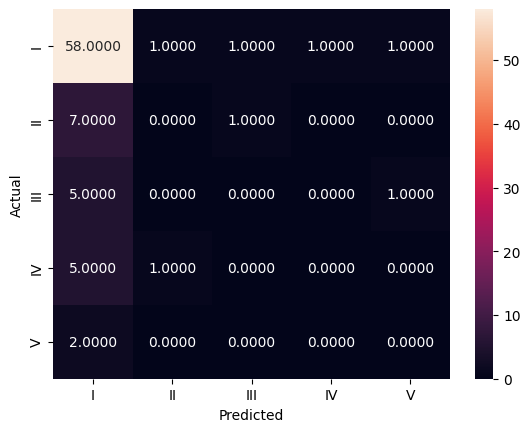



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident       KNN        0.997006       0.690476   

   Precision    Recall        F1  
0   0.555968  0.690476  0.615964  
Model :  Ridge



Classification - Heatmap




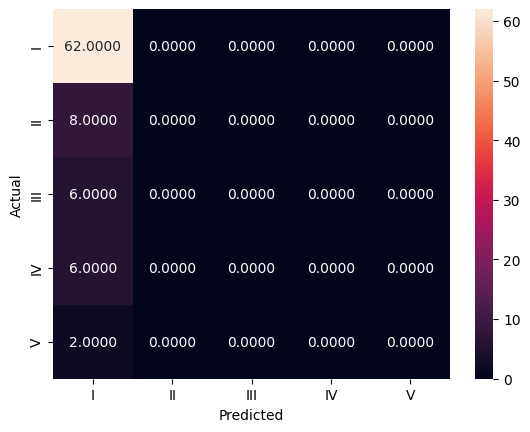



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident       KNN        0.997006       0.690476   
1  Word2Vec-Basic-Accident     Ridge        0.763473       0.738095   

   Precision    Recall        F1  
0   0.555968  0.690476  0.615964  
1   0.544785  0.738095  0.626875  
Model :  LogisticRegression



Classification - Heatmap




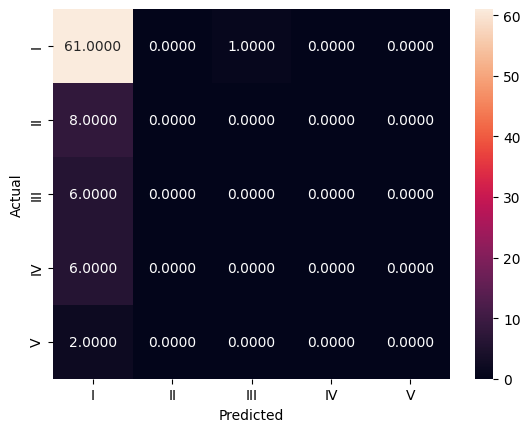



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident                 KNN        0.997006       0.690476   
1  Word2Vec-Basic-Accident               Ridge        0.763473       0.738095   
2  Word2Vec-Basic-Accident  LogisticRegression        0.742515       0.726190   

   Precision    Recall        F1  
0   0.555968  0.690476  0.615964  
1   0.544785  0.738095  0.626875  
2   0.542456  0.726190  0.621018  
Model :  GradientBoost



Classification - Heatmap




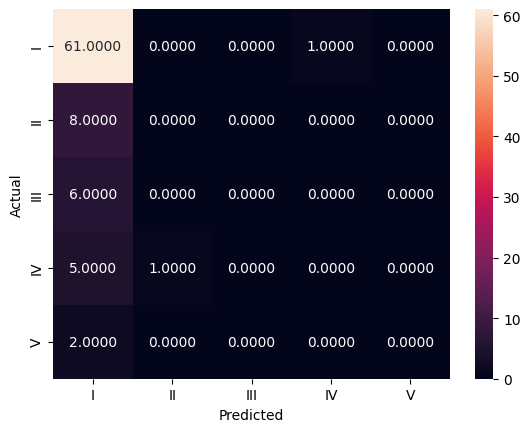



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident                 KNN        0.997006       0.690476   
1  Word2Vec-Basic-Accident               Ridge        0.763473       0.738095   
2  Word2Vec-Basic-Accident  LogisticRegression        0.742515       0.726190   
3  Word2Vec-Basic-Accident       GradientBoost        0.997006       0.726190   

   Precision    Recall        F1  
0   0.555968  0.690476  0.615964  
1   0.544785  0.738095  0.626875  
2   0.542456  0.726190  0.621018  
3   0.549071  0.726190  0.625331  
Model :  SVM



Classification - Heatmap




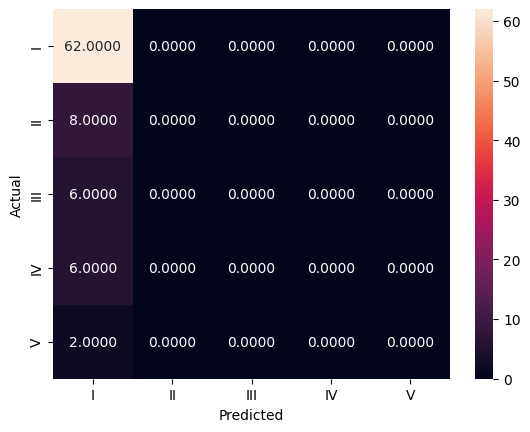



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident                 KNN        0.997006       0.690476   
1  Word2Vec-Basic-Accident               Ridge        0.763473       0.738095   
2  Word2Vec-Basic-Accident  LogisticRegression        0.742515       0.726190   
3  Word2Vec-Basic-Accident       GradientBoost        0.997006       0.726190   
4  Word2Vec-Basic-Accident                 SVM        0.739521       0.738095   

   Precision    Recall        F1  
0   0.555968  0.690476  0.615964  
1   0.544785  0.738095  0.626875  
2   0.542456  0.726190  0.621018  
3   0.549071  0.726190  0.625331  
4   0.544785  0.738095  0.626875  
Model :  Bagging



Classification - Heatmap




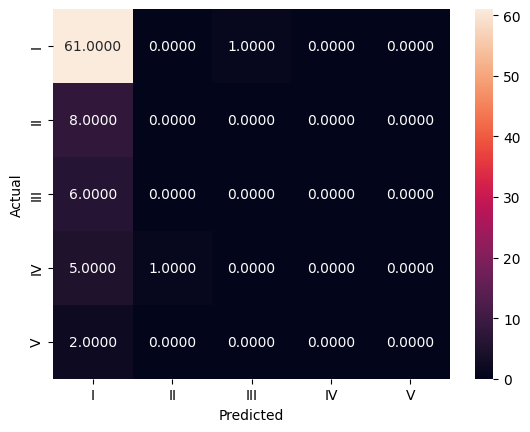



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident                 KNN        0.997006       0.690476   
1  Word2Vec-Basic-Accident               Ridge        0.763473       0.738095   
2  Word2Vec-Basic-Accident  LogisticRegression        0.742515       0.726190   
3  Word2Vec-Basic-Accident       GradientBoost        0.997006       0.726190   
4  Word2Vec-Basic-Accident                 SVM        0.739521       0.738095   
5  Word2Vec-Basic-Accident             Bagging        0.967066       0.726190   

   Precision    Recall        F1  
0   0.555968  0.690476  0.615964  
1   0.544785  0.738095  0.626875  
2   0.542456  0.726190  0.621018  
3   0.549071  0.726190  0.625331  
4   0.544785  0.738095  0.626875  
5   0.549071  0.726190  0.625331  
Model :  RandomForest



Classification - Heatmap




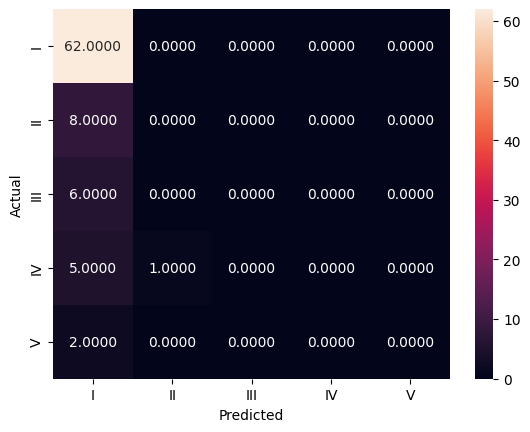



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident                 KNN        0.997006       0.690476   
1  Word2Vec-Basic-Accident               Ridge        0.763473       0.738095   
2  Word2Vec-Basic-Accident  LogisticRegression        0.742515       0.726190   
3  Word2Vec-Basic-Accident       GradientBoost        0.997006       0.726190   
4  Word2Vec-Basic-Accident                 SVM        0.739521       0.738095   
5  Word2Vec-Basic-Accident             Bagging        0.967066       0.726190   
6  Word2Vec-Basic-Accident        RandomForest        0.997006       0.738095   

   Precision    Recall        F1  
0   0.555968  0.690476  0.615964  
1   0.544785  0.738095  0.626875  
2   0.542456  0.726190  0.621018  
3   0.549071  0.726190  0.625331  
4   0.544785  0.738095  0.626875  
5   0.549071  0.726190  0.625331  


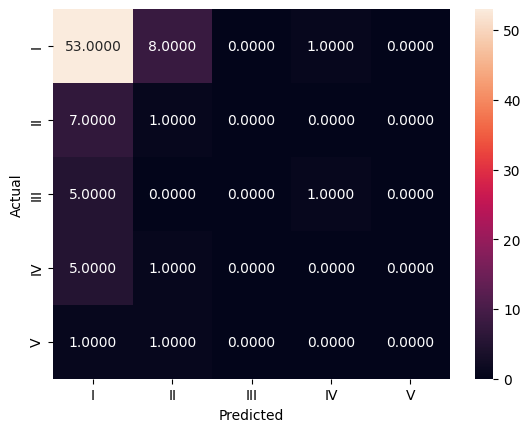



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident                 KNN        0.997006       0.690476   
1  Word2Vec-Basic-Accident               Ridge        0.763473       0.738095   
2  Word2Vec-Basic-Accident  LogisticRegression        0.742515       0.726190   
3  Word2Vec-Basic-Accident       GradientBoost        0.997006       0.726190   
4  Word2Vec-Basic-Accident                 SVM        0.739521       0.738095   
5  Word2Vec-Basic-Accident             Bagging        0.967066       0.726190   
6  Word2Vec-Basic-Accident        RandomForest        0.997006       0.738095   
7  Word2Vec-Basic-Accident        DecisionTree        0.799401       0.642857   

   Precision    Recall        F1  
0   0.555968  0.690476  0.615964  
1   0.544785  0.738095  0.626875  
2   0.542456  0.726190  0.621018  
3   0.549071  0.726190  

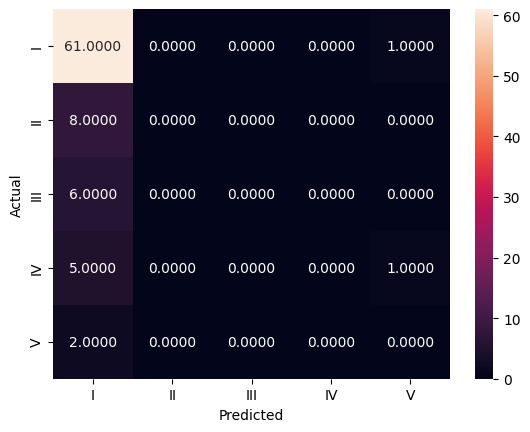



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident                 KNN        0.997006       0.690476   
1  Word2Vec-Basic-Accident               Ridge        0.763473       0.738095   
2  Word2Vec-Basic-Accident  LogisticRegression        0.742515       0.726190   
3  Word2Vec-Basic-Accident       GradientBoost        0.997006       0.726190   
4  Word2Vec-Basic-Accident                 SVM        0.739521       0.738095   
5  Word2Vec-Basic-Accident             Bagging        0.967066       0.726190   
6  Word2Vec-Basic-Accident        RandomForest        0.997006       0.738095   
7  Word2Vec-Basic-Accident        DecisionTree        0.799401       0.642857   
8  Word2Vec-Basic-Accident            AdaBoost        0.733533       0.726190   

   Precision    Recall        F1  
0   0.555968  0.690476  0.615964  
1   0.544785 

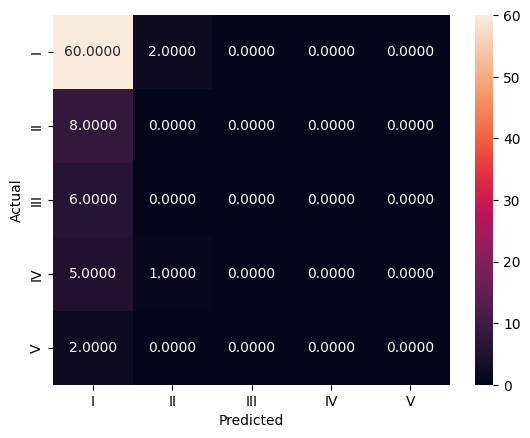



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
       Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Word2Vec-Basic-Accident                 KNN        0.997006       0.690476   
1  Word2Vec-Basic-Accident               Ridge        0.763473       0.738095   
2  Word2Vec-Basic-Accident  LogisticRegression        0.742515       0.726190   
3  Word2Vec-Basic-Accident       GradientBoost        0.997006       0.726190   
4  Word2Vec-Basic-Accident                 SVM        0.739521       0.738095   
5  Word2Vec-Basic-Accident             Bagging        0.967066       0.726190   
6  Word2Vec-Basic-Accident        RandomForest        0.997006       0.738095   
7  Word2Vec-Basic-Accident        DecisionTree        0.799401       0.642857   
8  Word2Vec-Basic-Accident            AdaBoost        0.733533       0.726190   
9  Word2Vec-Basic-Accident             XGBoost        0.997006       0.714286   

  

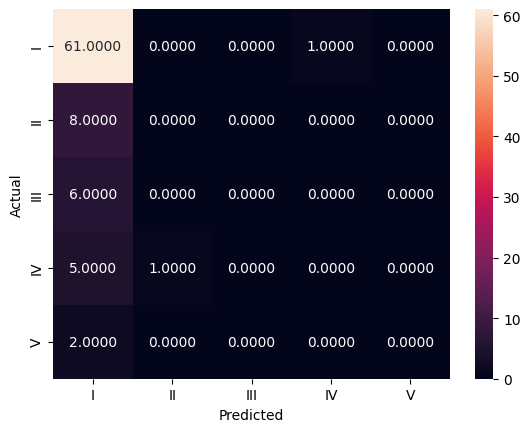



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
        Description Of Data           ModelName  Train Accuracy  \
0   Word2Vec-Basic-Accident                 KNN        0.997006   
1   Word2Vec-Basic-Accident               Ridge        0.763473   
2   Word2Vec-Basic-Accident  LogisticRegression        0.742515   
3   Word2Vec-Basic-Accident       GradientBoost        0.997006   
4   Word2Vec-Basic-Accident                 SVM        0.739521   
5   Word2Vec-Basic-Accident             Bagging        0.967066   
6   Word2Vec-Basic-Accident        RandomForest        0.997006   
7   Word2Vec-Basic-Accident        DecisionTree        0.799401   
8   Word2Vec-Basic-Accident            AdaBoost        0.733533   
9   Word2Vec-Basic-Accident             XGBoost        0.997006   
10  Word2Vec-Basic-Accident      Gradient Boost        0.925150   

    Test Accuracy  Precision    Recall        F1  
0        0.690476   0.555968  0.690476

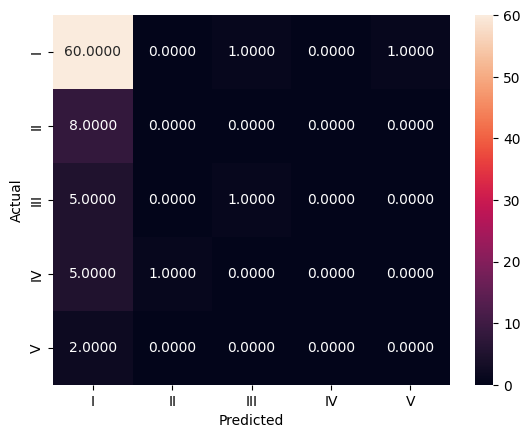



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision  \
0  Glove-Basic-Accident       KNN        0.997006        0.72619   0.589286   

    Recall      F1  
0  0.72619  0.6416  
Model :  Ridge



Classification - Heatmap




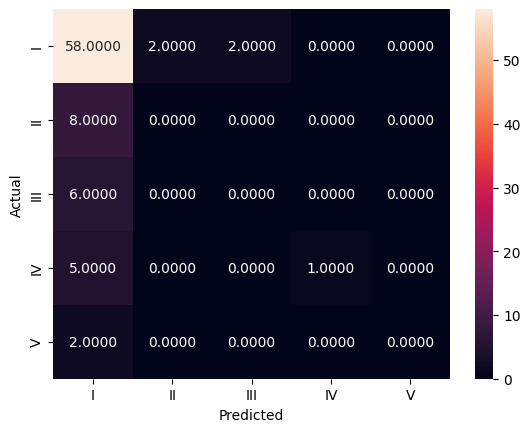



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision  \
0  Glove-Basic-Accident       KNN        0.997006       0.726190   0.589286   
1  Glove-Basic-Accident     Ridge        0.826347       0.702381   0.613321   

     Recall        F1  
0  0.726190  0.641600  
1  0.702381  0.627635  
Model :  LogisticRegression



Classification - Heatmap




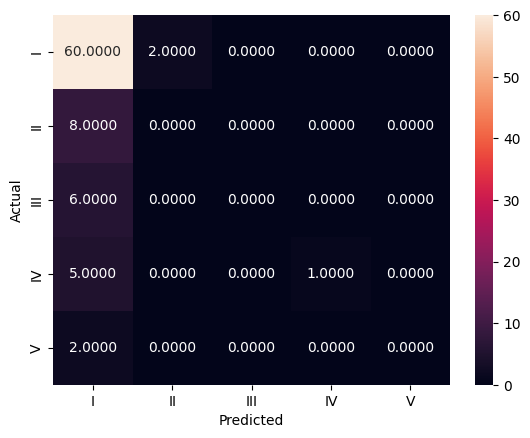



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Glove-Basic-Accident                 KNN        0.997006       0.726190   
1  Glove-Basic-Accident               Ridge        0.826347       0.702381   
2  Glove-Basic-Accident  LogisticRegression        0.790419       0.726190   

   Precision    Recall        F1  
0   0.589286  0.726190  0.641600  
1   0.613321  0.702381  0.627635  
2   0.618166  0.726190  0.639789  
Model :  GradientBoost



Classification - Heatmap




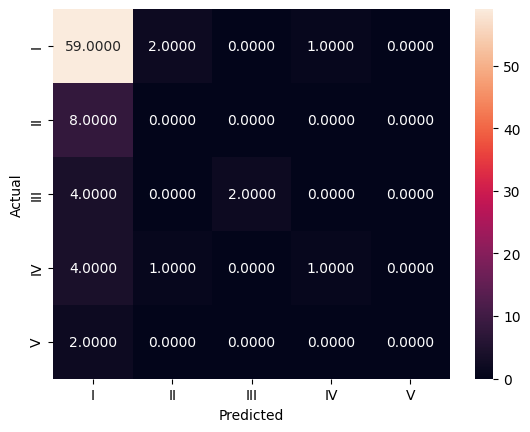



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Glove-Basic-Accident                 KNN        0.997006       0.726190   
1  Glove-Basic-Accident               Ridge        0.826347       0.702381   
2  Glove-Basic-Accident  LogisticRegression        0.790419       0.726190   
3  Glove-Basic-Accident       GradientBoost        0.997006       0.738095   

   Precision    Recall        F1  
0   0.589286  0.726190  0.641600  
1   0.613321  0.702381  0.627635  
2   0.618166  0.726190  0.639789  
3   0.672696  0.738095  0.680156  
Model :  SVM



Classification - Heatmap




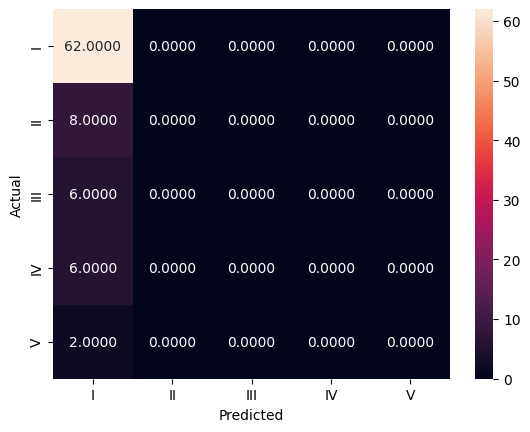



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Glove-Basic-Accident                 KNN        0.997006       0.726190   
1  Glove-Basic-Accident               Ridge        0.826347       0.702381   
2  Glove-Basic-Accident  LogisticRegression        0.790419       0.726190   
3  Glove-Basic-Accident       GradientBoost        0.997006       0.738095   
4  Glove-Basic-Accident                 SVM        0.739521       0.738095   

   Precision    Recall        F1  
0   0.589286  0.726190  0.641600  
1   0.613321  0.702381  0.627635  
2   0.618166  0.726190  0.639789  
3   0.672696  0.738095  0.680156  
4   0.544785  0.738095  0.626875  
Model :  Bagging



Classification - Heatmap




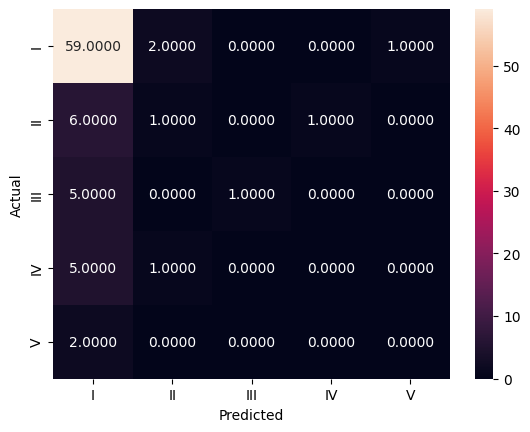



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Glove-Basic-Accident                 KNN        0.997006       0.726190   
1  Glove-Basic-Accident               Ridge        0.826347       0.702381   
2  Glove-Basic-Accident  LogisticRegression        0.790419       0.726190   
3  Glove-Basic-Accident       GradientBoost        0.997006       0.738095   
4  Glove-Basic-Accident                 SVM        0.739521       0.738095   
5  Glove-Basic-Accident             Bagging        0.949102       0.726190   

   Precision    Recall        F1  
0   0.589286  0.726190  0.641600  
1   0.613321  0.702381  0.627635  
2   0.618166  0.726190  0.639789  
3   0.672696  0.738095  0.680156  
4   0.544785  0.738095  0.626875  
5   0.660792  0.726190  0.662866  
Model :  RandomForest



Classification - Heatmap




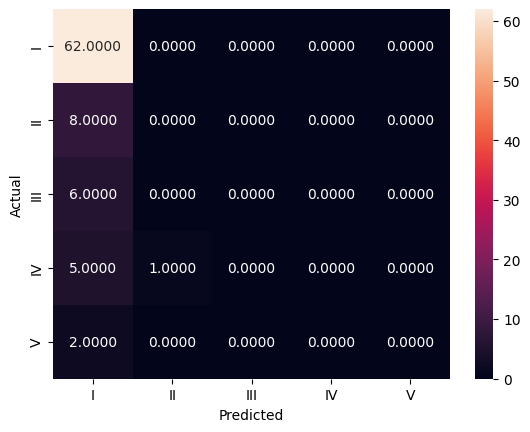



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Glove-Basic-Accident                 KNN        0.997006       0.726190   
1  Glove-Basic-Accident               Ridge        0.826347       0.702381   
2  Glove-Basic-Accident  LogisticRegression        0.790419       0.726190   
3  Glove-Basic-Accident       GradientBoost        0.997006       0.738095   
4  Glove-Basic-Accident                 SVM        0.739521       0.738095   
5  Glove-Basic-Accident             Bagging        0.949102       0.726190   
6  Glove-Basic-Accident        RandomForest        0.997006       0.738095   

   Precision    Recall        F1  
0   0.589286  0.726190  0.641600  
1   0.613321  0.702381  0.627635  
2   0.618166  0.726190  0.639789  
3   0.672696  0.738095  0.680156  
4   0.544785  0.738095  0.626875  
5   0.660792  0.726190  0.662866  
6   0.551348  0.738095  

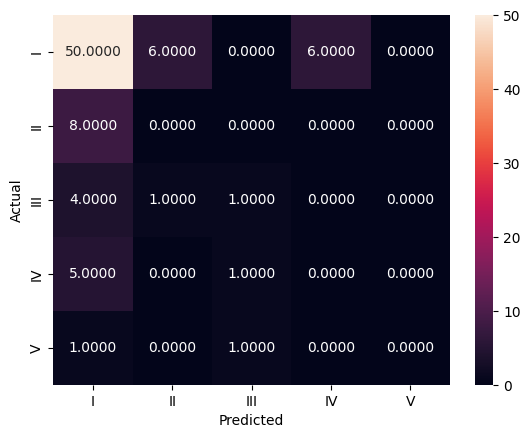



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Glove-Basic-Accident                 KNN        0.997006       0.726190   
1  Glove-Basic-Accident               Ridge        0.826347       0.702381   
2  Glove-Basic-Accident  LogisticRegression        0.790419       0.726190   
3  Glove-Basic-Accident       GradientBoost        0.997006       0.738095   
4  Glove-Basic-Accident                 SVM        0.739521       0.738095   
5  Glove-Basic-Accident             Bagging        0.949102       0.726190   
6  Glove-Basic-Accident        RandomForest        0.997006       0.738095   
7  Glove-Basic-Accident        DecisionTree        0.856287       0.607143   

   Precision    Recall        F1  
0   0.589286  0.726190  0.641600  
1   0.613321  0.702381  0.627635  
2   0.618166  0.726190  0.639789  
3   0.672696  0.738095  0.680156  
4   0.544785  0.

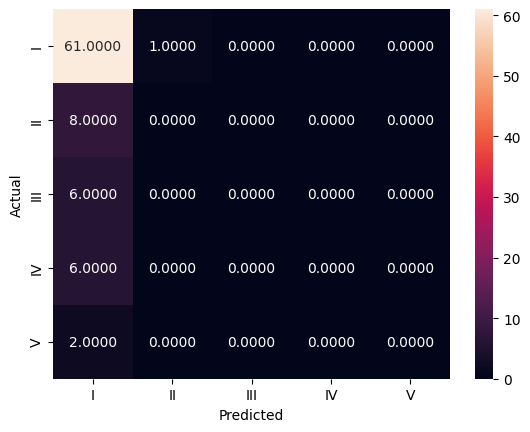



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Glove-Basic-Accident                 KNN        0.997006       0.726190   
1  Glove-Basic-Accident               Ridge        0.826347       0.702381   
2  Glove-Basic-Accident  LogisticRegression        0.790419       0.726190   
3  Glove-Basic-Accident       GradientBoost        0.997006       0.738095   
4  Glove-Basic-Accident                 SVM        0.739521       0.738095   
5  Glove-Basic-Accident             Bagging        0.949102       0.726190   
6  Glove-Basic-Accident        RandomForest        0.997006       0.738095   
7  Glove-Basic-Accident        DecisionTree        0.856287       0.607143   
8  Glove-Basic-Accident            AdaBoost        0.736527       0.726190   

   Precision    Recall        F1  
0   0.589286  0.726190  0.641600  
1   0.613321  0.702381  0.627635  
2   0.61

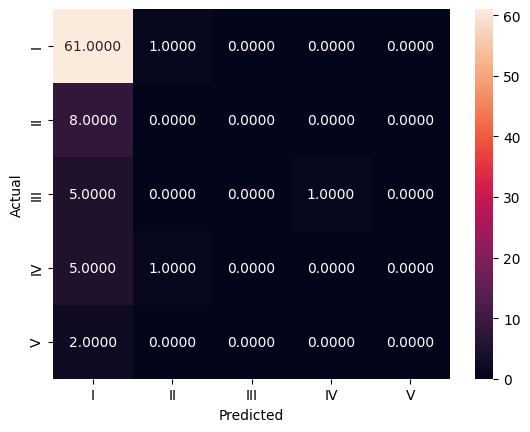



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  Glove-Basic-Accident                 KNN        0.997006       0.726190   
1  Glove-Basic-Accident               Ridge        0.826347       0.702381   
2  Glove-Basic-Accident  LogisticRegression        0.790419       0.726190   
3  Glove-Basic-Accident       GradientBoost        0.997006       0.738095   
4  Glove-Basic-Accident                 SVM        0.739521       0.738095   
5  Glove-Basic-Accident             Bagging        0.949102       0.726190   
6  Glove-Basic-Accident        RandomForest        0.997006       0.738095   
7  Glove-Basic-Accident        DecisionTree        0.856287       0.607143   
8  Glove-Basic-Accident            AdaBoost        0.736527       0.726190   
9  Glove-Basic-Accident             XGBoost        0.997006       0.726190   

   Precision    Recall        F1  


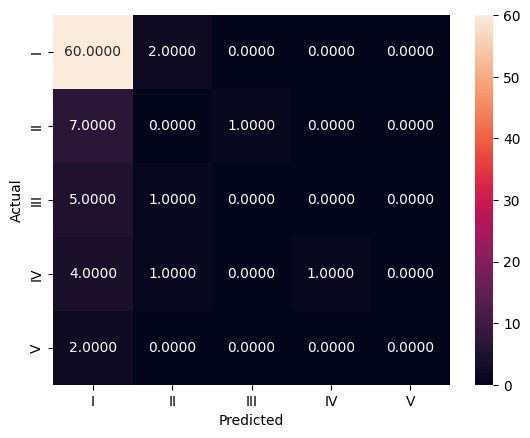



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
     Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0   Glove-Basic-Accident                 KNN        0.997006       0.726190   
1   Glove-Basic-Accident               Ridge        0.826347       0.702381   
2   Glove-Basic-Accident  LogisticRegression        0.790419       0.726190   
3   Glove-Basic-Accident       GradientBoost        0.997006       0.738095   
4   Glove-Basic-Accident                 SVM        0.739521       0.738095   
5   Glove-Basic-Accident             Bagging        0.949102       0.726190   
6   Glove-Basic-Accident        RandomForest        0.997006       0.738095   
7   Glove-Basic-Accident        DecisionTree        0.856287       0.607143   
8   Glove-Basic-Accident            AdaBoost        0.736527       0.726190   
9   Glove-Basic-Accident             XGBoost        0.997006       0.726190   
10  Glove-Basic-Accident 

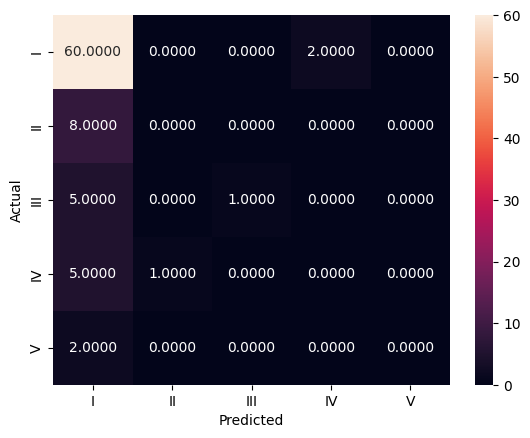



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision  \
0  TfIdf-Basic-Accident       KNN        0.997006        0.72619      0.625   

    Recall        F1  
0  0.72619  0.644151  
Model :  Ridge



Classification - Heatmap




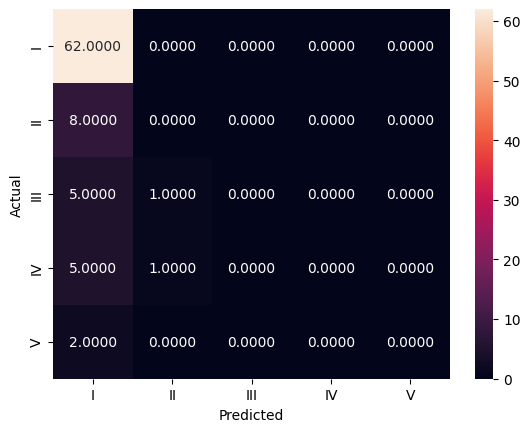



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision  \
0  TfIdf-Basic-Accident       KNN        0.997006       0.726190   0.625000   
1  TfIdf-Basic-Accident     Ridge        0.979042       0.738095   0.558072   

     Recall        F1  
0  0.726190  0.644151  
1  0.738095  0.635582  
Model :  LogisticRegression



Classification - Heatmap




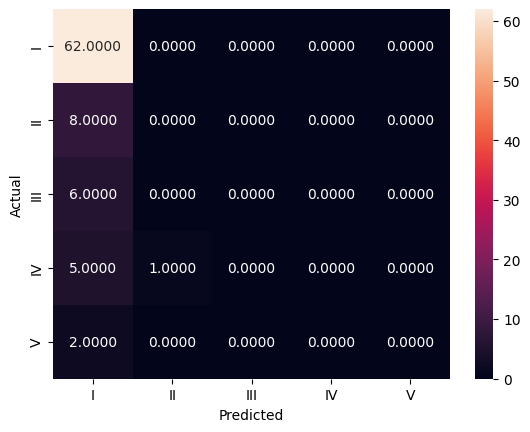



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  TfIdf-Basic-Accident                 KNN        0.997006       0.726190   
1  TfIdf-Basic-Accident               Ridge        0.979042       0.738095   
2  TfIdf-Basic-Accident  LogisticRegression        0.793413       0.738095   

   Precision    Recall        F1  
0   0.625000  0.726190  0.644151  
1   0.558072  0.738095  0.635582  
2   0.551348  0.738095  0.631199  
Model :  GradientBoost



Classification - Heatmap




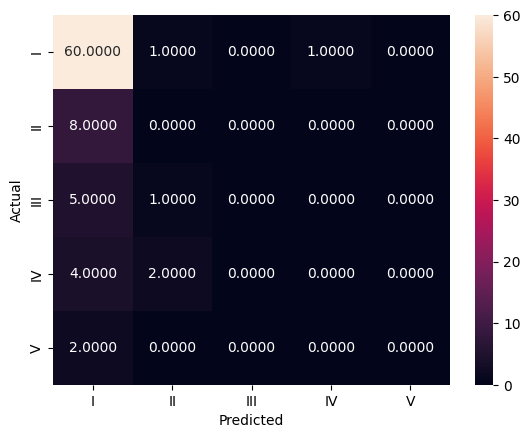



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  TfIdf-Basic-Accident                 KNN        0.997006       0.726190   
1  TfIdf-Basic-Accident               Ridge        0.979042       0.738095   
2  TfIdf-Basic-Accident  LogisticRegression        0.793413       0.738095   
3  TfIdf-Basic-Accident       GradientBoost        0.997006       0.714286   

   Precision    Recall        F1  
0   0.625000  0.726190  0.644151  
1   0.558072  0.738095  0.635582  
2   0.551348  0.738095  0.631199  
3   0.560579  0.714286  0.628166  
Model :  SVM



Classification - Heatmap




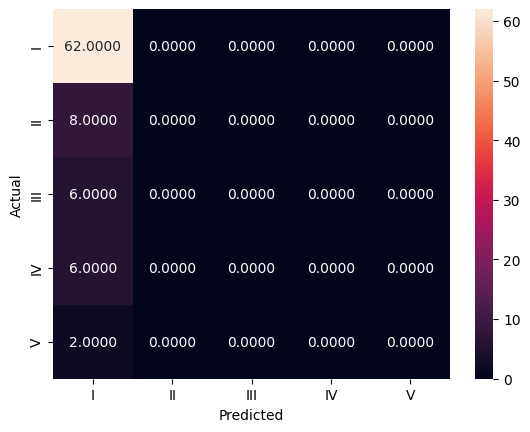



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  TfIdf-Basic-Accident                 KNN        0.997006       0.726190   
1  TfIdf-Basic-Accident               Ridge        0.979042       0.738095   
2  TfIdf-Basic-Accident  LogisticRegression        0.793413       0.738095   
3  TfIdf-Basic-Accident       GradientBoost        0.997006       0.714286   
4  TfIdf-Basic-Accident                 SVM        0.739521       0.738095   

   Precision    Recall        F1  
0   0.625000  0.726190  0.644151  
1   0.558072  0.738095  0.635582  
2   0.551348  0.738095  0.631199  
3   0.560579  0.714286  0.628166  
4   0.544785  0.738095  0.626875  
Model :  Bagging



Classification - Heatmap




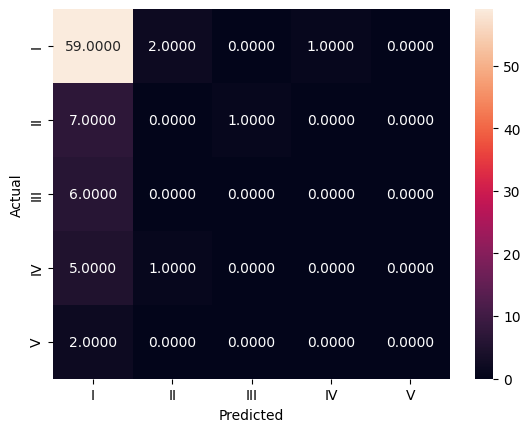



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  TfIdf-Basic-Accident                 KNN        0.997006       0.726190   
1  TfIdf-Basic-Accident               Ridge        0.979042       0.738095   
2  TfIdf-Basic-Accident  LogisticRegression        0.793413       0.738095   
3  TfIdf-Basic-Accident       GradientBoost        0.997006       0.714286   
4  TfIdf-Basic-Accident                 SVM        0.739521       0.738095   
5  TfIdf-Basic-Accident             Bagging        0.949102       0.702381   

   Precision    Recall        F1  
0   0.625000  0.726190  0.644151  
1   0.558072  0.738095  0.635582  
2   0.551348  0.738095  0.631199  
3   0.560579  0.714286  0.628166  
4   0.544785  0.738095  0.626875  
5   0.551236  0.702381  0.617697  
Model :  RandomForest



Classification - Heatmap




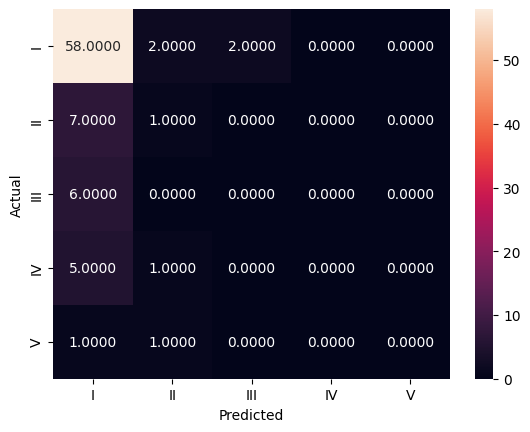



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  TfIdf-Basic-Accident                 KNN        0.997006       0.726190   
1  TfIdf-Basic-Accident               Ridge        0.979042       0.738095   
2  TfIdf-Basic-Accident  LogisticRegression        0.793413       0.738095   
3  TfIdf-Basic-Accident       GradientBoost        0.997006       0.714286   
4  TfIdf-Basic-Accident                 SVM        0.739521       0.738095   
5  TfIdf-Basic-Accident             Bagging        0.949102       0.702381   
6  TfIdf-Basic-Accident        RandomForest        0.967066       0.702381   

   Precision    Recall        F1  
0   0.625000  0.726190  0.644151  
1   0.558072  0.738095  0.635582  
2   0.551348  0.738095  0.631199  
3   0.560579  0.714286  0.628166  
4   0.544785  0.738095  0.626875  
5   0.551236  0.702381  0.617697  
6   0.575015  0.702381  

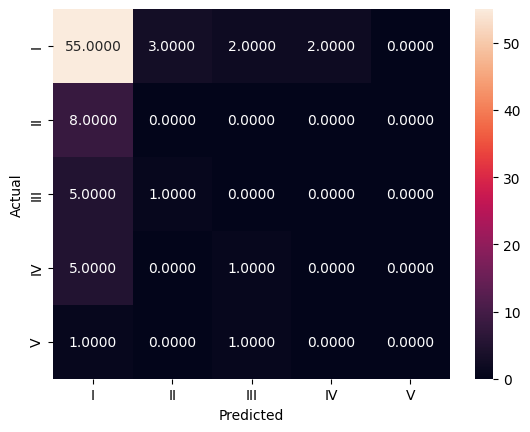



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  TfIdf-Basic-Accident                 KNN        0.997006       0.726190   
1  TfIdf-Basic-Accident               Ridge        0.979042       0.738095   
2  TfIdf-Basic-Accident  LogisticRegression        0.793413       0.738095   
3  TfIdf-Basic-Accident       GradientBoost        0.997006       0.714286   
4  TfIdf-Basic-Accident                 SVM        0.739521       0.738095   
5  TfIdf-Basic-Accident             Bagging        0.949102       0.702381   
6  TfIdf-Basic-Accident        RandomForest        0.967066       0.702381   
7  TfIdf-Basic-Accident        DecisionTree        0.778443       0.654762   

   Precision    Recall        F1  
0   0.625000  0.726190  0.644151  
1   0.558072  0.738095  0.635582  
2   0.551348  0.738095  0.631199  
3   0.560579  0.714286  0.628166  
4   0.544785  0.

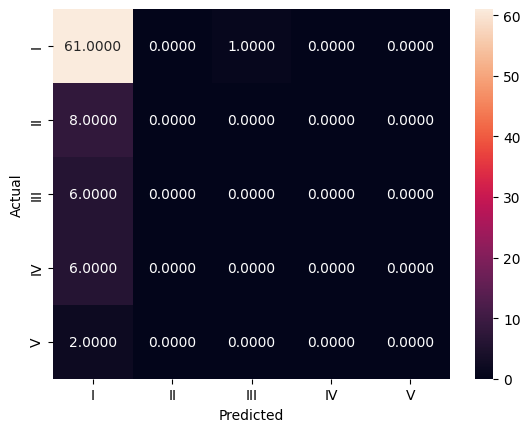



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  TfIdf-Basic-Accident                 KNN        0.997006       0.726190   
1  TfIdf-Basic-Accident               Ridge        0.979042       0.738095   
2  TfIdf-Basic-Accident  LogisticRegression        0.793413       0.738095   
3  TfIdf-Basic-Accident       GradientBoost        0.997006       0.714286   
4  TfIdf-Basic-Accident                 SVM        0.739521       0.738095   
5  TfIdf-Basic-Accident             Bagging        0.949102       0.702381   
6  TfIdf-Basic-Accident        RandomForest        0.967066       0.702381   
7  TfIdf-Basic-Accident        DecisionTree        0.778443       0.654762   
8  TfIdf-Basic-Accident            AdaBoost        0.760479       0.726190   

   Precision    Recall        F1  
0   0.625000  0.726190  0.644151  
1   0.558072  0.738095  0.635582  
2   0.55

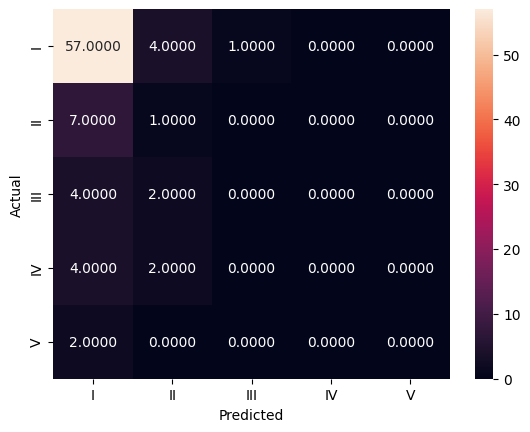



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
    Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0  TfIdf-Basic-Accident                 KNN        0.997006       0.726190   
1  TfIdf-Basic-Accident               Ridge        0.979042       0.738095   
2  TfIdf-Basic-Accident  LogisticRegression        0.793413       0.738095   
3  TfIdf-Basic-Accident       GradientBoost        0.997006       0.714286   
4  TfIdf-Basic-Accident                 SVM        0.739521       0.738095   
5  TfIdf-Basic-Accident             Bagging        0.949102       0.702381   
6  TfIdf-Basic-Accident        RandomForest        0.967066       0.702381   
7  TfIdf-Basic-Accident        DecisionTree        0.778443       0.654762   
8  TfIdf-Basic-Accident            AdaBoost        0.760479       0.726190   
9  TfIdf-Basic-Accident             XGBoost        0.997006       0.690476   

   Precision    Recall        F1  


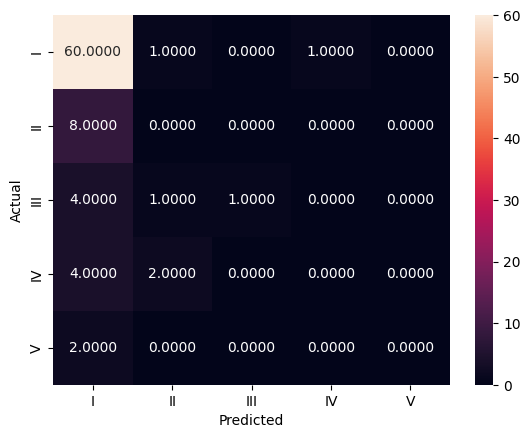



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
     Description Of Data           ModelName  Train Accuracy  Test Accuracy  \
0   TfIdf-Basic-Accident                 KNN        0.997006       0.726190   
1   TfIdf-Basic-Accident               Ridge        0.979042       0.738095   
2   TfIdf-Basic-Accident  LogisticRegression        0.793413       0.738095   
3   TfIdf-Basic-Accident       GradientBoost        0.997006       0.714286   
4   TfIdf-Basic-Accident                 SVM        0.739521       0.738095   
5   TfIdf-Basic-Accident             Bagging        0.949102       0.702381   
6   TfIdf-Basic-Accident        RandomForest        0.967066       0.702381   
7   TfIdf-Basic-Accident        DecisionTree        0.778443       0.654762   
8   TfIdf-Basic-Accident            AdaBoost        0.760479       0.726190   
9   TfIdf-Basic-Accident             XGBoost        0.997006       0.690476   
10  TfIdf-Basic-Accident 

In [ ]:
#Basic Train and Test on each of medium of data - word2vec / glove / tfidf

combinedResultDF = pd.concat([combinedResultDF, runAllModelDefault(X_train=X_train_w2v,Y_train=y_train_w2v,X_test=X_test_w2v,Y_test=y_test_w2v,descriptionOfData="Word2Vec-Basic-Accident")], ignore_index=True,sort=False)
combinedResultDF = pd.concat([combinedResultDF, runAllModelDefault(X_train=X_train_glove,Y_train=y_train_glove,X_test=X_test_glove,Y_test=y_test_glove,descriptionOfData="Glove-Basic-Accident")], ignore_index=True,sort=False)
combinedResultDF = pd.concat([combinedResultDF, runAllModelDefault(X_train=X_train_tfidf,Y_train=y_train_tfidf,X_test=X_test_tfidf,Y_test=y_test_tfidf,descriptionOfData="TfIdf-Basic-Accident")], ignore_index=True,sort=False)

In [ ]:
pd.set_option('display.width',1000)
print(combinedResultDF)

        Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0   Word2Vec-Basic-Accident                 KNN        0.997006       0.690476   0.555968  0.690476  0.615964
1   Word2Vec-Basic-Accident               Ridge        0.763473       0.738095   0.544785  0.738095  0.626875
2   Word2Vec-Basic-Accident  LogisticRegression        0.742515       0.726190   0.542456  0.726190  0.621018
3   Word2Vec-Basic-Accident       GradientBoost        0.997006       0.726190   0.549071  0.726190  0.625331
4   Word2Vec-Basic-Accident                 SVM        0.739521       0.738095   0.544785  0.738095  0.626875
5   Word2Vec-Basic-Accident             Bagging        0.967066       0.726190   0.549071  0.726190  0.625331
6   Word2Vec-Basic-Accident        RandomForest        0.997006       0.738095   0.551348  0.738095  0.631199
7   Word2Vec-Basic-Accident        DecisionTree        0.799401       0.642857   0.559631  0.642857  0.598281
8   Word2V

In [ ]:
combinedResultDF = pd.concat([combinedResultDF,runAllModelDefault(X_train=X_train_w2v_up,Y_train=y_train_w2v_up,X_test=X_test_w2v_pca,Y_test=y_test_w2v,descriptionOfData="Word2Vec-PCA&Upsampled-Accident")],ignore_index=True,sort=False)
combinedResultDF = pd.concat([combinedResultDF,runAllModelDefault(X_train=X_train_w2v_smote,Y_train=y_train_w2v_smote,X_test=X_test_w2v_pca,Y_test=y_test_w2v,descriptionOfData="Word2Vec-PCA&SMOTE-Accident")],ignore_index=True,sort=False)
combinedResultDF = pd.concat([combinedResultDF,runAllModelDefault(X_train=X_train_glove_up,Y_train=y_train_glove_up,X_test=X_test_glove_pca,Y_test=y_test_glove,descriptionOfData="Glove-PCA&Upsampled-Accident")],ignore_index=True,sort=False)
combinedResultDF = pd.concat([combinedResultDF,runAllModelDefault(X_train=X_train_glove_smote,Y_train=y_train_glove_smote,X_test=X_test_glove_pca,Y_test=y_test_glove,descriptionOfData="Glove-PCA&SMOTE-Accident")],ignore_index=True,sort=False)
combinedResultDF = pd.concat([combinedResultDF,runAllModelDefault(X_train=X_train_tfidf_up,Y_train=y_train_tfidf_up,X_test=X_test_tfidf_pca,Y_test=y_test_tfidf,descriptionOfData="TFIDF-PCA&Upsampled-Accident")],ignore_index=True,sort=False)
combinedResultDF = pd.concat([combinedResultDF,runAllModelDefault(X_train=X_train_tfidf_smote,Y_train=y_train_tfidf_smote,X_test=X_test_tfidf_pca,Y_test=y_test_tfidf,descriptionOfData="TFIDF-PCA&SMOTE-Accident")],ignore_index=True,sort=False)

In [ ]:
combinedResultDF.to_csv('Model Performance Report.csv')

In [ ]:
#combinedResultDF = pd.read_csv('drive/My Drive/AI ML - UT Austin/Project/Model Performance Report.csv')
combinedResultDF = pd.read_csv('Model Performance Report.csv')
combinedResultDF.drop(["Unnamed: 0"], axis=1, inplace=True)
combinedResultDF

,Description Of Data,ModelName,Train Accuracy,Test Accuracy,Precision,Recall,F1
0,Word2Vec-Basic-Accident,KNN,0.997006,0.690476,0.555968,0.690476,0.615964
1,Word2Vec-Basic-Accident,Ridge,0.763473,0.738095,0.544785,0.738095,0.626875
2,Word2Vec-Basic-Accident,LogisticRegression,0.742515,0.726190,0.542456,0.726190,0.621018
3,Word2Vec-Basic-Accident,GradientBoost,0.997006,0.726190,0.549071,0.726190,0.625331
4,Word2Vec-Basic-Accident,SVM,0.739521,0.738095,0.544785,0.738095,0.626875
5,Word2Vec-Basic-Accident,Bagging,0.967066,0.726190,0.549071,0.726190,0.625331
6,Word2Vec-Basic-Accident,RandomForest,0.997006,0.738095,0.551348,0.738095,0.631199
7,Word2Vec-Basic-Accident,DecisionTree,0.799401,0.642857,0.559631,0.642857,0.598281
8,Word2Vec-Basic-Accident,AdaBoost,0.733533,0.726190,0.549071,0.726190,0.625331
9,Word2Vec-Basic-Accident,XGBoost,0.997006,0.714286,0.546737,0.714286,0.619381


After analyzing all the model performances on three different datasets(Word2Vwc, GloVe and TFIDF) and applying PCA for dimension reduction and upsampling & SMOTE for balancing, we identfied SVM and Ridge Classifier are perfoming well. Hence we decided to do hyper paramater tuning on those two models.

###### Potentail Accident level as Target

In [ ]:
combinedResult_Pot = pd.DataFrame(columns=['Description Of Data','ModelName','Train Accuracy','Test Accuracy','Precision','Recall','F1'])

In [ ]:
#train test split based on potential accident level as target
X_train_w2v_p,X_test_w2v_p,y_train_w2v_p,y_test_w2v_p=split(X_w2v,y_w2v_pot)
X_train_glove_p,X_test_glove_p,y_train_glove_p,y_test_glove_p=split(X_glove,y_glove_pot)
X_train_tfidf_p,X_test_tfidf_p,y_train_tfidf_p,y_test_tfidf_p=split(X_tfidf,y_tfidf_pot)

Model :  KNN



Classification - Heatmap




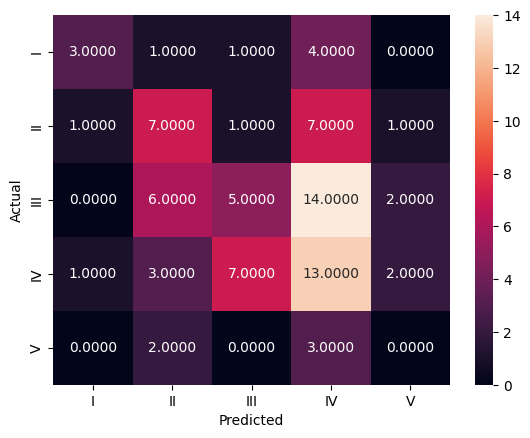



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident       KNN             1.0       0.333333   0.351785  0.333333  0.323133
Model :  Ridge



Classification - Heatmap




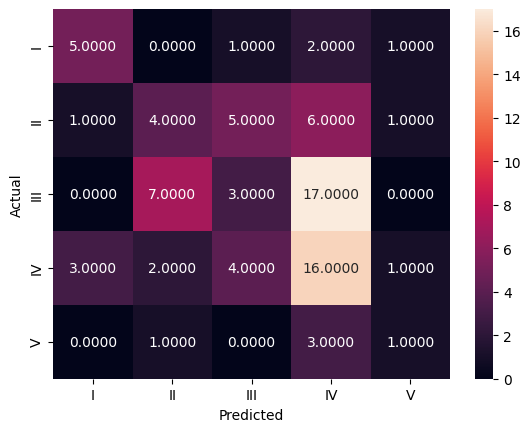



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident       KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1  Potential Acc: Word2Vec-Basic-Accident     Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
Model :  LogisticRegression



Classification - Heatmap




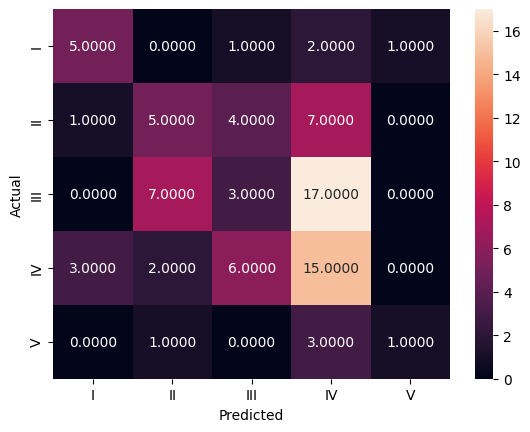



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident                 KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1  Potential Acc: Word2Vec-Basic-Accident               Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
2  Potential Acc: Word2Vec-Basic-Accident  LogisticRegression        0.574850       0.345238   0.331143  0.345238  0.319466
Model :  GradientBoost



Classification - Heatmap




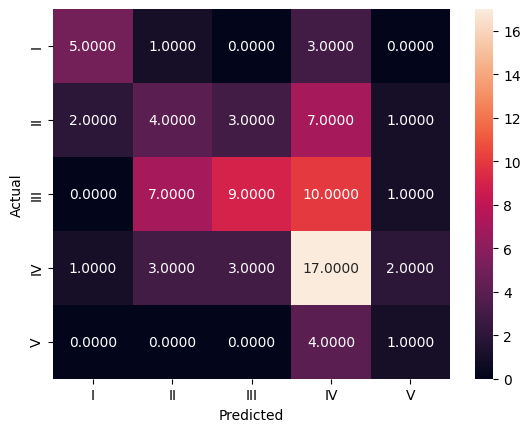



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident                 KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1  Potential Acc: Word2Vec-Basic-Accident               Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
2  Potential Acc: Word2Vec-Basic-Accident  LogisticRegression        0.574850       0.345238   0.331143  0.345238  0.319466
3  Potential Acc: Word2Vec-Basic-Accident       GradientBoost        1.000000       0.428571   0.454034  0.428571  0.420352
Model :  SVM



Classification - Heatmap




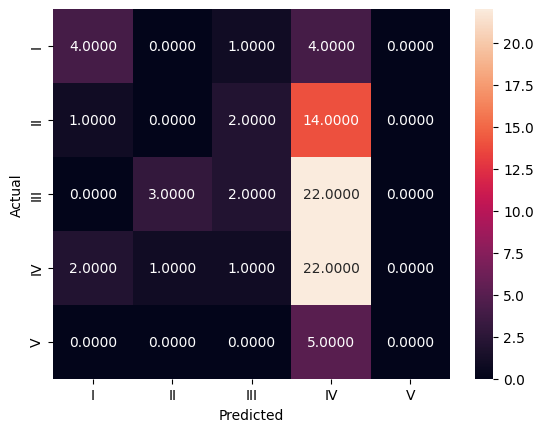



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident                 KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1  Potential Acc: Word2Vec-Basic-Accident               Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
2  Potential Acc: Word2Vec-Basic-Accident  LogisticRegression        0.574850       0.345238   0.331143  0.345238  0.319466
3  Potential Acc: Word2Vec-Basic-Accident       GradientBoost        1.000000       0.428571   0.454034  0.428571  0.420352
4  Potential Acc: Word2Vec-Basic-Accident                 SVM        0.479042       0.333333   0.270002  0.333333  0.238974
Model :  Bagging



Classification - Heatmap




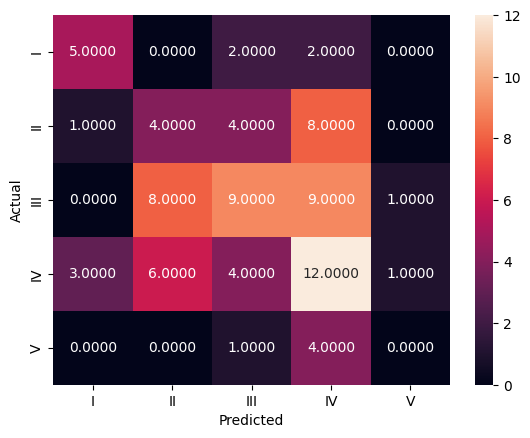



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident                 KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1  Potential Acc: Word2Vec-Basic-Accident               Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
2  Potential Acc: Word2Vec-Basic-Accident  LogisticRegression        0.574850       0.345238   0.331143  0.345238  0.319466
3  Potential Acc: Word2Vec-Basic-Accident       GradientBoost        1.000000       0.428571   0.454034  0.428571  0.420352
4  Potential Acc: Word2Vec-Basic-Accident                 SVM        0.479042       0.333333   0.270002  0.333333  0.238974
5  Potential Acc: Word2Vec-Basic-Accident             Bagging        0.985030       0.357143   0.355263  0.357143  0.350662
Model :  RandomForest



C

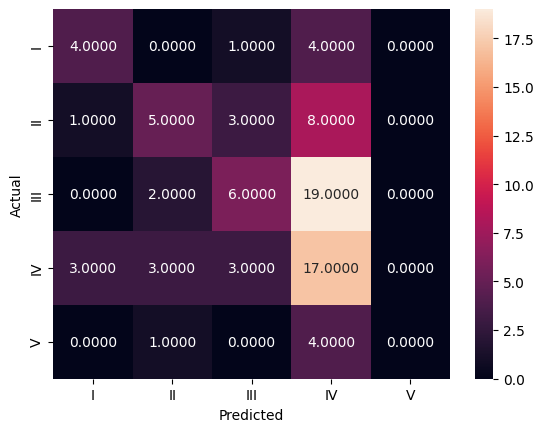



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident                 KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1  Potential Acc: Word2Vec-Basic-Accident               Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
2  Potential Acc: Word2Vec-Basic-Accident  LogisticRegression        0.574850       0.345238   0.331143  0.345238  0.319466
3  Potential Acc: Word2Vec-Basic-Accident       GradientBoost        1.000000       0.428571   0.454034  0.428571  0.420352
4  Potential Acc: Word2Vec-Basic-Accident                 SVM        0.479042       0.333333   0.270002  0.333333  0.238974
5  Potential Acc: Word2Vec-Basic-Accident             Bagging        0.985030       0.357143   0.355263  0.357143  0.350662
6  Potential Acc: Word2Vec

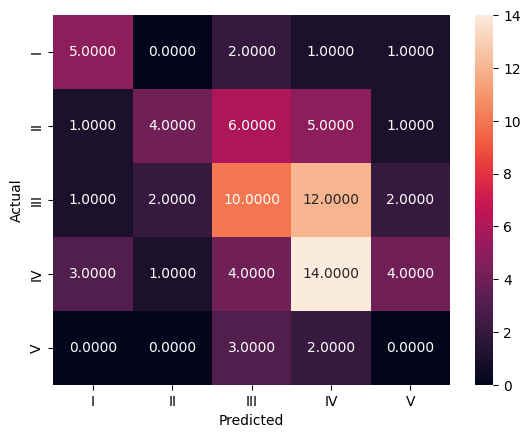



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident                 KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1  Potential Acc: Word2Vec-Basic-Accident               Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
2  Potential Acc: Word2Vec-Basic-Accident  LogisticRegression        0.574850       0.345238   0.331143  0.345238  0.319466
3  Potential Acc: Word2Vec-Basic-Accident       GradientBoost        1.000000       0.428571   0.454034  0.428571  0.420352
4  Potential Acc: Word2Vec-Basic-Accident                 SVM        0.479042       0.333333   0.270002  0.333333  0.238974
5  Potential Acc: Word2Vec-Basic-Accident             Bagging        0.985030       0.357143   0.355263  0.357143  0.350662
6  Potential Acc: Word2Vec

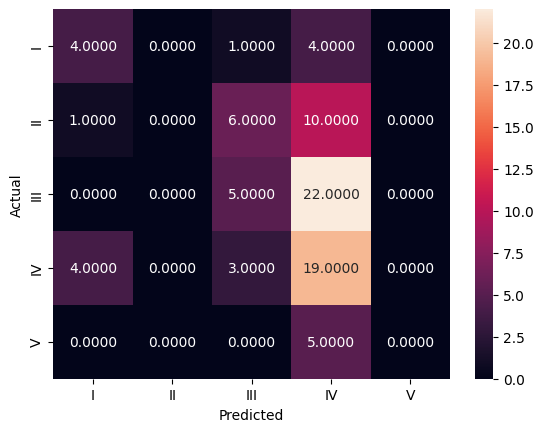



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident                 KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1  Potential Acc: Word2Vec-Basic-Accident               Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
2  Potential Acc: Word2Vec-Basic-Accident  LogisticRegression        0.574850       0.345238   0.331143  0.345238  0.319466
3  Potential Acc: Word2Vec-Basic-Accident       GradientBoost        1.000000       0.428571   0.454034  0.428571  0.420352
4  Potential Acc: Word2Vec-Basic-Accident                 SVM        0.479042       0.333333   0.270002  0.333333  0.238974
5  Potential Acc: Word2Vec-Basic-Accident             Bagging        0.985030       0.357143   0.355263  0.357143  0.350662
6  Potential Acc: Word2Vec

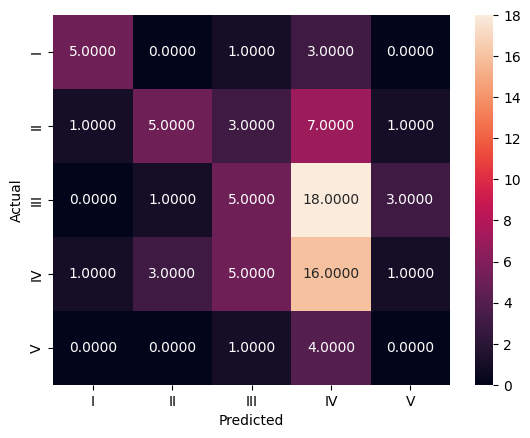



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                      Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Word2Vec-Basic-Accident                 KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1  Potential Acc: Word2Vec-Basic-Accident               Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
2  Potential Acc: Word2Vec-Basic-Accident  LogisticRegression        0.574850       0.345238   0.331143  0.345238  0.319466
3  Potential Acc: Word2Vec-Basic-Accident       GradientBoost        1.000000       0.428571   0.454034  0.428571  0.420352
4  Potential Acc: Word2Vec-Basic-Accident                 SVM        0.479042       0.333333   0.270002  0.333333  0.238974
5  Potential Acc: Word2Vec-Basic-Accident             Bagging        0.985030       0.357143   0.355263  0.357143  0.350662
6  Potential Acc: Word2Vec

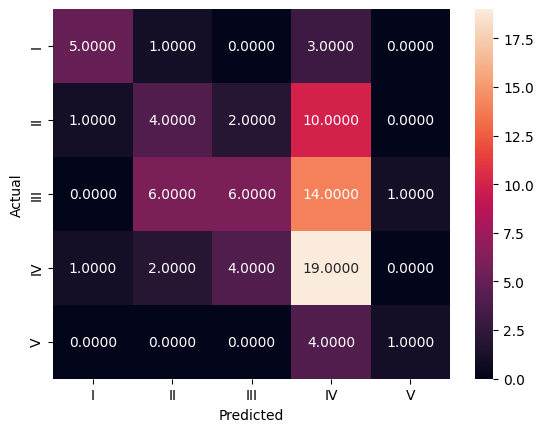



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                       Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0   Potential Acc: Word2Vec-Basic-Accident                 KNN        1.000000       0.333333   0.351785  0.333333  0.323133
1   Potential Acc: Word2Vec-Basic-Accident               Ridge        0.580838       0.345238   0.318958  0.345238  0.314690
2   Potential Acc: Word2Vec-Basic-Accident  LogisticRegression        0.574850       0.345238   0.331143  0.345238  0.319466
3   Potential Acc: Word2Vec-Basic-Accident       GradientBoost        1.000000       0.428571   0.454034  0.428571  0.420352
4   Potential Acc: Word2Vec-Basic-Accident                 SVM        0.479042       0.333333   0.270002  0.333333  0.238974
5   Potential Acc: Word2Vec-Basic-Accident             Bagging        0.985030       0.357143   0.355263  0.357143  0.350662
6   Potential Acc: 

In [ ]:
combinedResult_Pot = pd.concat([combinedResult_Pot, runAllModelDefault(X_train=X_train_w2v_p,Y_train=y_train_w2v_p,X_test=X_test_w2v_p,Y_test=y_test_w2v_p,descriptionOfData="Potential Acc: Word2Vec-Basic-Accident")],ignore_index=True,sort=False)

Model :  KNN



Classification - Heatmap




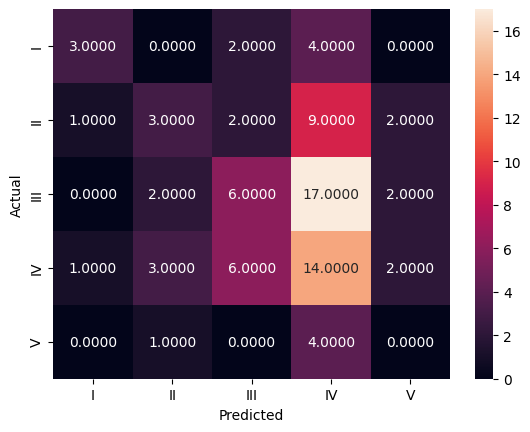



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision    Recall       F1
0  Potential Acc: Glove-Basic-Accident       KNN             1.0       0.309524    0.34256  0.309524  0.29944
Model :  Ridge



Classification - Heatmap




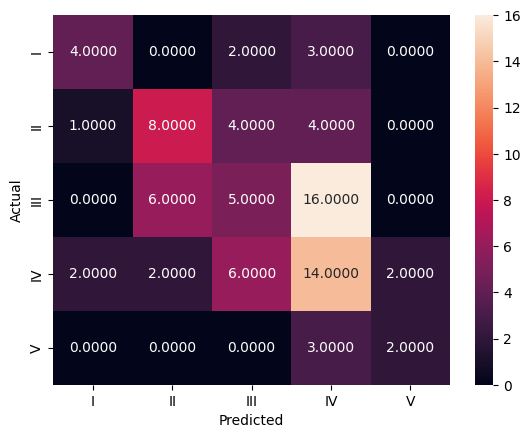



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Glove-Basic-Accident       KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1  Potential Acc: Glove-Basic-Accident     Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
Model :  LogisticRegression



Classification - Heatmap




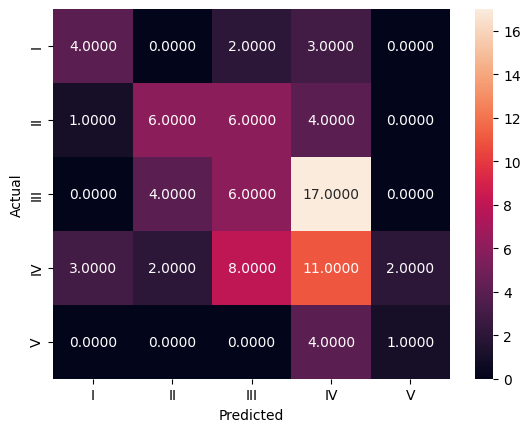



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Glove-Basic-Accident                 KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1  Potential Acc: Glove-Basic-Accident               Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
2  Potential Acc: Glove-Basic-Accident  LogisticRegression        0.685629       0.333333   0.349567  0.333333  0.332524
Model :  GradientBoost



Classification - Heatmap




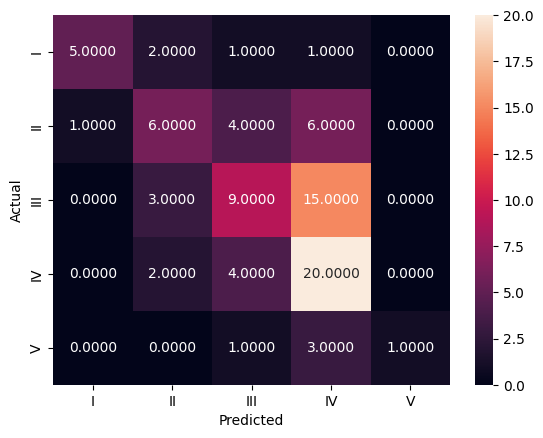



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Glove-Basic-Accident                 KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1  Potential Acc: Glove-Basic-Accident               Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
2  Potential Acc: Glove-Basic-Accident  LogisticRegression        0.685629       0.333333   0.349567  0.333333  0.332524
3  Potential Acc: Glove-Basic-Accident       GradientBoost        1.000000       0.488095   0.532038  0.488095  0.472378
Model :  SVM



Classification - Heatmap




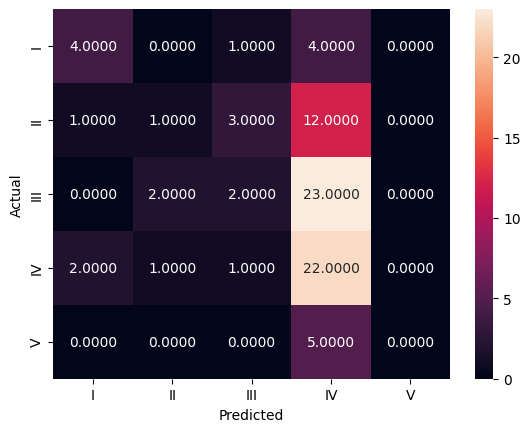



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Glove-Basic-Accident                 KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1  Potential Acc: Glove-Basic-Accident               Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
2  Potential Acc: Glove-Basic-Accident  LogisticRegression        0.685629       0.333333   0.349567  0.333333  0.332524
3  Potential Acc: Glove-Basic-Accident       GradientBoost        1.000000       0.488095   0.532038  0.488095  0.472378
4  Potential Acc: Glove-Basic-Accident                 SVM        0.491018       0.345238   0.306831  0.345238  0.258694
Model :  Bagging



Classification - Heatmap




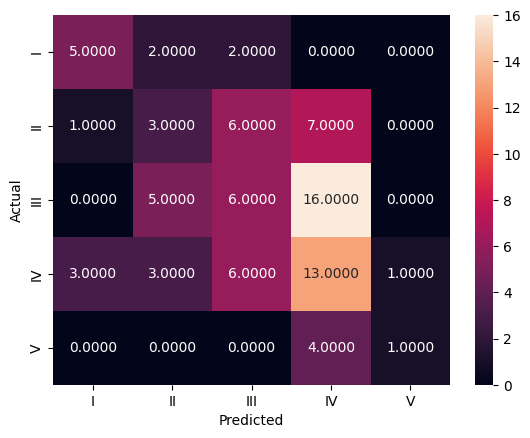



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Glove-Basic-Accident                 KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1  Potential Acc: Glove-Basic-Accident               Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
2  Potential Acc: Glove-Basic-Accident  LogisticRegression        0.685629       0.333333   0.349567  0.333333  0.332524
3  Potential Acc: Glove-Basic-Accident       GradientBoost        1.000000       0.488095   0.532038  0.488095  0.472378
4  Potential Acc: Glove-Basic-Accident                 SVM        0.491018       0.345238   0.306831  0.345238  0.258694
5  Potential Acc: Glove-Basic-Accident             Bagging        0.982036       0.333333   0.333013  0.333333  0.321007
Model :  RandomForest



Classification - Heatm

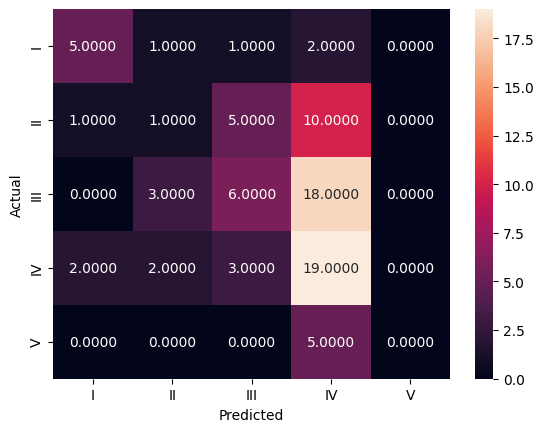



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Glove-Basic-Accident                 KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1  Potential Acc: Glove-Basic-Accident               Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
2  Potential Acc: Glove-Basic-Accident  LogisticRegression        0.685629       0.333333   0.349567  0.333333  0.332524
3  Potential Acc: Glove-Basic-Accident       GradientBoost        1.000000       0.488095   0.532038  0.488095  0.472378
4  Potential Acc: Glove-Basic-Accident                 SVM        0.491018       0.345238   0.306831  0.345238  0.258694
5  Potential Acc: Glove-Basic-Accident             Bagging        0.982036       0.333333   0.333013  0.333333  0.321007
6  Potential Acc: Glove-Basic-Accident        R

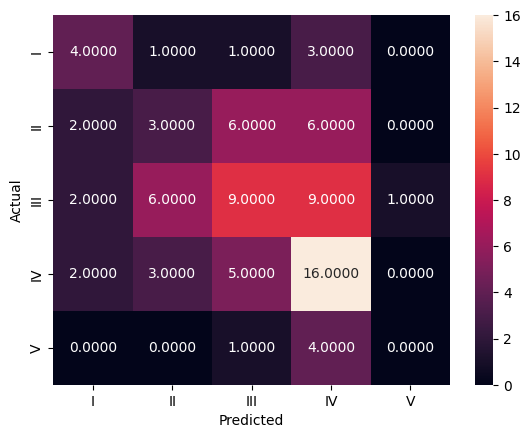



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Glove-Basic-Accident                 KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1  Potential Acc: Glove-Basic-Accident               Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
2  Potential Acc: Glove-Basic-Accident  LogisticRegression        0.685629       0.333333   0.349567  0.333333  0.332524
3  Potential Acc: Glove-Basic-Accident       GradientBoost        1.000000       0.488095   0.532038  0.488095  0.472378
4  Potential Acc: Glove-Basic-Accident                 SVM        0.491018       0.345238   0.306831  0.345238  0.258694
5  Potential Acc: Glove-Basic-Accident             Bagging        0.982036       0.333333   0.333013  0.333333  0.321007
6  Potential Acc: Glove-Basic-Accident        R

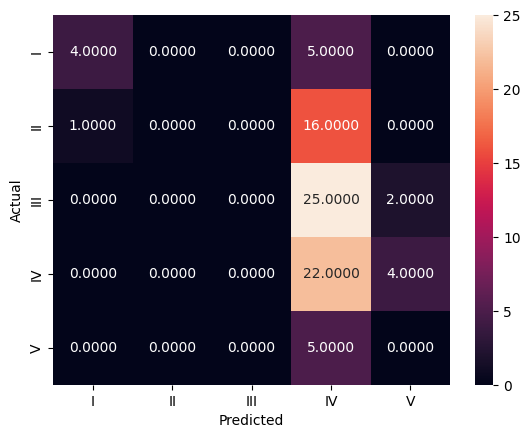



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Glove-Basic-Accident                 KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1  Potential Acc: Glove-Basic-Accident               Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
2  Potential Acc: Glove-Basic-Accident  LogisticRegression        0.685629       0.333333   0.349567  0.333333  0.332524
3  Potential Acc: Glove-Basic-Accident       GradientBoost        1.000000       0.488095   0.532038  0.488095  0.472378
4  Potential Acc: Glove-Basic-Accident                 SVM        0.491018       0.345238   0.306831  0.345238  0.258694
5  Potential Acc: Glove-Basic-Accident             Bagging        0.982036       0.333333   0.333013  0.333333  0.321007
6  Potential Acc: Glove-Basic-Accident        R

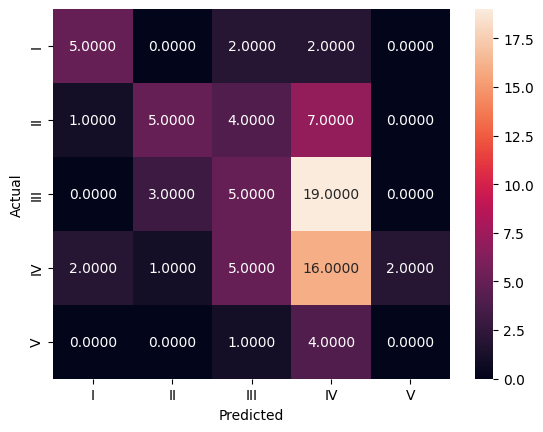



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: Glove-Basic-Accident                 KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1  Potential Acc: Glove-Basic-Accident               Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
2  Potential Acc: Glove-Basic-Accident  LogisticRegression        0.685629       0.333333   0.349567  0.333333  0.332524
3  Potential Acc: Glove-Basic-Accident       GradientBoost        1.000000       0.488095   0.532038  0.488095  0.472378
4  Potential Acc: Glove-Basic-Accident                 SVM        0.491018       0.345238   0.306831  0.345238  0.258694
5  Potential Acc: Glove-Basic-Accident             Bagging        0.982036       0.333333   0.333013  0.333333  0.321007
6  Potential Acc: Glove-Basic-Accident        R

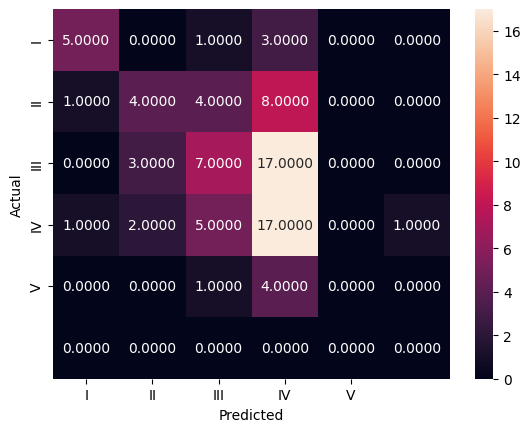



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                    Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0   Potential Acc: Glove-Basic-Accident                 KNN        1.000000       0.309524   0.342560  0.309524  0.299440
1   Potential Acc: Glove-Basic-Accident               Ridge        0.769461       0.392857   0.395048  0.392857  0.382516
2   Potential Acc: Glove-Basic-Accident  LogisticRegression        0.685629       0.333333   0.349567  0.333333  0.332524
3   Potential Acc: Glove-Basic-Accident       GradientBoost        1.000000       0.488095   0.532038  0.488095  0.472378
4   Potential Acc: Glove-Basic-Accident                 SVM        0.491018       0.345238   0.306831  0.345238  0.258694
5   Potential Acc: Glove-Basic-Accident             Bagging        0.982036       0.333333   0.333013  0.333333  0.321007
6   Potential Acc: Glove-Basic-Accident 

In [ ]:
combinedResult_Pot = pd.concat([combinedResult_Pot, runAllModelDefault(X_train=X_train_glove_p,Y_train=y_train_glove_p,X_test=X_test_glove_p,Y_test=y_test_glove_p,descriptionOfData="Potential Acc: Glove-Basic-Accident")],ignore_index=True,sort=False)

Model :  KNN



Classification - Heatmap




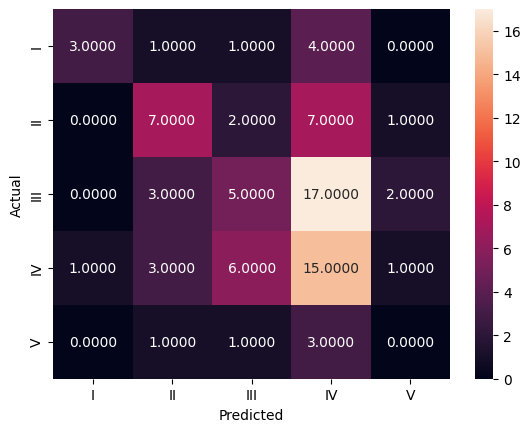



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident       KNN             1.0       0.357143   0.382876  0.357143  0.343491
Model :  Ridge



Classification - Heatmap




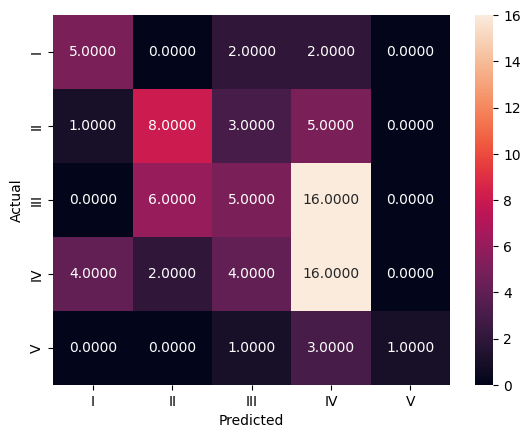



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident       KNN             1.0       0.357143   0.382876  0.357143  0.343491
1  Potential Acc: TFIDF-Basic-Accident     Ridge             1.0       0.416667   0.439342  0.416667  0.396545
Model :  LogisticRegression



Classification - Heatmap




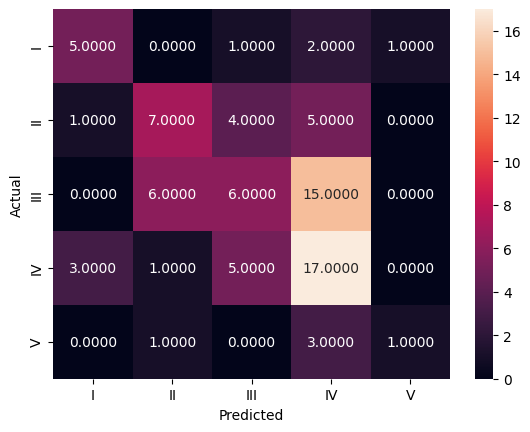



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident                 KNN        1.000000       0.357143   0.382876  0.357143  0.343491
1  Potential Acc: TFIDF-Basic-Accident               Ridge        1.000000       0.416667   0.439342  0.416667  0.396545
2  Potential Acc: TFIDF-Basic-Accident  LogisticRegression        0.829341       0.428571   0.429549  0.428571  0.409535
Model :  GradientBoost



Classification - Heatmap




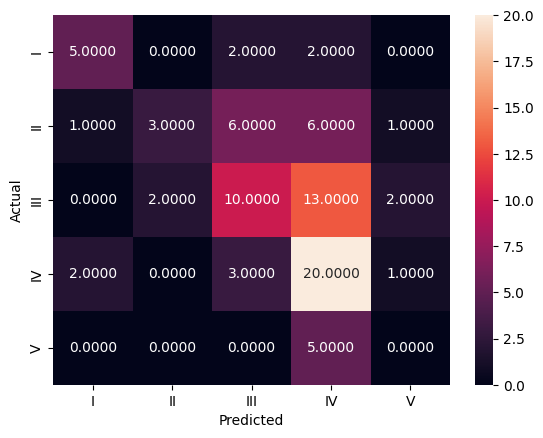



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident                 KNN        1.000000       0.357143   0.382876  0.357143  0.343491
1  Potential Acc: TFIDF-Basic-Accident               Ridge        1.000000       0.416667   0.439342  0.416667  0.396545
2  Potential Acc: TFIDF-Basic-Accident  LogisticRegression        0.829341       0.428571   0.429549  0.428571  0.409535
3  Potential Acc: TFIDF-Basic-Accident       GradientBoost        1.000000       0.452381   0.476030  0.452381  0.424106
Model :  SVM



Classification - Heatmap




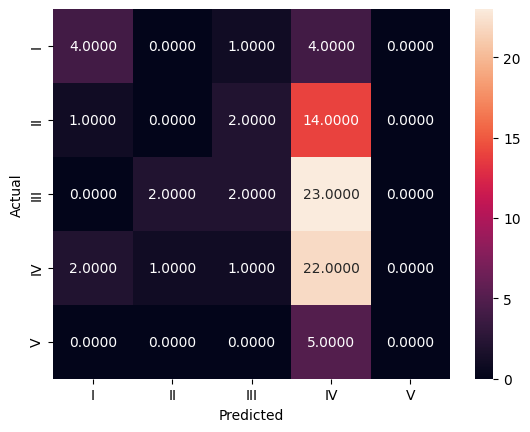



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident                 KNN        1.000000       0.357143   0.382876  0.357143  0.343491
1  Potential Acc: TFIDF-Basic-Accident               Ridge        1.000000       0.416667   0.439342  0.416667  0.396545
2  Potential Acc: TFIDF-Basic-Accident  LogisticRegression        0.829341       0.428571   0.429549  0.428571  0.409535
3  Potential Acc: TFIDF-Basic-Accident       GradientBoost        1.000000       0.452381   0.476030  0.452381  0.424106
4  Potential Acc: TFIDF-Basic-Accident                 SVM        0.494012       0.333333   0.268507  0.333333  0.237416
Model :  Bagging



Classification - Heatmap




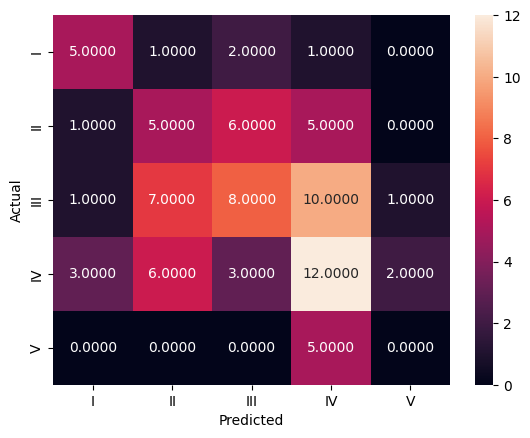



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident                 KNN        1.000000       0.357143   0.382876  0.357143  0.343491
1  Potential Acc: TFIDF-Basic-Accident               Ridge        1.000000       0.416667   0.439342  0.416667  0.396545
2  Potential Acc: TFIDF-Basic-Accident  LogisticRegression        0.829341       0.428571   0.429549  0.428571  0.409535
3  Potential Acc: TFIDF-Basic-Accident       GradientBoost        1.000000       0.452381   0.476030  0.452381  0.424106
4  Potential Acc: TFIDF-Basic-Accident                 SVM        0.494012       0.333333   0.268507  0.333333  0.237416
5  Potential Acc: TFIDF-Basic-Accident             Bagging        0.985030       0.357143   0.354722  0.357143  0.350317
Model :  RandomForest



Classification - Heatm

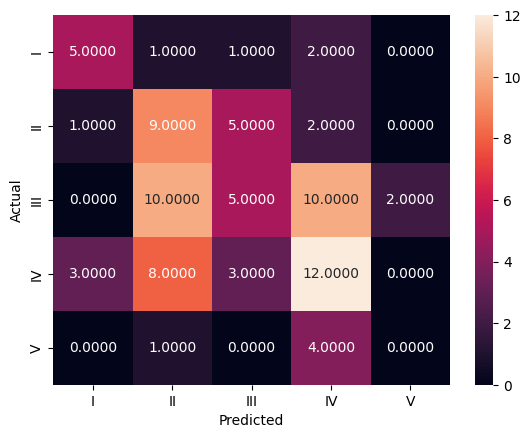



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident                 KNN        1.000000       0.357143   0.382876  0.357143  0.343491
1  Potential Acc: TFIDF-Basic-Accident               Ridge        1.000000       0.416667   0.439342  0.416667  0.396545
2  Potential Acc: TFIDF-Basic-Accident  LogisticRegression        0.829341       0.428571   0.429549  0.428571  0.409535
3  Potential Acc: TFIDF-Basic-Accident       GradientBoost        1.000000       0.452381   0.476030  0.452381  0.424106
4  Potential Acc: TFIDF-Basic-Accident                 SVM        0.494012       0.333333   0.268507  0.333333  0.237416
5  Potential Acc: TFIDF-Basic-Accident             Bagging        0.985030       0.357143   0.354722  0.357143  0.350317
6  Potential Acc: TFIDF-Basic-Accident        R

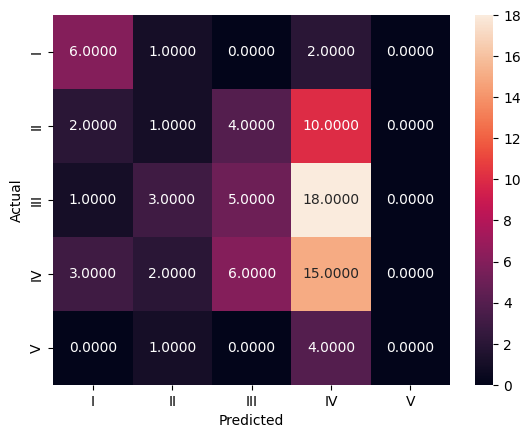



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident                 KNN        1.000000       0.357143   0.382876  0.357143  0.343491
1  Potential Acc: TFIDF-Basic-Accident               Ridge        1.000000       0.416667   0.439342  0.416667  0.396545
2  Potential Acc: TFIDF-Basic-Accident  LogisticRegression        0.829341       0.428571   0.429549  0.428571  0.409535
3  Potential Acc: TFIDF-Basic-Accident       GradientBoost        1.000000       0.452381   0.476030  0.452381  0.424106
4  Potential Acc: TFIDF-Basic-Accident                 SVM        0.494012       0.333333   0.268507  0.333333  0.237416
5  Potential Acc: TFIDF-Basic-Accident             Bagging        0.985030       0.357143   0.354722  0.357143  0.350317
6  Potential Acc: TFIDF-Basic-Accident        R

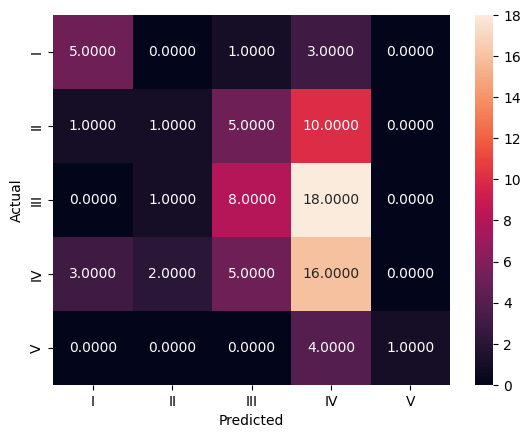



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident                 KNN        1.000000       0.357143   0.382876  0.357143  0.343491
1  Potential Acc: TFIDF-Basic-Accident               Ridge        1.000000       0.416667   0.439342  0.416667  0.396545
2  Potential Acc: TFIDF-Basic-Accident  LogisticRegression        0.829341       0.428571   0.429549  0.428571  0.409535
3  Potential Acc: TFIDF-Basic-Accident       GradientBoost        1.000000       0.452381   0.476030  0.452381  0.424106
4  Potential Acc: TFIDF-Basic-Accident                 SVM        0.494012       0.333333   0.268507  0.333333  0.237416
5  Potential Acc: TFIDF-Basic-Accident             Bagging        0.985030       0.357143   0.354722  0.357143  0.350317
6  Potential Acc: TFIDF-Basic-Accident        R

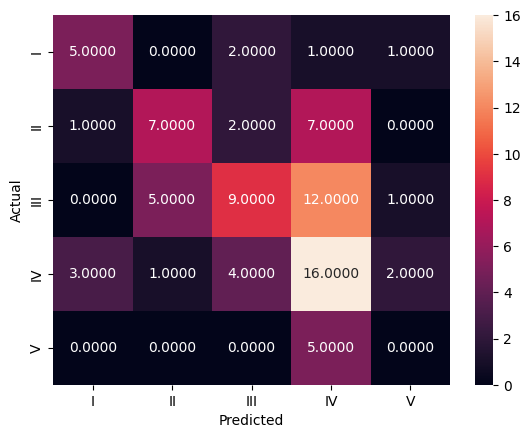



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                   Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Potential Acc: TFIDF-Basic-Accident                 KNN        1.000000       0.357143   0.382876  0.357143  0.343491
1  Potential Acc: TFIDF-Basic-Accident               Ridge        1.000000       0.416667   0.439342  0.416667  0.396545
2  Potential Acc: TFIDF-Basic-Accident  LogisticRegression        0.829341       0.428571   0.429549  0.428571  0.409535
3  Potential Acc: TFIDF-Basic-Accident       GradientBoost        1.000000       0.452381   0.476030  0.452381  0.424106
4  Potential Acc: TFIDF-Basic-Accident                 SVM        0.494012       0.333333   0.268507  0.333333  0.237416
5  Potential Acc: TFIDF-Basic-Accident             Bagging        0.985030       0.357143   0.354722  0.357143  0.350317
6  Potential Acc: TFIDF-Basic-Accident        R

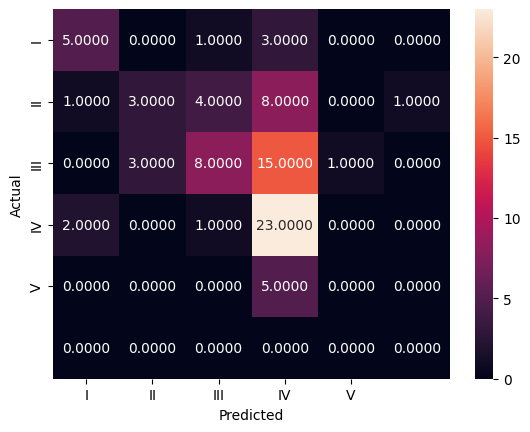



Classification - Report


<function classification_report at 0x7ce4fb98eef0>
Models Performance Summary
                    Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0   Potential Acc: TFIDF-Basic-Accident                 KNN        1.000000       0.357143   0.382876  0.357143  0.343491
1   Potential Acc: TFIDF-Basic-Accident               Ridge        1.000000       0.416667   0.439342  0.416667  0.396545
2   Potential Acc: TFIDF-Basic-Accident  LogisticRegression        0.829341       0.428571   0.429549  0.428571  0.409535
3   Potential Acc: TFIDF-Basic-Accident       GradientBoost        1.000000       0.452381   0.476030  0.452381  0.424106
4   Potential Acc: TFIDF-Basic-Accident                 SVM        0.494012       0.333333   0.268507  0.333333  0.237416
5   Potential Acc: TFIDF-Basic-Accident             Bagging        0.985030       0.357143   0.354722  0.357143  0.350317
6   Potential Acc: TFIDF-Basic-Accident 

In [ ]:
combinedResult_Pot = pd.concat([combinedResult_Pot, runAllModelDefault(X_train=X_train_tfidf_p,Y_train=y_train_tfidf_p,X_test=X_test_tfidf_p,Y_test=y_test_tfidf_p,descriptionOfData="Potential Acc: TFIDF-Basic-Accident")],ignore_index=True,sort=False)

In [ ]:
print("Combined results based on Potential accident level as target:")
combinedResult_Pot

Combined results based on Potential accident level as target:


,Description Of Data,ModelName,Train Accuracy,Test Accuracy,Precision,Recall,F1
0,Potential Acc: Word2Vec-Basic-Accident,KNN,1.000000,0.333333,0.351785,0.333333,0.323133
1,Potential Acc: Word2Vec-Basic-Accident,Ridge,0.580838,0.345238,0.318958,0.345238,0.314690
2,Potential Acc: Word2Vec-Basic-Accident,LogisticRegression,0.574850,0.345238,0.331143,0.345238,0.319466
3,Potential Acc: Word2Vec-Basic-Accident,GradientBoost,1.000000,0.428571,0.454034,0.428571,0.420352
4,Potential Acc: Word2Vec-Basic-Accident,SVM,0.479042,0.333333,0.270002,0.333333,0.238974
5,Potential Acc: Word2Vec-Basic-Accident,Bagging,0.985030,0.357143,0.355263,0.357143,0.350662
6,Potential Acc: Word2Vec-Basic-Accident,RandomForest,1.000000,0.380952,0.395105,0.380952,0.354048
7,Potential Acc: Word2Vec-Basic-Accident,DecisionTree,0.670659,0.392857,0.425240,0.392857,0.391922
8,Potential Acc: Word2Vec-Basic-Accident,AdaBoost,0.395210,0.333333,0.252778,0.333333,0.260916
9,Potential Acc: Word2Vec-Basic-Accident,XGBoost,1.000000,0.369048,0.399282,0.369048,0.355182


Potential accident level as target is not producing good results - test accuracy as well as F1 scores are very less for all models.
<br>
This shows that Accident level is better Target class than potential accident level

###### Hyper Parameter Tuning

In [ ]:
def runTunedModel(model,X_train,Y_train,X_test,Y_test,descriptionOfData,nameOfTheModel):
    print("="*100)
    print("Model : ", nameOfTheModel)
    print("="*100)
    print("\n\n")
    model.fit(X_train,Y_train)
    y_predict = model.predict(X_test)
    trainAccuracyScore = model.score(X_train,Y_train)
    testAccuracyScore = model.score(X_test,Y_test)
    precisionScore = precision_score(Y_test,y_predict,average='weighted')
    recallScore = recall_score(Y_test,y_predict,average='weighted')
    f1Score = f1_score(Y_test,y_predict,average='weighted')
    print("=="*20)
    print('Classification - Heatmap')
    print("=="*20)
    print("\n")
    classificationMatrix = confusion_matrix(Y_test,y_predict)
    sns.heatmap(classificationMatrix,annot=True,fmt=".4f",xticklabels = ["I", "II", "III", "IV", "V"] , yticklabels = ["I", "II", "III", "IV", "V"] )
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()
    print("\n")
    print("=="*20)
    classificationReport = classification_report(Y_test,y_predict)
    print('Classification - Report')
    print("=="*20)
    print("\n")
    print(classification_report)

    nameofModel=[]
    trainAccScore=[]
    testAccScore=[]
    precissionSc=[]
    recallSc=[]
    f1Sc=[]

    nameofModel.append(nameOfTheModel)
    trainAccScore.append(trainAccuracyScore)
    testAccScore.append(testAccuracyScore)
    precissionSc.append(precisionScore)
    recallSc.append(recallScore)
    f1Sc.append(f1Score)

    resultDF = pd.DataFrame({'Description Of Data':descriptionOfData,
                            'ModelName':nameofModel,
                            'Train Accuracy':trainAccScore,
                            'Test Accuracy':testAccScore,
                            'Precision':precissionSc,
                            'Recall':recallSc,
                            'F1':f1Sc})
    print("=="*20)
    print("Models Performance Summary")
    print("=="*20)
    print(resultDF)
    return resultDF

In [ ]:
combinedResult_tune = pd.DataFrame(columns=['Description Of Data','ModelName','Train Accuracy','Test Accuracy','Precision','Recall','F1'])

Model :  LogisticRegression RandomizedSearchCV



Classification - Heatmap




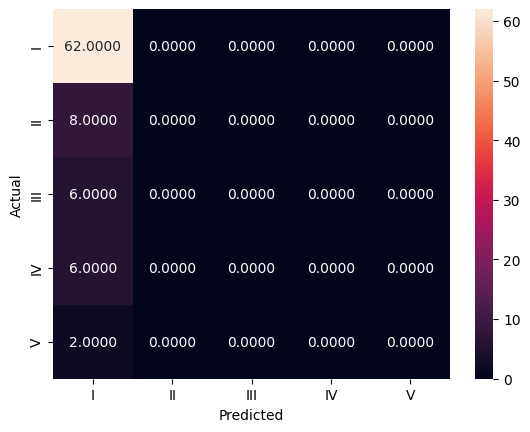



Classification - Report


<function classification_report at 0x7be80f04ef80>
Models Performance Summary
                              Description Of Data  \
0  LR Hyper param tuning: Word2Vec-Basic-Accident   

                               ModelName  Train Accuracy  Test Accuracy  \
0  LogisticRegression RandomizedSearchCV        0.739521       0.738095   

   Precision    Recall        F1  
0   0.544785  0.738095  0.626875  


In [ ]:
# LOGISTIC REGRESSION-
# SVM Results for Word2Vec
#LR Hyper Param

# Define the parameter grid for Logistic Regression
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization strength
    'penalty': ['l1', 'l2'],  # Regularization type
    'solver': ['liblinear', 'saga'],  # Optimization algorithm
    'max_iter': [100, 200, 300]  # Number of iterations
}

# Initialize RandomizedSearchCV
random_search_lr = RandomizedSearchCV(
    LogisticRegression(),
    param_grid,
    cv=4,
    n_iter=10,  # Number of parameter settings sampled
    random_state=7
)

# Collect results into a list
results = []
results.append(runTunedModel(model=random_search_lr, X_train=X_train_w2v, Y_train=y_train_w2v, X_test=X_test_w2v, Y_test=y_test_w2v, descriptionOfData="LR Hyper param tuning: Word2Vec-Basic-Accident", nameOfTheModel="LogisticRegression RandomizedSearchCV"))

Model :  LogisticRegression RandomizedSearchCV



Classification - Heatmap




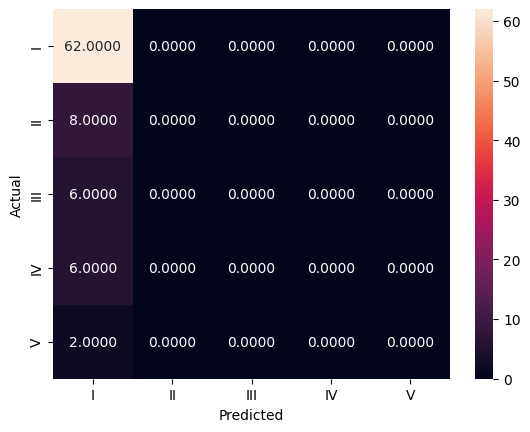



Classification - Report


<function classification_report at 0x7be80f04ef80>
Models Performance Summary
                           Description Of Data  \
0  LR Hyper param tuning: TfIdf-Basic-Accident   

                               ModelName  Train Accuracy  Test Accuracy  \
0  LogisticRegression RandomizedSearchCV        0.739521       0.738095   

   Precision    Recall        F1  
0   0.544785  0.738095  0.626875  


In [ ]:
# Logistic Regression Results for TfIdf
# Append the second result
results.append(runTunedModel(model=random_search_lr, X_train=X_train_tfidf, Y_train=y_train_tfidf, X_test=X_test_tfidf, Y_test=y_test_tfidf, descriptionOfData="LR Hyper param tuning: TfIdf-Basic-Accident", nameOfTheModel="LogisticRegression RandomizedSearchCV"))


In [ ]:
# Concatenate and Display Results
# Concatenate results into a DataFrame
combinedResult_tune = pd.concat(results, ignore_index=True)

# Display the final DataFrame
print(combinedResult_tune)


                              Description Of Data  \
0  LR Hyper param tuning: Word2Vec-Basic-Accident   
1     LR Hyper param tuning: TfIdf-Basic-Accident   

                               ModelName  Train Accuracy  Test Accuracy  \
0  LogisticRegression RandomizedSearchCV        0.739521       0.738095   
1  LogisticRegression RandomizedSearchCV        0.739521       0.738095   

   Precision    Recall        F1  
0   0.544785  0.738095  0.626875  
1   0.544785  0.738095  0.626875  


Model :  SVM GridSearchCV



Fitting 4 folds for each of 100 candidates, totalling 400 fits
Classification - Heatmap




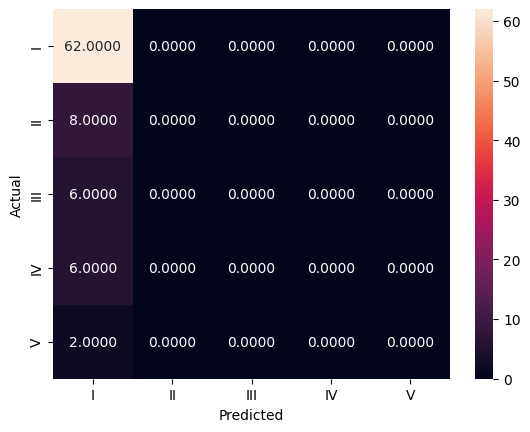



Classification - Report


<function classification_report at 0x7be80f04ef80>
Models Performance Summary
                               Description Of Data         ModelName  \
0  SVM Hyper param tuning: Word2Vec-Basic-Accident  SVM GridSearchCV   

   Train Accuracy  Test Accuracy  Precision    Recall        F1  
0        0.739521       0.738095   0.544785  0.738095  0.626875  


In [ ]:
# SVM-
# Define the parameter grid for SVM
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['linear', 'rbf', 'sigmoid', 'poly']}

# Initialize GridSearchCV
grid = GridSearchCV(SVC(), param_grid, cv=4, verbose=True)

# Collect results into a list
results = []
results.append(runTunedModel(model=grid, X_train=X_train_w2v, Y_train=y_train_w2v, X_test=X_test_w2v, Y_test=y_test_w2v, descriptionOfData="SVM Hyper param tuning: Word2Vec-Basic-Accident", nameOfTheModel="SVM GridSearchCV"))

Model :  SVM GridSearchCV



Fitting 4 folds for each of 100 candidates, totalling 400 fits
Classification - Heatmap




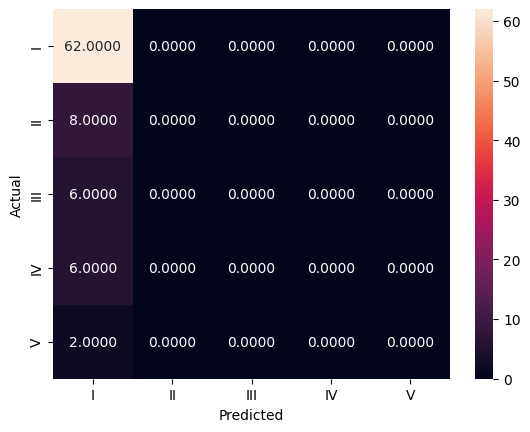



Classification - Report


<function classification_report at 0x7be80f04ef80>
Models Performance Summary
                            Description Of Data         ModelName  \
0  SVM Hyper param tuning: TfIdf-Basic-Accident  SVM GridSearchCV   

   Train Accuracy  Test Accuracy  Precision    Recall        F1  
0        0.739521       0.738095   0.544785  0.738095  0.626875  


In [ ]:
# SVM Results for TfIdf
results.append(runTunedModel(model=grid, X_train=X_train_tfidf, Y_train=y_train_tfidf, X_test=X_test_tfidf, Y_test=y_test_tfidf, descriptionOfData="SVM Hyper param tuning: TfIdf-Basic-Accident", nameOfTheModel="SVM GridSearchCV"))

In [ ]:
# Concatenate and Display Results
combinedResult_tune = pd.concat(results, ignore_index=True)

# Set display width for better readability
pd.set_option('display.width', 1000)
print(combinedResult_tune)

                               Description Of Data         ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  SVM Hyper param tuning: Word2Vec-Basic-Accident  SVM GridSearchCV        0.739521       0.738095   0.544785  0.738095  0.626875
1     SVM Hyper param tuning: TfIdf-Basic-Accident  SVM GridSearchCV        0.739521       0.738095   0.544785  0.738095  0.626875


Model :  Ridge GridSearchCV



Fitting 4 folds for each of 25 candidates, totalling 100 fits
Classification - Heatmap




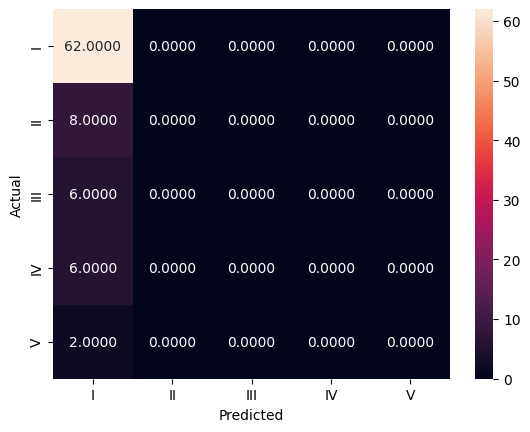



Classification - Report


<function classification_report at 0x7be80f04ef80>
Models Performance Summary
                                 Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Ridge Hyper param tuning: Word2Vec-Basic-Accident  Ridge GridSearchCV        0.739521       0.738095   0.544785  0.738095  0.626875


In [ ]:
# Ridge Classifier Results for Word2Vec-
from sklearn.linear_model import RidgeClassifier
# Define the parameter grid for Ridge Classifier
param_grid = {'alpha': [0.1, 1, 10, 100, 1000],  # Regularization strength
              'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg']}

# Initialize GridSearchCV
grid = GridSearchCV(RidgeClassifier(), param_grid, cv=4, verbose=True)

# Collect results into a list
results = []
results.append(runTunedModel(model=grid, X_train=X_train_w2v, Y_train=y_train_w2v, X_test=X_test_w2v, Y_test=y_test_w2v, descriptionOfData="Ridge Hyper param tuning: Word2Vec-Basic-Accident", nameOfTheModel="Ridge GridSearchCV"))

Model :  Ridge GridSearchCV



Fitting 4 folds for each of 25 candidates, totalling 100 fits
Classification - Heatmap




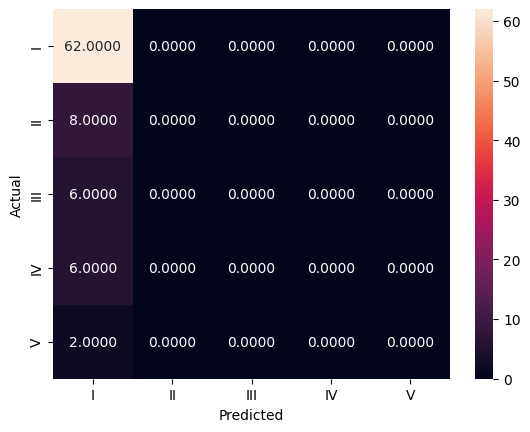



Classification - Report


<function classification_report at 0x7be80f04ef80>
Models Performance Summary
                              Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Ridge Hyper param tuning: TfIdf-Basic-Accident  Ridge GridSearchCV        0.742515       0.738095   0.544785  0.738095  0.626875


In [ ]:
#  Ridge Classifier Results for TfIdf
# Append the second result

results.append(runTunedModel(model=grid, X_train=X_train_tfidf, Y_train=y_train_tfidf, X_test=X_test_tfidf, Y_test=y_test_tfidf, descriptionOfData="Ridge Hyper param tuning: TfIdf-Basic-Accident", nameOfTheModel="Ridge GridSearchCV"))

In [ ]:
# Concatenate, Display, and Save Results

# Concatenate results into a DataFrame
combinedResult_tune = pd.concat(results, ignore_index=True)

# Set display width for better readability
pd.set_option('display.width', 1000)
print(combinedResult_tune)

# Save the DataFrame to a CSV file
combinedResult_tune.to_csv('Model Performance Report tuned.csv', index=False)

                                 Description Of Data           ModelName  Train Accuracy  Test Accuracy  Precision    Recall        F1
0  Ridge Hyper param tuning: Word2Vec-Basic-Accident  Ridge GridSearchCV        0.739521       0.738095   0.544785  0.738095  0.626875
1     Ridge Hyper param tuning: TfIdf-Basic-Accident  Ridge GridSearchCV        0.742515       0.738095   0.544785  0.738095  0.626875


### Best Model
 After performing hyper parameter tuning, we conclude that SVC on word2vec/TF IDF and Ridge classifier on TF IDF Embedding are the best models with ~74% accuracy on train and test data and  with F1 score 0.62

## Milestone 2

###### Inputs and Libraries

In [ ]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 9.1 MB/s eta 0:00:00


In [ ]:
!pip install scikeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 41.1 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import keras_tuner as kt
from tensorflow.keras.preprocessing.text import Tokenizer
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, recall_score, precision_score, classification_report
from sklearn.utils import resample
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout,BatchNormalization,LSTM
from tensorflow.keras import regularizers, backend, optimizers
from scikeras.wrappers import KerasClassifier
from tensorflow.keras.utils import to_categorical
from keras.constraints import unit_norm
from keras.regularizers import l1, l2, l1_l2
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.models import model_from_json
from sklearn import metrics
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.layers import SimpleRNN
from scikeras.wrappers import KerasClassifier


###### Define functions for split

In [ ]:
def split(X,y):
    # Initial split into training (80%) and testing (20%)
    if np.min(np.bincount(y)) < 2:
    #Remove stratification if y has single sample - required in case of potential accident level V
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    else:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)
    return X_train,X_test,y_train,y_test

##### Reading the feature/embedded data

In [ ]:
#Alternate Read for Files from Local PC
df_w2v_import = pd.read_excel('/content/drive/My Drive/AIML/feature_df_final_word2vec.xlsx')
df_glove_import = pd.read_excel('/content/drive/My Drive/AIML/feature_df_final_glove.xlsx')
df_tfidf_import= pd.read_excel('/content/drive/My Drive/AIML/feature_df_final_tfidf.xlsx')

##### Preparing X and Y

In [ ]:
#Deleting Unnamed column
df_w2v_import = df_w2v_import.drop(df_w2v_import.columns[[0]],axis = 1)
df_glove_import = df_glove_import.drop(df_glove_import.columns[[0]],axis = 1)
df_tfidf_import = df_tfidf_import.drop(df_tfidf_import.columns[[0]],axis = 1)

X_w2v = df_w2v_import.drop(['Accident Level','Potential Accident Level'], axis = 1)
X_glove = df_glove_import.drop(['Accident Level','Potential Accident Level'], axis = 1)
X_tfidf = df_tfidf_import.drop(['Accident Level','Potential Accident Level'], axis = 1)

y_w2v = df_w2v_import['Accident Level']
y_glove = df_glove_import['Accident Level']
y_tfidf = df_tfidf_import['Accident Level']

In [ ]:
# Splitting on Basic data
X_train_w2v,X_test_w2v,y_train_w2v,y_test_w2v=split(X_w2v,y_w2v)
X_train_glove,X_test_glove,y_train_glove,y_test_glove=split(X_glove,y_glove)
X_train_tfidf,X_test_tfidf,y_train_tfidf,y_test_tfidf=split(X_tfidf,y_tfidf)

#### ANN

In [ ]:
print(f'Shape of Basic W2V Train and Test Data --- \nX_train_w2v - {X_train_w2v.shape} \nX_test_w2v - {X_test_w2v.shape} \ny_train_w2v - {y_train_w2v.shape} \ny_test_w2v - {y_test_w2v.shape}')


Shape of Basic W2V Train and Test Data --- 
X_train_w2v - (334, 151) 
X_test_w2v - (84, 151) 
y_train_w2v - (334,) 
y_test_w2v - (84,)


In [ ]:
#Categorical conversion
y_train_w2v_cat = to_categorical(y_train_w2v,5)
y_test_w2v_cat = to_categorical(y_test_w2v,5)

y_train_glove_cat = to_categorical(y_train_glove,5)
y_test_glove_cat = to_categorical(y_test_glove,5)

y_train_tfidf_cat = to_categorical(y_train_tfidf,5)
y_test_tfidf_cat = to_categorical(y_test_tfidf,5)


In [ ]:
y_train_w2v_cat.shape

(334, 5)

In [ ]:
y_train_w2v_cat[1]

array([0., 1., 0., 0., 0.])

In [ ]:
import sklearn
from sklearn import metrics

def evaluationScoresandPlots(modelNN,historyNN,Accuracy,ValidationAccuracy,DataDesc,ModelDesc,X_train,Y_train,X_test,Y_test):

    print('Train and Validation Loss')
    # Capturing learning history per epoch
    hist  = pd.DataFrame(historyNN.history)
    hist['epoch'] = historyNN.epoch
    # Plotting accuracy at different epochs
    plt.plot(hist['loss'])
    plt.plot(hist['val_loss'])
    plt.legend(("Train-loss" , "Valid-loss") , loc =0)
    plt.title(f'Training and Validation Loss for data :{DataDesc} in {ModelDesc}')
    plt.show()

    print('Train and Validation Accuracy')
    # Capturing learning history per epoch
    hist  = pd.DataFrame(historyNN.history)
    hist['epoch'] = historyNN.epoch

    # Plotting accuracy at different epochs
    plt.plot(hist[Accuracy])
    plt.plot(hist[ValidationAccuracy])
    plt.legend(("Train-accuracy" , "Valid-accuracy") , loc =0)
    plt.title(f'Training and Validation Accuracy for data :{DataDesc} in {ModelDesc}')
    plt.show()

    y_test_arg=np.argmax(Y_test,axis=1)
    Y_pred = np.argmax(modelNN.predict(X_test),axis=1)
    print('Confusion Matrix')

    cm=confusion_matrix(y_test_arg,Y_pred, labels=list(range(0,5)))
    cm_df = pd.DataFrame(cm,
                        index = list(range(0,5)),
                        columns = list(range(0,5)))

    plt.figure(figsize=(10,7))
    sns.heatmap(cm_df,annot=True,fmt='d')
    plt.xlabel('Predicted')
    plt.ylabel('Truth')
    plt.show()

    #y_pred=modelNN.predict(X_test)
    #y_pred = (y_pred > 0.5)
    #Accuracy as per the classification report
    cr=metrics.classification_report(y_test_arg,Y_pred)
    print(cr)

    # evaluate the keras model
    _, train_accuracy = modelNN.evaluate(X_train, Y_train, batch_size=8, verbose=0)
    _, test_accuracy = modelNN.evaluate(X_test, Y_test, batch_size=8, verbose=0)

    train_accuracy_score = round(train_accuracy*100,2)
    test_accuracy_score = round(test_accuracy*100,2)

    f1_score_value = round(sklearn.metrics.f1_score(y_test_arg,Y_pred,average='weighted')*100,2)

    tempResult = pd.DataFrame({'Data Description':DataDesc,
                                'Model Description':ModelDesc,
                                'Train Accuracy':train_accuracy_score,
                                'Test Accuracy':test_accuracy_score,
                                'F1 Score':f1_score_value
                                }, index=[0])

    print(f'Result Summary \n --------------------- \n :{tempResult}\n\n')
    return tempResult

##### Reset and Set Data for Collection

In [ ]:
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(7)
import random
random.seed(7)
tf.random.set_seed(7)
combinedNNModelResult = pd.DataFrame(columns=['Data Description','Model Description','Train Accuracy','Test Accuracy', 'F1 Score'])

##### NN Model On W2V

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │           9,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 5)                   │             165 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,973 (46.77 KB)

 Trainable params: 11,973 (46.77 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.0775 - loss: 1.7080 - val_accuracy: 0.4030 - val_loss: 1.4161
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5864 - loss: 1.2989 - val_accuracy: 0.7164 - val_loss: 1.1690
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7178 - loss: 1.1101 - val_accuracy: 0.7313 - val_loss: 1.0640
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7178 - loss: 1.0348 - val_accuracy: 0.7313 - val_loss: 1.0237
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7178 - loss: 1.0076 - val_accuracy: 0.7313 - val_loss: 0.9984
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7178 - loss: 0.9879 - val_accuracy: 0.7313 - val_loss: 0.9699
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7178 - loss: 0.9664 - val_accuracy: 0.7313 - val_loss: 0.9465
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7178 - loss: 0.9494 - val_accuracy: 0.7313 - val_loss: 0.9307
Epoch 9

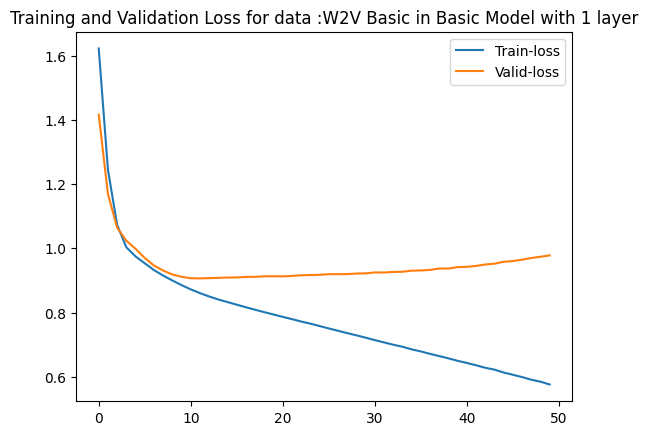

Train and Validation Accuracy


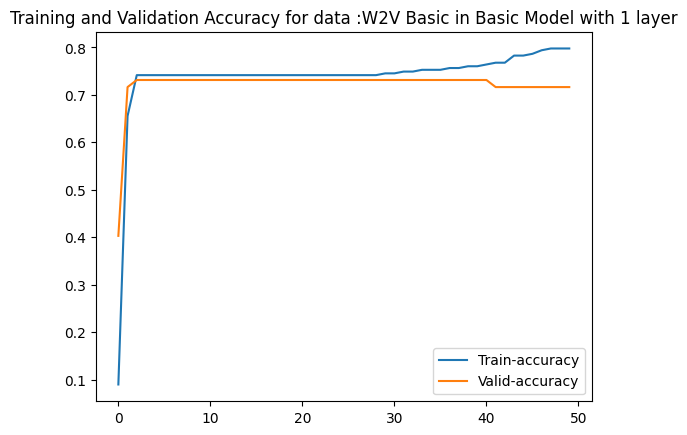

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Confusion Matrix


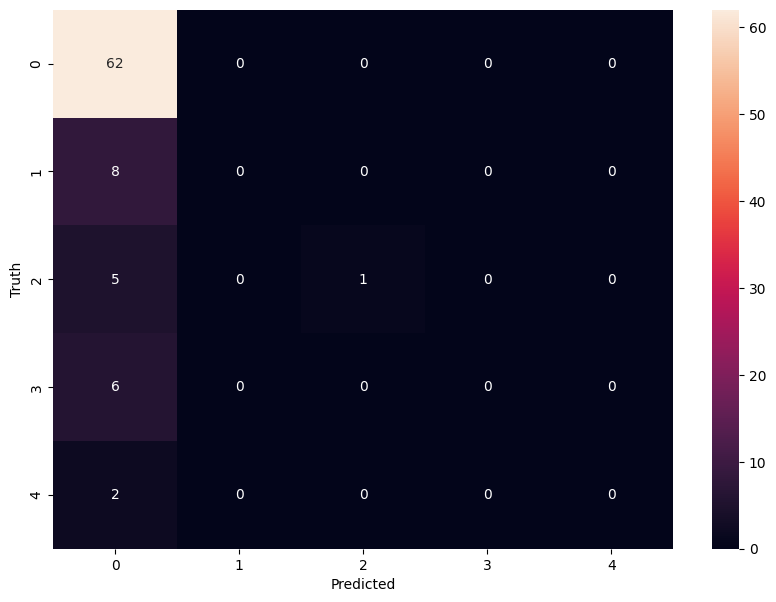

              precision    recall  f1-score   support

           0       0.75      1.00      0.86        62
           1       0.00      0.00      0.00         8
           2       1.00      0.17      0.29         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.75        84
   macro avg       0.35      0.23      0.23        84
weighted avg       0.62      0.75      0.65        84

Result Summary 
 --------------------- 
 :  Data Description         Model Description  Train Accuracy  Test Accuracy  \
0        W2V Basic  Basic Model with 1 layer           78.44           75.0   

   F1 Score  
0     65.16  


Collating Results : 
-----------------------
  Data Description         Model Description  Train Accuracy  Test Accuracy  F1 Score
0        W2V Basic  Basic Model with 1 layer           78.44           75.0     65.16



In [ ]:
modelDesc = 'Basic Model with 1 layer'
dataDesc =  'W2V Basic'
# Initializing the ANN
modelw2v_basic = Sequential()

# This adds the input layer
modelw2v_basic.add(Dense(activation = 'relu', input_dim = X_train_w2v.shape[1], units=64))

#Add 1st hidden layer
modelw2v_basic.add(Dense(32, activation='relu'))

# Adding the output layer
modelw2v_basic.add(Dense(5, activation = 'softmax'))

# Compile the model
modelw2v_basic.compile(optimizer=(optimizers.Adam(learning_rate=1e-3)), loss='categorical_crossentropy', metrics=['accuracy'])
modelw2v_basic.summary()

history=modelw2v_basic.fit(X_train_w2v, y_train_w2v_cat,
          validation_split=0.2,
          epochs=50,
          batch_size=32,verbose=1)

combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=modelw2v_basic,historyNN=history,Accuracy='accuracy',ValidationAccuracy='val_accuracy',DataDesc=dataDesc,ModelDesc=modelDesc,X_train=X_train_w2v,Y_train=y_train_w2v_cat,X_test=X_test_w2v,Y_test=y_test_w2v_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

- We can see that with basic w2v data and model with not much layers added, yields better results.
- With PCA and Upsample, the accuracy comes down little on training data, but drastically on test data- Overfitting
- With SMOTE, the accuracy is minimal- Underfitting
- Hence we can go with basic data that gives more balance accuracy

##### NN Model On Glove Data




Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                      │ (None, 64)                  │           9,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 5)                   │             165 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,973 (46.77 KB)

 Trainable params: 11,973 (46.77 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.1896 - loss: 1.5895 - val_accuracy: 0.7313 - val_loss: 1.2517
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7178 - loss: 1.1378 - val_accuracy: 0.7313 - val_loss: 1.0175
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7178 - loss: 0.9754 - val_accuracy: 0.7313 - val_loss: 0.9973
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7178 - loss: 0.9695 - val_accuracy: 0.7313 - val_loss: 0.9688
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7178 - loss: 0.9437 - val_accuracy: 0.7313 - val_loss: 0.9473
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7178 - loss: 0.9221 - val_accuracy: 0.7313 - val_loss: 0.9365
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7178 - loss: 0.9055 - val_accuracy: 0.7313 - val_loss: 0.9273
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7178 - loss: 0.8920 - val_accuracy: 0.7313 - val_loss: 0.9172
Epoc

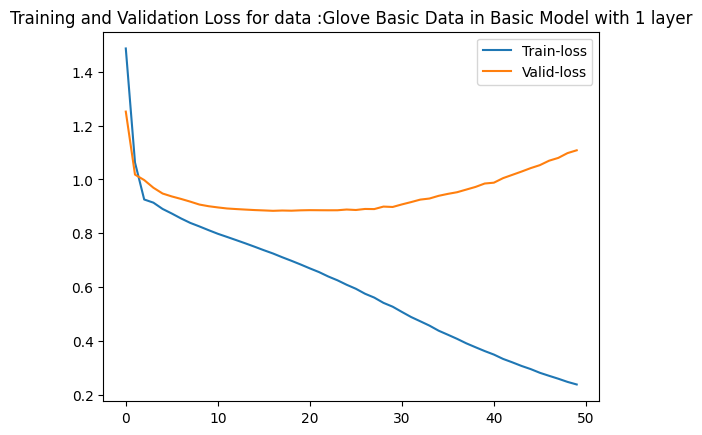

Train and Validation Accuracy


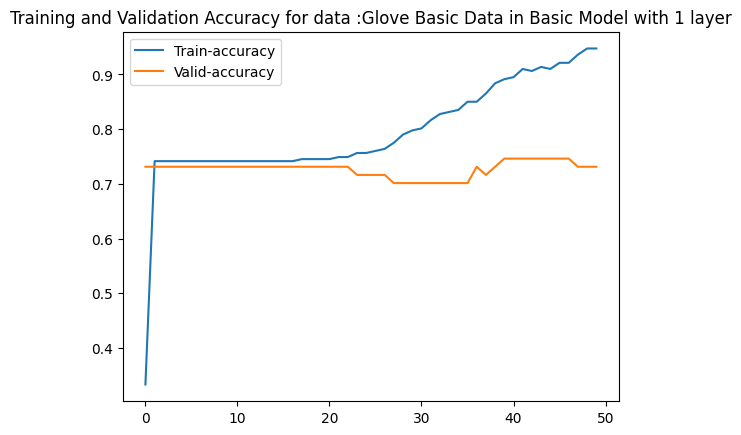

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Confusion Matrix


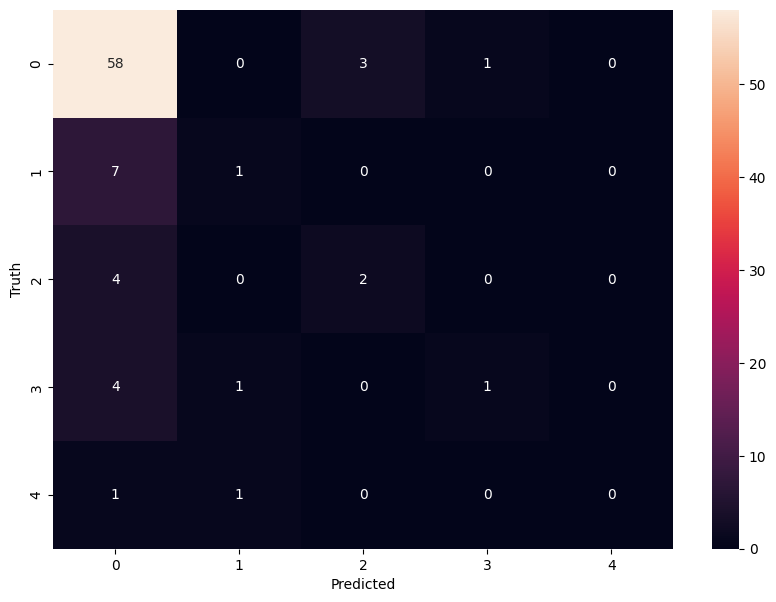

              precision    recall  f1-score   support

           0       0.78      0.94      0.85        62
           1       0.33      0.12      0.18         8
           2       0.40      0.33      0.36         6
           3       0.50      0.17      0.25         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.40      0.31      0.33        84
weighted avg       0.67      0.74      0.69        84

Result Summary 
 --------------------- 
 :   Data Description         Model Description  Train Accuracy  Test Accuracy  F1 Score
0  Glove Basic Data  Basic Model with 1 layer           91.02          73.81     69.07


Collating Results : 
-----------------------
   Data Description         Model Description  Train Accuracy  Test Accuracy  F1 Score
0         W2V Basic  Basic Model with 1 layer           78.44          75.00     65.16
0  Glove Basic Data  Basic Model with 1 layer           91.02          73.

In [ ]:
modelDesc = 'Basic Model with 1 layer'
dataDesc =  'Glove Basic Data'

# Initializing the ANN
model_basic = Sequential()

# This adds the input layer
model_basic.add(Dense(activation = 'relu', input_dim = X_train_glove.shape[1], units=64))
#Add 1st hidden layer
model_basic.add(Dense(32, activation='relu'))
# Adding the output layer
model_basic.add(Dense(5, activation = 'softmax'))
# Compile the model
model_basic.compile(optimizer=(optimizers.Adam(learning_rate=1e-3)), loss='categorical_crossentropy', metrics=['accuracy'])
model_basic.summary()

history=model_basic.fit(X_train_glove, y_train_glove_cat,
          validation_split=0.2,
          epochs=50,
          batch_size=32,verbose=1)

combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=model_basic,historyNN=history,Accuracy='accuracy',ValidationAccuracy='val_accuracy',DataDesc=dataDesc,ModelDesc=modelDesc,X_train=X_train_glove,Y_train=y_train_glove_cat,X_test=X_test_glove,Y_test=y_test_glove_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

##### NN model On TFIDF Data for Basic

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                      │ (None, 64)                  │         181,696 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 5)                   │             165 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,941 (718.52 KB)

 Trainable params: 183,941 (718.52 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.2120 - loss: 1.6608 - val_accuracy: 0.7313 - val_loss: 1.4348
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7178 - loss: 1.3833 - val_accuracy: 0.7313 - val_loss: 1.2569
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7178 - loss: 1.1979 - val_accuracy: 0.7313 - val_loss: 1.0875
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7178 - loss: 1.0292 - val_accuracy: 0.7313 - val_loss: 0.9990
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7178 - loss: 0.9511 - val_accuracy: 0.7313 - val_loss: 0.9841
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7178 - loss: 0.9153 - val_accuracy: 0.7313 - val_loss: 0.9577
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7178 - loss: 0.8724 - val_accuracy: 0.7313 - val_loss: 0.9412
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7178 - loss: 0.8347 - val_accuracy: 0.7313 - val_loss: 0.9266
Epo

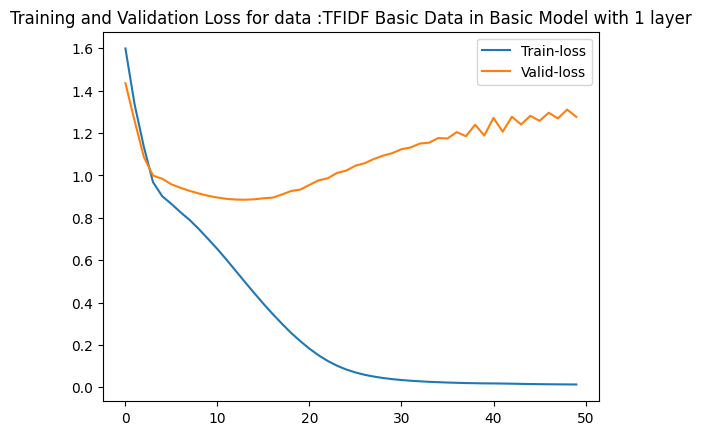

Train and Validation Accuracy


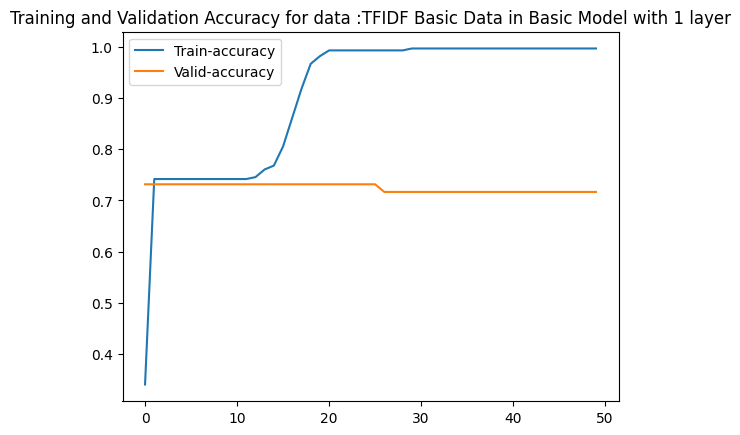

1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Confusion Matrix


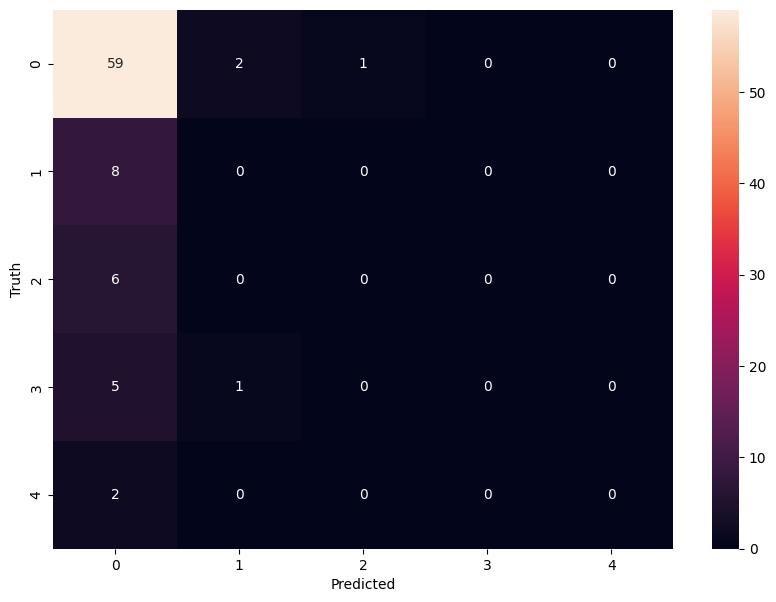

              precision    recall  f1-score   support

           0       0.74      0.95      0.83        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.70        84
   macro avg       0.15      0.19      0.17        84
weighted avg       0.54      0.70      0.61        84

Result Summary 
 --------------------- 
 :   Data Description         Model Description  Train Accuracy  Test Accuracy  F1 Score
0  TFIDF Basic Data  Basic Model with 1 layer           94.01          70.24     61.33


Collating Results : 
-----------------------
   Data Description         Model Description  Train Accuracy  Test Accuracy  F1 Score
0         W2V Basic  Basic Model with 1 layer           78.44          75.00     65.16
0  Glove Basic Data  Basic Model with 1 layer           91.02          73.

In [ ]:
modelDesc = 'Basic Model with 1 layer'
dataDesc =  'TFIDF Basic Data'
# Initializing the ANN
model_basic = Sequential()
# This adds the input layer (by specifying input dimension) AND the first hidden layer (units)
model_basic.add(Dense(activation = 'relu', input_dim = X_train_tfidf.shape[1], units=64))
#Add 1st hidden layer
model_basic.add(Dense(32, activation='relu'))
# Adding the output layer
model_basic.add(Dense(5, activation = 'softmax'))
## Compile the model
model_basic.compile(optimizer=(optimizers.Adam(learning_rate=1e-3)), loss='categorical_crossentropy', metrics=['accuracy'])
model_basic.summary()

history=model_basic.fit(X_train_tfidf, y_train_tfidf_cat,
          validation_split=0.2,
          epochs=50,
          batch_size=32,verbose=1)

combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=model_basic,historyNN=history,Accuracy='accuracy',ValidationAccuracy='val_accuracy',DataDesc=dataDesc,ModelDesc=modelDesc,X_train=X_train_tfidf,Y_train=y_train_tfidf_cat,X_test=X_test_tfidf,Y_test=y_test_tfidf_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

##### Model With Layers, Droputs and Normalization - SGD

In [ ]:

def modelNN_withDropoutsAndNormalization(X_train,Y_train):
    param = 1e-4

    # define the model
    model = Sequential()

    model.add(Dense(150, input_dim=X_train.shape[1], activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(param),
                    kernel_constraint=unit_norm()))
    model.add(Dropout(0.2))
    model.add(BatchNormalization())
    model.add(Dense(100, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(param),
                    kernel_constraint=unit_norm()))
    model.add(Dropout(0.5))
    model.add(BatchNormalization())
    model.add(Dense(50, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(param),
                    kernel_constraint=unit_norm()))
    model.add(Dropout(0.5))
    model.add(BatchNormalization())
    model.add(Dense(5, activation='softmax', kernel_regularizer=l2(param),
                    kernel_constraint=unit_norm()))
    model.summary()

    model.compile(loss='categorical_crossentropy', optimizer=optimizers.SGD(learning_rate=0.001, momentum=0.9), metrics=['categorical_accuracy'])
    # Use earlystopping
    callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=7, min_delta=1E-3)
    rlrp = ReduceLROnPlateau(monitor='val_loss', factor=0.0001, patience=5, min_delta=1E-4)

    # fit the keras model on the dataset
    history = model.fit(X_train, Y_train, epochs=50, batch_size=8, verbose=1,validation_split=0.2, callbacks=[rlrp])

    return model,history

###### On W2V Dataset

In [ ]:
#W2v Basic
modelDesc = 'NN Classifier Layers-Dropouts-Normalization-SGD'
dataDesc = 'W2V Basic Data'
model_fitted,history = modelNN_withDropoutsAndNormalization(X_train_w2v,y_train_w2v_cat)

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_9 (Dense)                      │ (None, 150)                 │          22,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 150)                 │             600 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 100)                 │          15,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 100)                 │             400 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 50)                  │             200 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 5)                   │             255 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,405 (173.46 KB)

 Trainable params: 43,805 (171.11 KB)

 Non-trainable params: 600 (2.34 KB)

Epoch 1/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - categorical_accuracy: 0.1803 - loss: 1.9881 - val_categorical_accuracy: 0.6418 - val_loss: 1.4404 - learning_rate: 0.0010
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.3165 - loss: 1.6796 - val_categorical_accuracy: 0.7313 - val_loss: 1.2086 - learning_rate: 0.0010
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.3698 - loss: 1.5810 - val_categorical_accuracy: 0.7015 - val_loss: 1.1435 - learning_rate: 0.0010
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.4886 - loss: 1.4332 - val_categorical_accuracy: 0.7313 - val_loss: 1.0615 - learning_rate: 0.0010
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.5260 - loss: 1.2835 - val_categorical_accuracy: 0.7164 - val_loss: 1.0241 - learning_rate: 0.0010
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.5946 - loss: 1.2584 - val_categorical_accuracy: 0.701

Train and Validation Loss


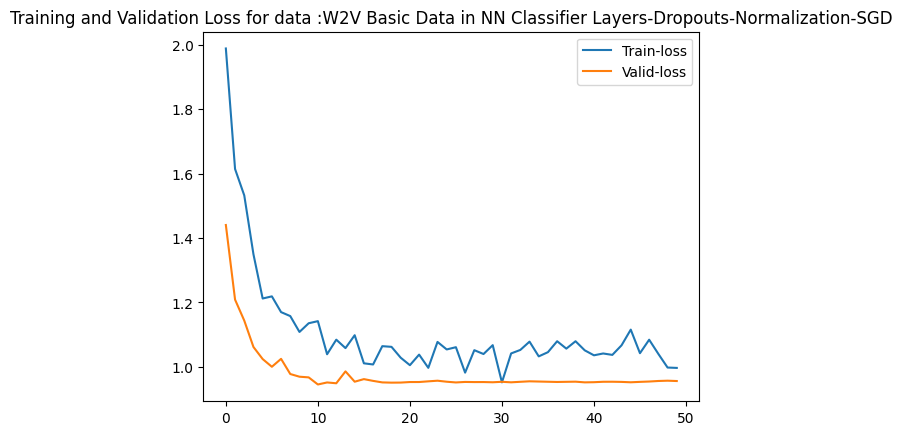

Train and Validation Accuracy


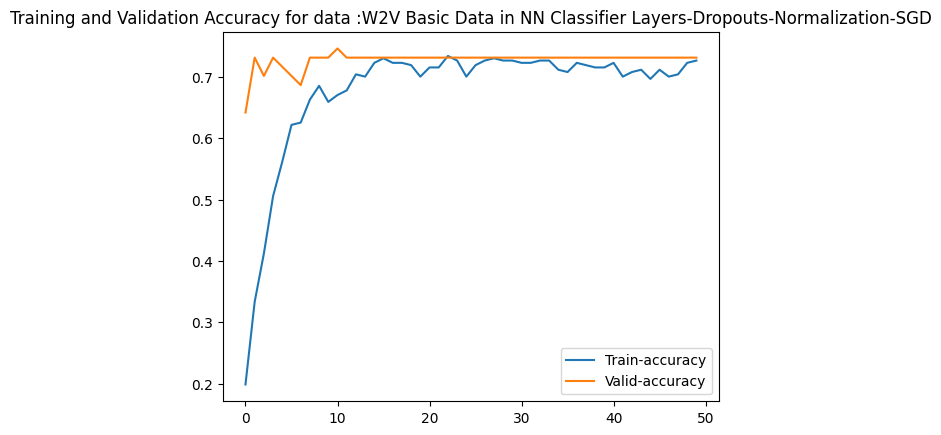

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Confusion Matrix


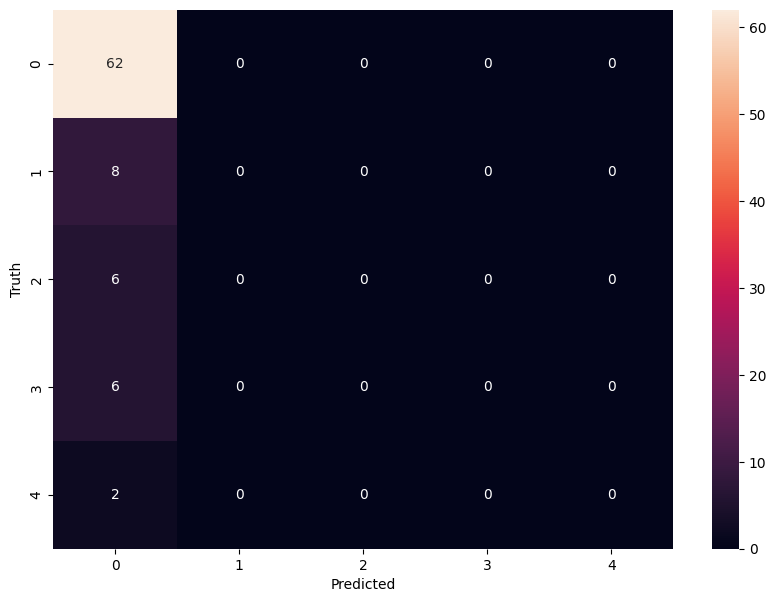

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :  Data Description                                Model Description  Train Accuracy  Test Accuracy  F1 Score
0   W2V Basic Data  NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81     62.69


Collating Results : 
-----------------------
   Data Description                                Model Description  Train Accuracy  Test Accuracy  F1 Score
0         W2V Basic                         Basic Model with 1 layer           78.44          

In [ ]:
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=model_fitted,historyNN=history,Accuracy='categorical_accuracy',ValidationAccuracy='val_categorical_accuracy',DataDesc=dataDesc,ModelDesc=modelDesc,X_train=X_train_w2v,Y_train=y_train_w2v_cat,X_test=X_test_w2v,Y_test=y_test_w2v_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

######  On Glove Dataset

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_13 (Dense)                     │ (None, 150)                 │          22,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 150)                 │             600 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 100)                 │          15,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 100)                 │             400 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 50)                  │             200 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 5)                   │             255 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,405 (173.46 KB)

 Trainable params: 43,805 (171.11 KB)

 Non-trainable params: 600 (2.34 KB)

Epoch 1/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - categorical_accuracy: 0.1909 - loss: 2.0333 - val_categorical_accuracy: 0.4627 - val_loss: 1.5163 - learning_rate: 0.0010
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.2504 - loss: 1.7948 - val_categorical_accuracy: 0.6418 - val_loss: 1.4046 - learning_rate: 0.0010
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - categorical_accuracy: 0.3514 - loss: 1.5916 - val_categorical_accuracy: 0.6866 - val_loss: 1.3445 - learning_rate: 0.0010
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.4380 - loss: 1.3624 - val_categorical_accuracy: 0.6866 - val_loss: 1.2683 - learning_rate: 0.0010
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.5118 - loss: 1.2923 - val_categorical_accuracy: 0.7015 - val_loss: 1.1722 - learning_rate: 0.0010
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.5629 - loss: 1.2740 - val_categorical_accuracy: 0.731

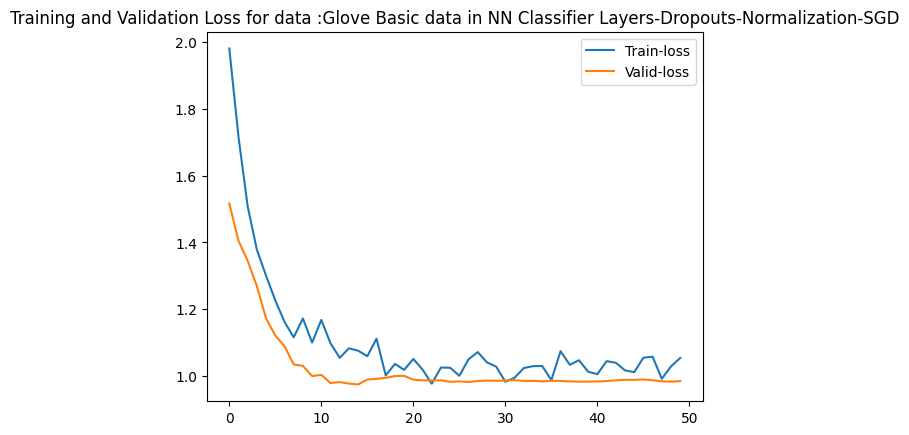

Train and Validation Accuracy


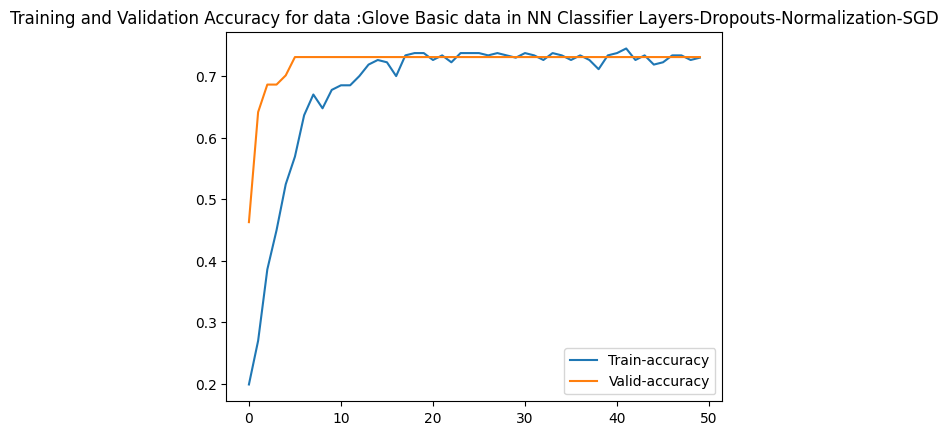

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Confusion Matrix


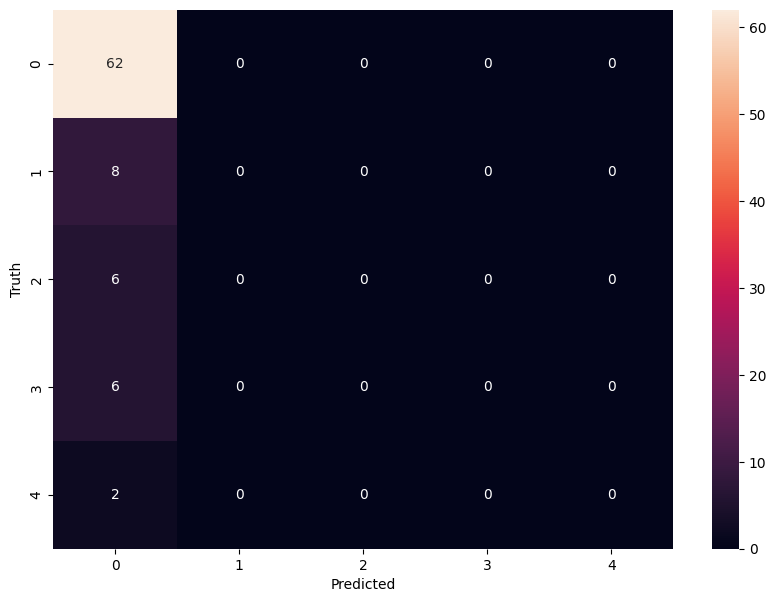

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :   Data Description                                Model Description  Train Accuracy  Test Accuracy  F1 Score
0  Glove Basic data  NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81     62.69


Collating Results : 
-----------------------
   Data Description                                Model Description  Train Accuracy  Test Accuracy  F1 Score
0         W2V Basic                         Basic Model with 1 layer           78.44        

In [ ]:
modelDesc = 'NN Classifier Layers-Dropouts-Normalization-SGD'
#Glove Basic
dataDesc = 'Glove Basic data'
model_fitted,history = modelNN_withDropoutsAndNormalization(X_train_glove,y_train_glove_cat)
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=model_fitted,historyNN=history,Accuracy='categorical_accuracy',ValidationAccuracy='val_categorical_accuracy',DataDesc=dataDesc,ModelDesc=modelDesc,X_train=X_train_glove,Y_train=y_train_glove_cat,X_test=X_test_glove,Y_test=y_test_glove_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')



###### On TFIDF Datas

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_17 (Dense)                     │ (None, 150)                 │         425,850 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 150)                 │             600 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 100)                 │          15,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 100)                 │             400 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 50)                  │             200 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 5)                   │             255 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 447,455 (1.71 MB)

 Trainable params: 446,855 (1.70 MB)

 Non-trainable params: 600 (2.34 KB)

Epoch 1/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - categorical_accuracy: 0.2172 - loss: 2.0094 - val_categorical_accuracy: 0.4925 - val_loss: 1.4435 - learning_rate: 0.0010
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - categorical_accuracy: 0.2398 - loss: 1.7997 - val_categorical_accuracy: 0.7015 - val_loss: 1.2823 - learning_rate: 0.0010
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - categorical_accuracy: 0.3373 - loss: 1.6923 - val_categorical_accuracy: 0.7313 - val_loss: 1.1436 - learning_rate: 0.0010
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - categorical_accuracy: 0.4669 - loss: 1.4553 - val_categorical_accuracy: 0.7313 - val_loss: 1.1325 - learning_rate: 0.0010
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - categorical_accuracy: 0.4581 - loss: 1.4263 - val_categorical_accuracy: 0.7313 - val_loss: 1.0347 - learning_rate: 0.0010
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - categorical_accuracy: 0.5662 - loss: 1.3056 - val_categorical_accuracy: 

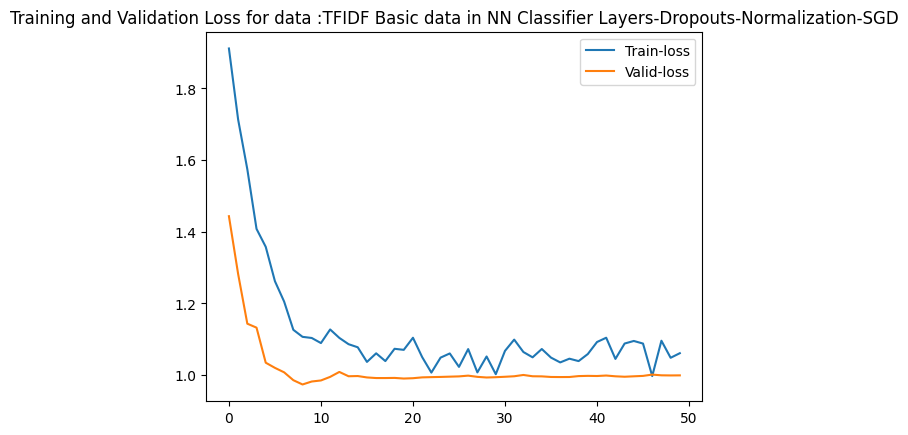

Train and Validation Accuracy


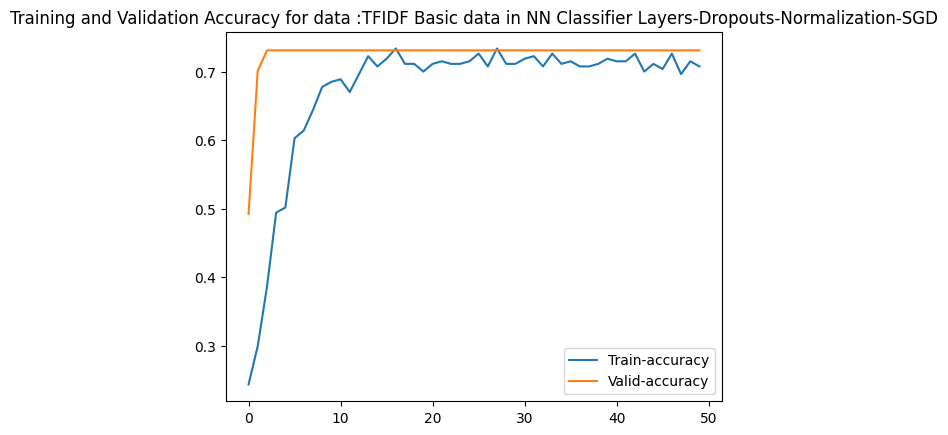

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step
Confusion Matrix


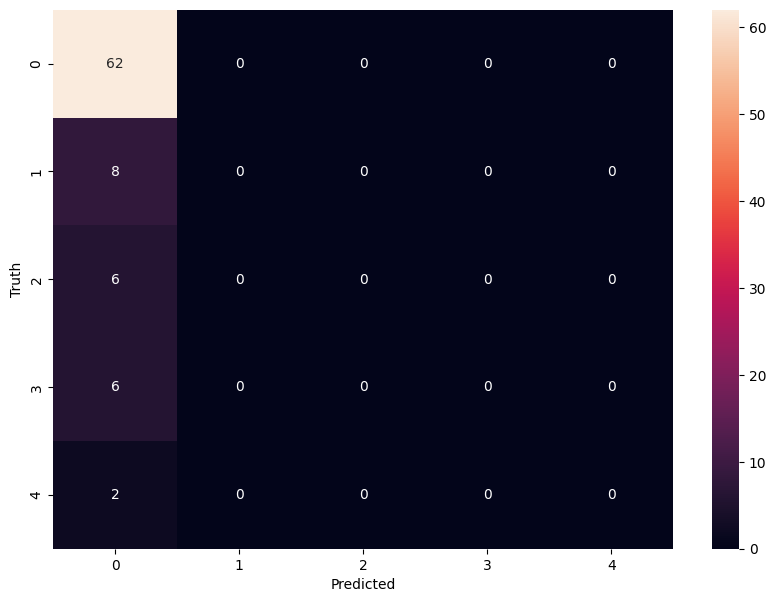

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :   Data Description                                Model Description  Train Accuracy  Test Accuracy  F1 Score
0  TFIDF Basic data  NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81     62.69


Collating Results : 
-----------------------
   Data Description                                Model Description  Train Accuracy  Test Accuracy  F1 Score
0         W2V Basic                         Basic Model with 1 layer           78.44        

In [ ]:
modelDesc = 'NN Classifier Layers-Dropouts-Normalization-SGD'
#TFIDF Basic Data
dataDesc = 'TFIDF Basic data'
model_fitted,history = modelNN_withDropoutsAndNormalization(X_train_tfidf,y_train_tfidf_cat)
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=model_fitted,historyNN=history,Accuracy='categorical_accuracy',ValidationAccuracy='val_categorical_accuracy',DataDesc=dataDesc,ModelDesc=modelDesc,X_train=X_train_tfidf,Y_train=y_train_tfidf_cat,X_test=X_test_tfidf,Y_test=y_test_tfidf_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')



##### Model With Layers, Droputs and Normalization - Adam

In [ ]:
def modelNN_withDropoutsAndNormalization_Adam(X_train,Y_train):
    param = 1e-4

    # define the model
    model = Sequential()

    model.add(Dense(150, input_dim=X_train.shape[1], activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(param),
                    kernel_constraint=unit_norm()))
    model.add(Dropout(0.2))
    model.add(BatchNormalization())
    model.add(Dense(100, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(param),
                    kernel_constraint=unit_norm()))
    model.add(Dropout(0.5))
    model.add(BatchNormalization())
    model.add(Dense(50, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(param),
                    kernel_constraint=unit_norm()))
    model.add(Dropout(0.5))
    model.add(BatchNormalization())
    model.add(Dense(5, activation='softmax', kernel_regularizer=l2(param),
                    kernel_constraint=unit_norm()))
    model.summary()

    model.compile(loss='categorical_crossentropy', optimizer=optimizers.Adam(learning_rate=1e-3), metrics=['categorical_accuracy'])
    # Use earlystopping
    callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=7, min_delta=1E-3)
    rlrp = ReduceLROnPlateau(monitor='val_loss', factor=0.0001, patience=5, min_delta=1E-4)

    # fit the keras model on the dataset
    history = model.fit(X_train, Y_train, epochs=50, batch_size=8, verbose=1,validation_split=0.2, callbacks=[rlrp])

    return model,history

###### Model with layers,dropout and normalization (Adam optimizer) on W2V, Glove and TFIDF Basic Data

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                     │ (None, 150)                 │          22,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 150)                 │             600 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 100)                 │          15,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 100)                 │             400 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 50)                  │             200 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 5)                   │             255 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,405 (173.46 KB)

 Trainable params: 43,805 (171.11 KB)

 Non-trainable params: 600 (2.34 KB)

Epoch 1/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - categorical_accuracy: 0.2067 - loss: 2.0296 - val_categorical_accuracy: 0.6716 - val_loss: 1.4958 - learning_rate: 0.0010
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - categorical_accuracy: 0.2379 - loss: 1.8325 - val_categorical_accuracy: 0.7313 - val_loss: 1.3602 - learning_rate: 0.0010
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - categorical_accuracy: 0.3123 - loss: 1.7151 - val_categorical_accuracy: 0.7313 - val_loss: 1.2443 - learning_rate: 0.0010
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - categorical_accuracy: 0.3853 - loss: 1.5867 - val_categorical_accuracy: 0.7313 - val_loss: 1.1708 - learning_rate: 0.0010
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - categorical_accuracy: 0.4512 - loss: 1.4179 - val_categorical_accuracy: 0.7313 - val_loss: 1.1170 - learning_rate: 0.0010
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - categorical_accuracy: 0.4778 - loss: 1.4202 - val_categorical_accuracy: 

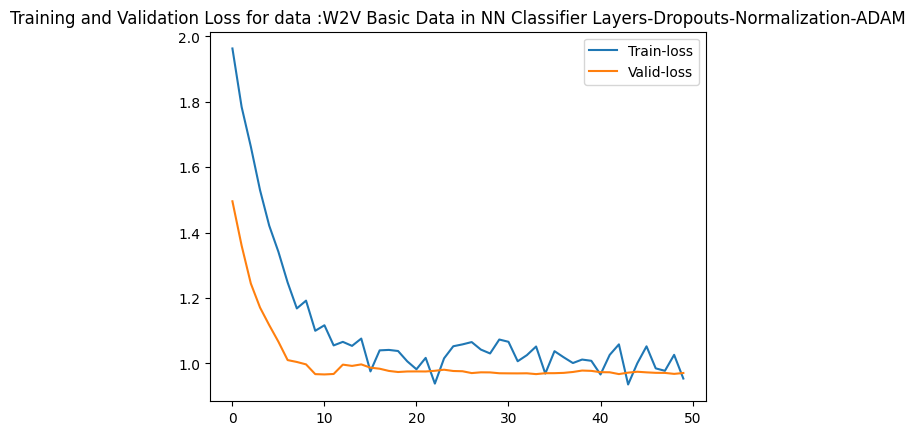

Train and Validation Accuracy


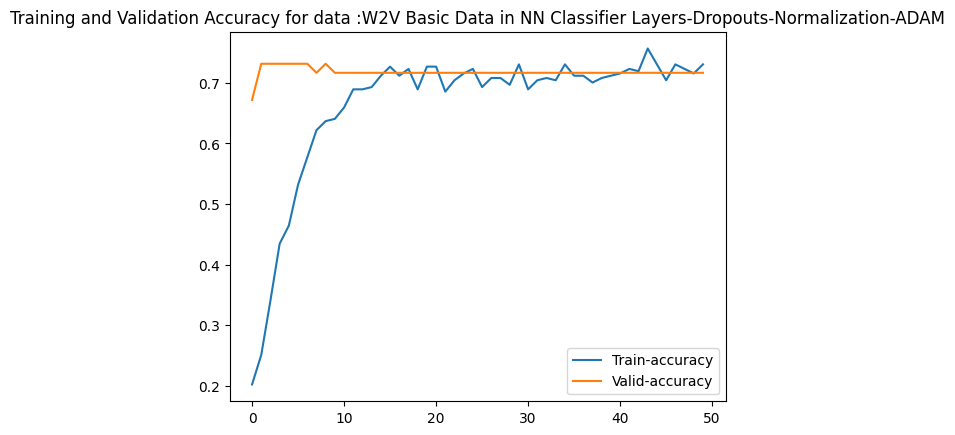

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Confusion Matrix


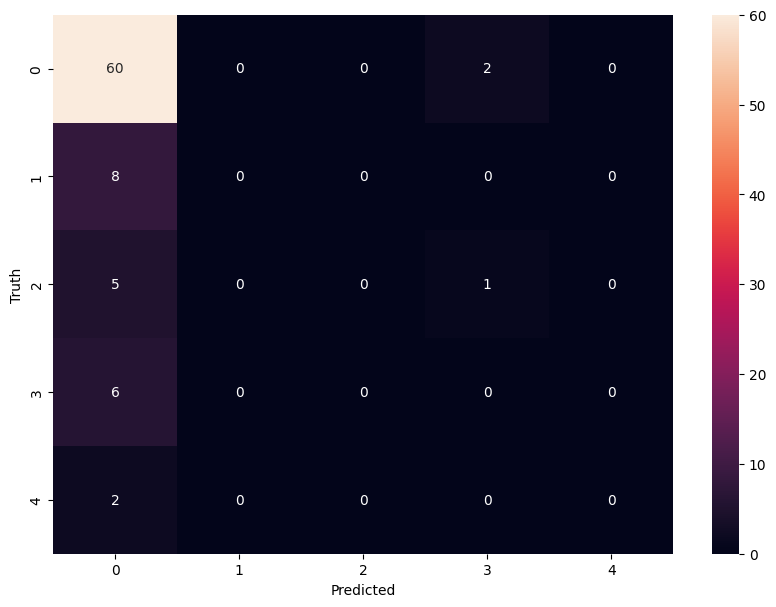

              precision    recall  f1-score   support

           0       0.74      0.97      0.84        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.71        84
   macro avg       0.15      0.19      0.17        84
weighted avg       0.55      0.71      0.62        84

Result Summary 
 --------------------- 
 :  Data Description                                 Model Description  Train Accuracy  Test Accuracy  F1 Score
0   W2V Basic Data  NN Classifier Layers-Dropouts-Normalization-ADAM           73.95          71.43     61.94




In [ ]:
#W2v Basic
modelDesc = 'NN Classifier Layers-Dropouts-Normalization-ADAM'
dataDesc = 'W2V Basic Data'
model_lifted,history = modelNN_withDropoutsAndNormalization_Adam(X_train_w2v,y_train_w2v_cat)
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=model_lifted,historyNN=history,Accuracy='categorical_accuracy',ValidationAccuracy='val_categorical_accuracy',DataDesc=dataDesc,ModelDesc=modelDesc,X_train=X_train_w2v,Y_train=y_train_w2v_cat,X_test=X_test_w2v,Y_test=y_test_w2v_cat)],ignore_index=False,sort=False)



Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_25 (Dense)                     │ (None, 150)                 │          22,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 150)                 │             600 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 100)                 │          15,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 100)                 │             400 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 50)                  │             200 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 5)                   │             255 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,405 (173.46 KB)

 Trainable params: 43,805 (171.11 KB)

 Non-trainable params: 600 (2.34 KB)

Epoch 1/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - categorical_accuracy: 0.2111 - loss: 1.9025 - val_categorical_accuracy: 0.6716 - val_loss: 1.5032 - learning_rate: 0.0010
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - categorical_accuracy: 0.2062 - loss: 1.7690 - val_categorical_accuracy: 0.6567 - val_loss: 1.4370 - learning_rate: 0.0010
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - categorical_accuracy: 0.3204 - loss: 1.6699 - val_categorical_accuracy: 0.7164 - val_loss: 1.3980 - learning_rate: 0.0010
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - categorical_accuracy: 0.3601 - loss: 1.5007 - val_categorical_accuracy: 0.7015 - val_loss: 1.3459 - learning_rate: 0.0010
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - categorical_accuracy: 0.4561 - loss: 1.4503 - val_categorical_accuracy: 0.7015 - val_loss: 1.2862 - learning_rate: 0.0010
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - categorical_accuracy: 0.4757 - loss: 1.4613 - val_categorical_accuracy: 0.731

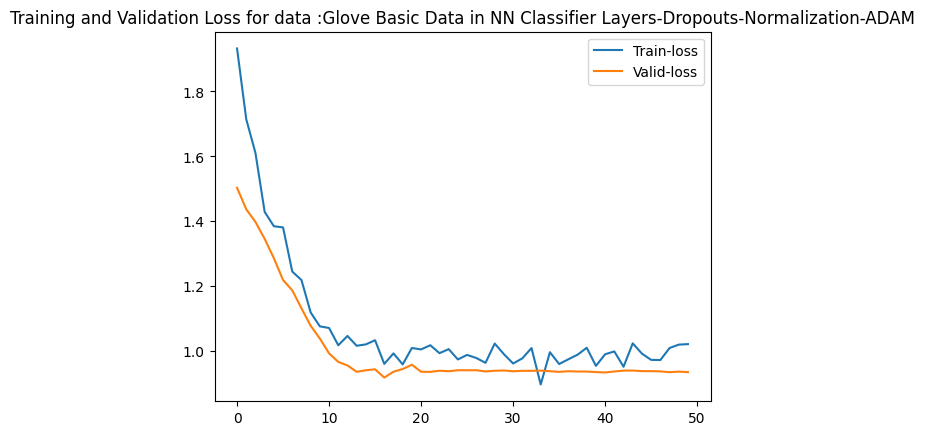

Train and Validation Accuracy


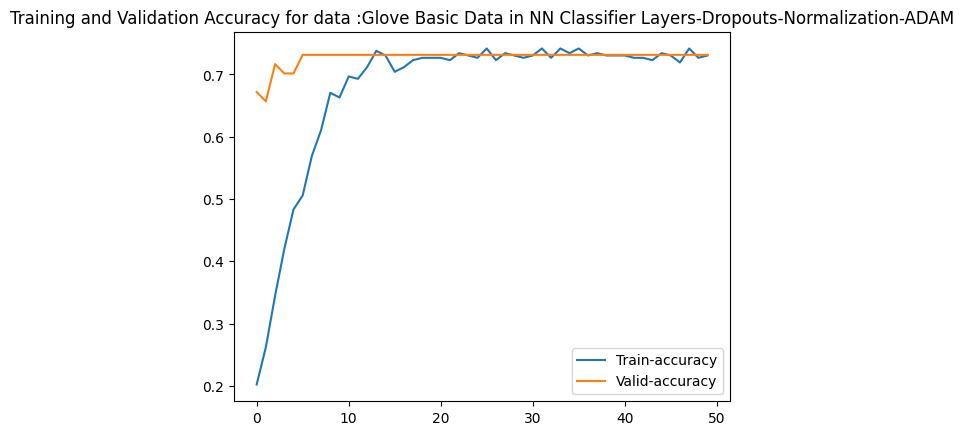

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
Confusion Matrix


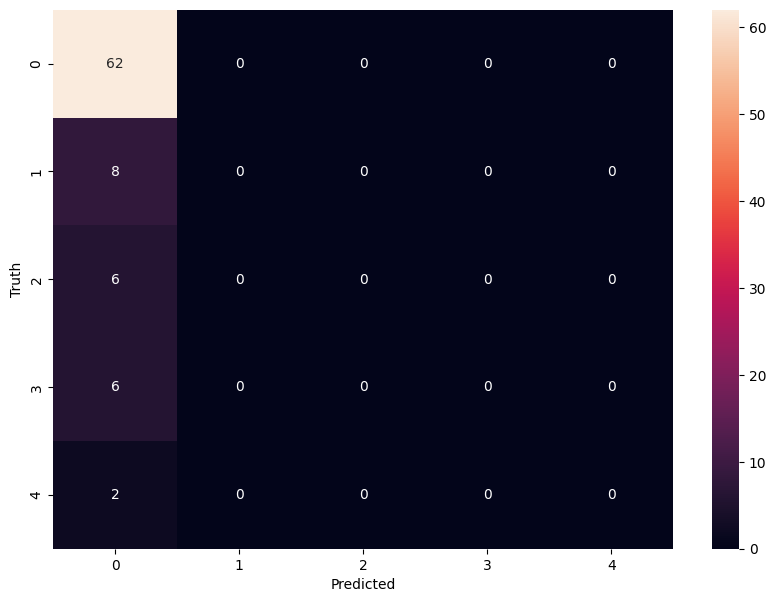

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :   Data Description                                 Model Description  Train Accuracy  Test Accuracy  F1 Score
0  Glove Basic Data  NN Classifier Layers-Dropouts-Normalization-ADAM           74.25          73.81     62.69




In [ ]:
#Glove Basic
modelDesc = 'NN Classifier Layers-Dropouts-Normalization-ADAM'
dataDesc = 'Glove Basic Data'
model_fitted,history = modelNN_withDropoutsAndNormalization_Adam(X_train_glove,y_train_glove_cat)
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=model_fitted,historyNN=history,Accuracy='categorical_accuracy',ValidationAccuracy='val_categorical_accuracy',DataDesc=dataDesc,ModelDesc=modelDesc,X_train=X_train_glove,Y_train=y_train_glove_cat,X_test=X_test_glove,Y_test=y_test_glove_cat)],ignore_index=False,sort=False)

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_29 (Dense)                     │ (None, 150)                 │         425,850 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 150)                 │             600 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 100)                 │          15,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 100)                 │             400 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 50)                  │             200 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 5)                   │             255 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 447,455 (1.71 MB)

 Trainable params: 446,855 (1.70 MB)

 Non-trainable params: 600 (2.34 KB)

Epoch 1/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - categorical_accuracy: 0.1670 - loss: 2.0218 - val_categorical_accuracy: 0.6866 - val_loss: 1.5503 - learning_rate: 0.0010
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - categorical_accuracy: 0.2315 - loss: 1.7950 - val_categorical_accuracy: 0.7313 - val_loss: 1.4295 - learning_rate: 0.0010
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - categorical_accuracy: 0.3106 - loss: 1.6298 - val_categorical_accuracy: 0.7313 - val_loss: 1.3265 - learning_rate: 0.0010
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - categorical_accuracy: 0.3725 - loss: 1.4466 - val_categorical_accuracy: 0.7313 - val_loss: 1.2538 - learning_rate: 0.0010
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - categorical_accuracy: 0.4462 - loss: 1.4082 - val_categorical_accuracy: 0.7313 - val_loss: 1.1735 - learning_rate: 0.0010
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - categorical_accuracy: 0.5558 - loss: 1.3027 - val_categorical_accuracy: 

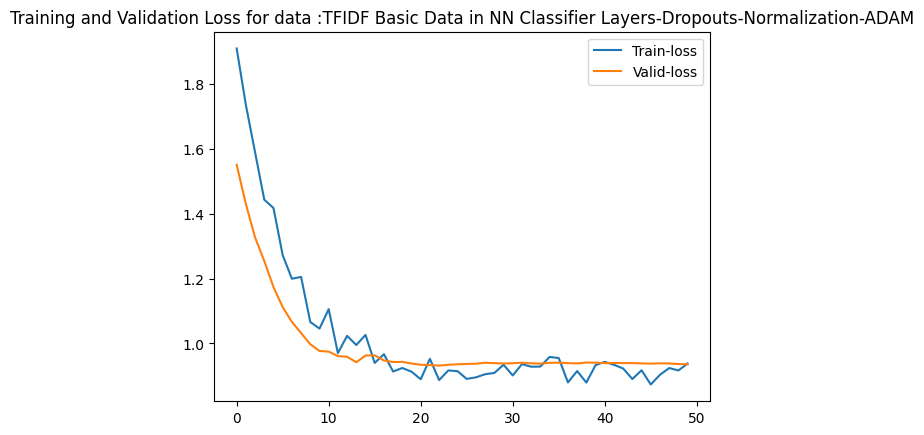

Train and Validation Accuracy


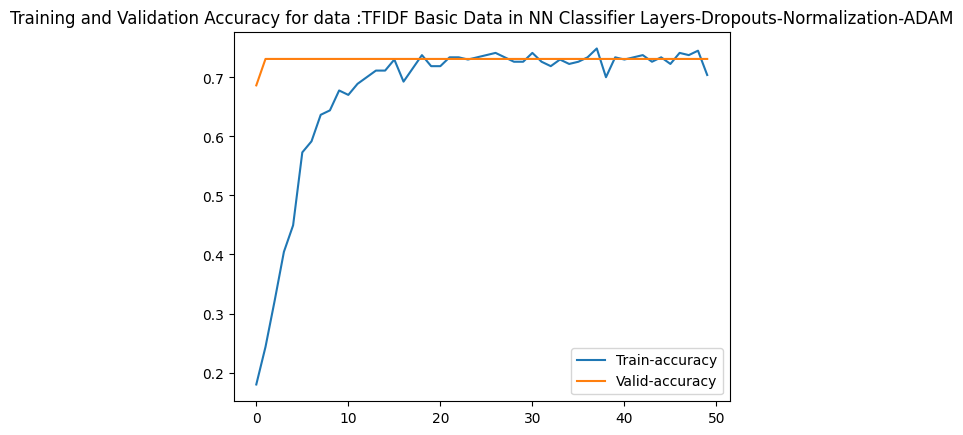

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Confusion Matrix


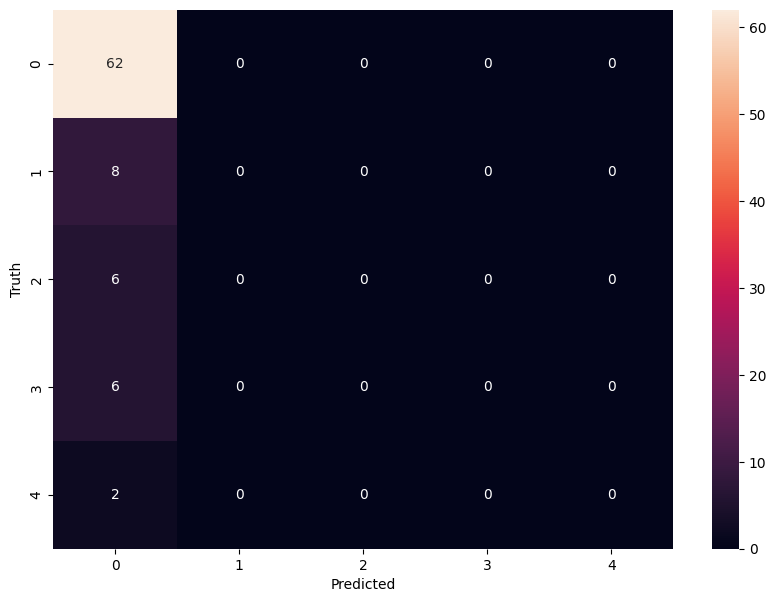

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :   Data Description                                 Model Description  Train Accuracy  Test Accuracy  F1 Score
0  TFIDF Basic Data  NN Classifier Layers-Dropouts-Normalization-ADAM           74.55          73.81     62.69




In [ ]:
#TFIDF Basic
modelDesc = 'NN Classifier Layers-Dropouts-Normalization-ADAM'
dataDesc = 'TFIDF Basic Data'
model_fitted,history = modelNN_withDropoutsAndNormalization_Adam(X_train_tfidf,y_train_tfidf_cat)
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=model_fitted,historyNN=history,Accuracy='categorical_accuracy',ValidationAccuracy='val_categorical_accuracy',DataDesc=dataDesc,ModelDesc=modelDesc,X_train=X_train_tfidf,Y_train=y_train_tfidf_cat,X_test=X_test_tfidf,Y_test=y_test_tfidf_cat)],ignore_index=False,sort=False)

##### Print Results observed so far

In [ ]:
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

Collating Results : 
-----------------------
   Data Description                                 Model Description  Train Accuracy  Test Accuracy  F1 Score
0         W2V Basic                          Basic Model with 1 layer           78.44          75.00     65.16
0  Glove Basic Data                          Basic Model with 1 layer           91.02          73.81     69.07
0  TFIDF Basic Data                          Basic Model with 1 layer           94.01          70.24     61.33
0    W2V Basic Data   NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81     62.69
0  Glove Basic data   NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81     62.69
0  TFIDF Basic data   NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81     62.69
0    W2V Basic Data  NN Classifier Layers-Dropouts-Normalization-ADAM           73.95          71.43     61.94
0  Glove Basic Data  NN Classifier Layers-Dropouts-Normalization-AD

##### Hyper parameter on ANN

In [ ]:
# Define the model building function for hyperparameter tuning
def build_model(hp, input_shape):
    model_ann_hyper = Sequential()

    units = hp.Int('units', min_value=10, max_value=100, step=10)
    dropout_rate1 = hp.Float('dropout_rate1', min_value=0.1, max_value=0.5, step=0.1)
    dropout_rate2 = hp.Float('dropout_rate2', min_value=0.1, max_value=0.5, step=0.1)
    l2_param = hp.Float('l2_param', min_value=1e-5, max_value=1e-2, sampling='LOG')
    learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-1, sampling='LOG')

    model_ann_hyper.add(Dense(units, input_shape=(input_shape,), activation='relu', kernel_initializer='he_uniform',
                    kernel_regularizer=regularizers.l2(l2_param),
                    kernel_constraint=tf.keras.constraints.UnitNorm()))
    model_ann_hyper.add(Dropout(dropout_rate1))
    model_ann_hyper.add(BatchNormalization())
    model_ann_hyper.add(Dense(units, activation='relu', kernel_initializer='he_uniform',
                    kernel_regularizer=regularizers.l2(l2_param),
                    kernel_constraint=tf.keras.constraints.UnitNorm()))
    model_ann_hyper.add(Dropout(dropout_rate2))
    model_ann_hyper.add(BatchNormalization())
    model_ann_hyper.add(Dense(5, activation='softmax', kernel_regularizer=regularizers.l2(l2_param),
                    kernel_constraint=tf.keras.constraints.UnitNorm()))  # Multiclass classification

    # Compile the model
    opt = SGD(learning_rate=learning_rate, momentum=0.9)
    model_ann_hyper.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

    return model_ann_hyper

In [ ]:
# Define the hyperparameter tuning function
def tune_hyperparameters(X_train, y_train, X_test, y_test):
    input_shape = X_train.shape[1]

    tuner = kt.RandomSearch(
        hypermodel=lambda hp: build_model(hp, input_shape),
        objective='val_accuracy',
        max_trials=20,  # Number of different hyperparameter combinations to try
        executions_per_trial=1,
        directory='my_dir',
        project_name='hyperparameter_tuning'
    )

    tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test))

    # Print the best hyperparameters
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
    print(f'Best hyperparameters: {best_hps.values}')

    # Retrieve the best model and training history
    #best_model = tuner.get_best_models(num_models=1)[0]
    best_model_ann = tuner.hypermodel.build(best_hps)
    best_model_ann.build(input_shape=(None, X_train.shape[1]))
    history_best_ann = best_model_ann.fit(
        X_train, y_train,
        epochs=50,
        batch_size=8,
        validation_data=(X_test, y_test),
        verbose=1
    )

    return best_model_ann, history_best_ann

In [ ]:
def train_and_evaluate_model(X_train, y_train, X_test, y_test, descriptionOfData, seed=7):
    # Set random seeds for reproducibility
    np.random.seed(seed)
    tf.random.set_seed(seed)

    # Perform hyperparameter tuning
    best_model_ann, history_best_ann = tune_hyperparameters(X_train, y_train, X_test, y_test)

    # Evaluate the model
    _, train_accuracy = best_model_ann.evaluate(X_train, y_train, batch_size=8, verbose=0)
    _, test_accuracy = best_model_ann.evaluate(X_test, y_test, batch_size=8, verbose=0)

    print(f"\nTraining completed for dataset: {descriptionOfData}")
    print(f'Train accuracy: {train_accuracy * 100:.2f}%')
    print(f'Test accuracy: {test_accuracy * 100:.2f}%')

    return best_model_ann, history_best_ann

###### W2V

In [ ]:
best_model_w2v, best_history_w2v = train_and_evaluate_model(X_train_w2v, y_train_w2v_cat, X_test_w2v, y_test_w2v_cat, "Word2Vec-Basic- with best params")

Trial 20 Complete [00h 00m 11s]
val_accuracy: 0.380952388048172

Best val_accuracy So Far: 0.738095223903656
Total elapsed time: 00h 03m 50s
Best hyperparameters: {'units': 20, 'dropout_rate1': 0.4, 'dropout_rate2': 0.4, 'l2_param': 4.2036040689040396e-05, 'learning_rate': 0.0024348956814965283}
Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.2846 - loss: 1.8107 - val_accuracy: 0.4881 - val_loss: 1.3329
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5716 - loss: 1.2498 - val_accuracy: 0.7024 - val_loss: 1.0393
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6469 - loss: 1.1585 - val_accuracy: 0.6071 - val_loss: 1.1894
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6882 - loss: 1.0881 - val_accuracy: 0.7024 - val_loss: 1.0447
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6813 - loss: 1.1359 - val_accuracy: 0.7262 - val_loss: 0.9845
Epoch 6/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6958 - l

Train and Validation Loss


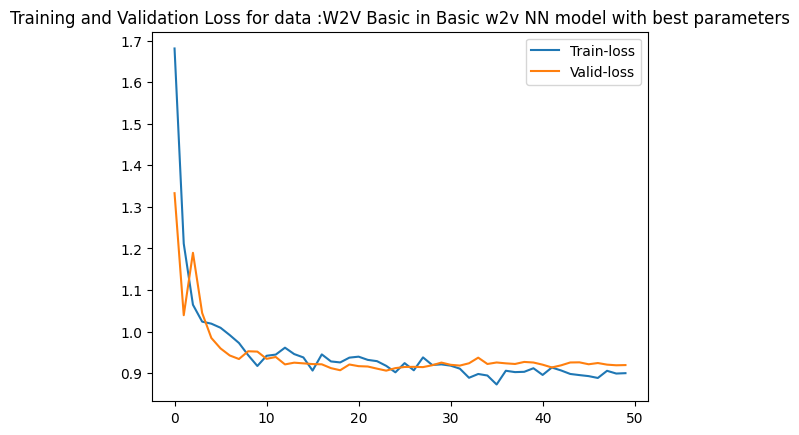

Train and Validation Accuracy


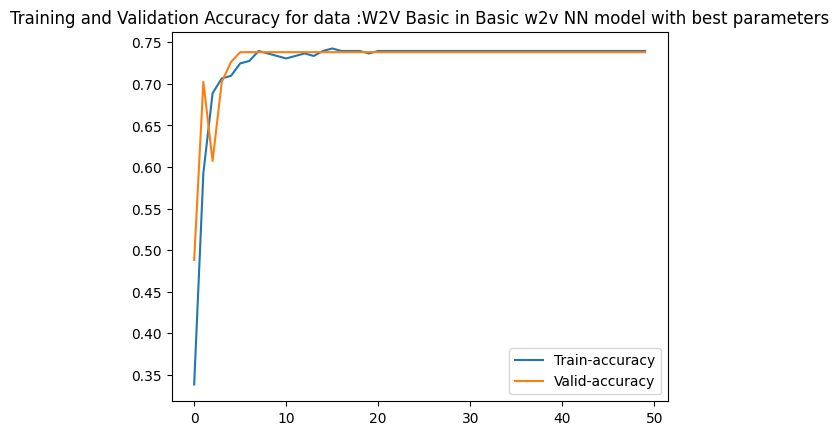

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Confusion Matrix


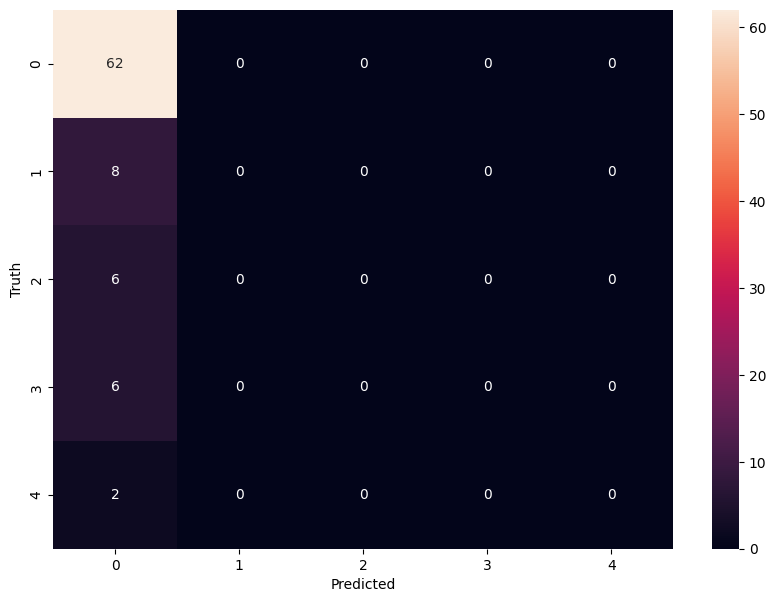

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :  Data Description                        Model Description  Train Accuracy  Test Accuracy  F1 Score
0        W2V Basic  Basic w2v NN model with best parameters           73.95          73.81     62.69


Collating Results : 
-----------------------
   Data Description                                 Model Description  Train Accuracy  Test Accuracy  F1 Score
0         W2V Basic                          Basic Model with 1 layer           78.44          75.00     65.1

In [ ]:
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=best_model_w2v,historyNN=best_history_w2v,Accuracy='accuracy',ValidationAccuracy='val_accuracy',
                         DataDesc='W2V Basic',ModelDesc='Basic w2v NN model with best parameters',
                         X_train=X_train_w2v,Y_train=y_train_w2v_cat,X_test=X_test_w2v,Y_test=y_test_w2v_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

###### TFIDF

In [ ]:
best_model_tfidf, best_history_tfidf = train_and_evaluate_model(X_train_tfidf, y_train_tfidf_cat, X_test_tfidf, y_test_tfidf_cat, "Basic TFIDF model with best params")

Reloading Tuner from my_dir/hyperparameter_tuning/tuner0.json
Best hyperparameters: {'units': 20, 'dropout_rate1': 0.4, 'dropout_rate2': 0.30000000000000004, 'l2_param': 4.815571534978457e-05, 'learning_rate': 0.0033279189463431497}
Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.2686 - loss: 1.8562 - val_accuracy: 0.6429 - val_loss: 1.2004
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5496 - loss: 1.3043 - val_accuracy: 0.7381 - val_loss: 0.9445
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6883 - loss: 1.0997 - val_accuracy: 0.7381 - val_loss: 0.9355
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7018 - loss: 1.0819 - val_accuracy: 0.7381 - val_loss: 0.9360
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7117 - loss: 1.0185 - val_accuracy: 0.7381 - val_loss: 0.9283
Epoch 6/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7178 - loss: 1.0278 - val_accuracy: 0.7381 - val_loss: 0.9309
Epoch 7/50

Train and Validation Loss


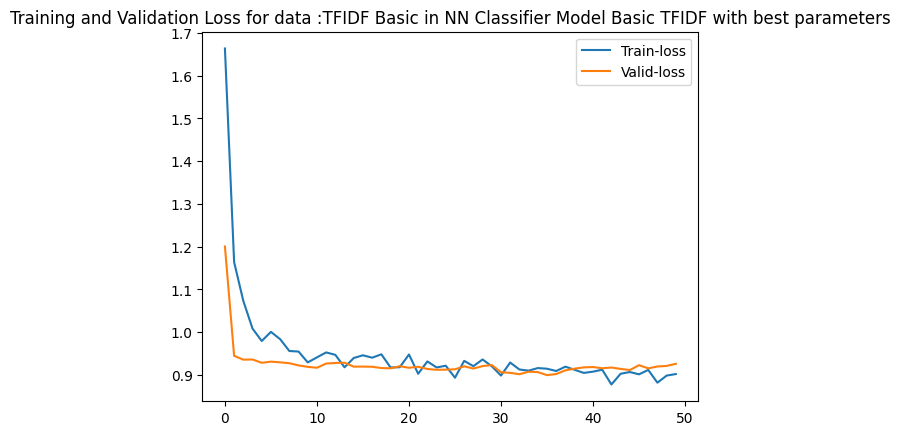

Train and Validation Accuracy


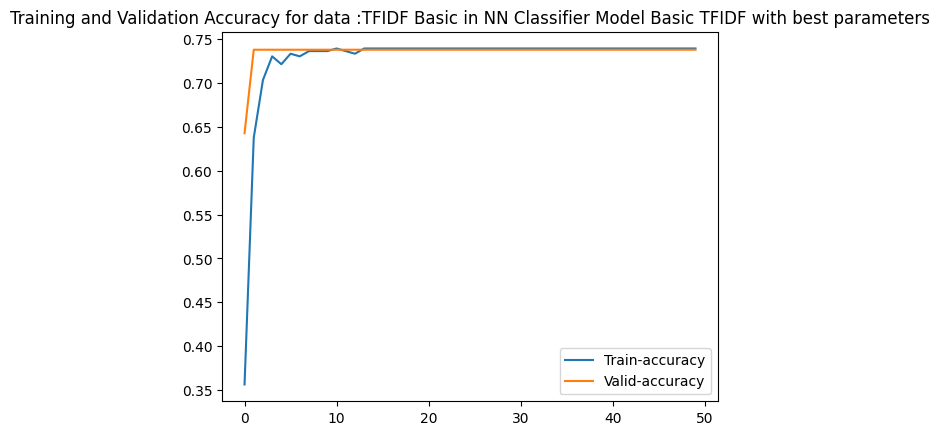

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Confusion Matrix


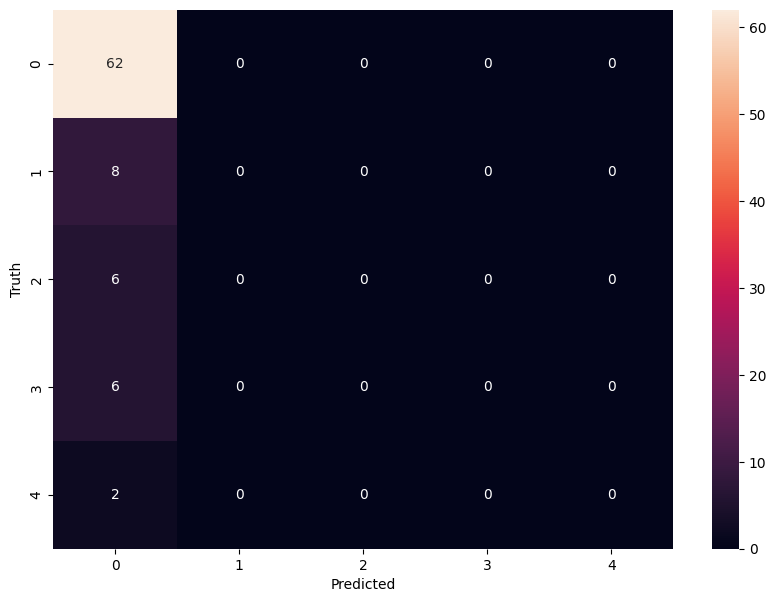

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :  Data Description                                  Model Description  Train Accuracy  Test Accuracy  F1 Score
0      TFIDF Basic  NN Classifier Model Basic TFIDF with best para...           73.95          73.81     62.69


Collating Results : 
-----------------------
   Data Description                                  Model Description  Train Accuracy  Test Accuracy  F1 Score
0         W2V Basic                           Basic Model with 1 layer           78.44  

In [ ]:
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=best_model_tfidf, historyNN=best_history_tfidf,Accuracy='accuracy',ValidationAccuracy='val_accuracy',
                         DataDesc='TFIDF Basic',ModelDesc='NN Classifier Model Basic TFIDF with best parameters',
                         X_train=X_train_tfidf,Y_train=y_train_tfidf_cat,X_test=X_test_tfidf,Y_test=y_test_tfidf_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

#### RNN

###### RNN (no hyperparameterization)

In [ ]:
def build_model_rnn(input_shape):
    model_rnn = Sequential()

    # hyperparameters
    rnn_units = 151
    dropout_rate1 = 0.3
    dropout_rate2 = 0.4
    l2_param = 1e-4
    learning_rate = 0.01

    model_rnn.add(SimpleRNN(rnn_units, input_shape=input_shape, return_sequences=True,
                        kernel_initializer='he_uniform',
                        kernel_regularizer=regularizers.l2(l2_param),
                        kernel_constraint=tf.keras.constraints.UnitNorm()))
    model_rnn.add(Dropout(dropout_rate1))
    model_rnn.add(BatchNormalization())

    model_rnn.add(SimpleRNN(rnn_units, return_sequences=False,
                        kernel_initializer='he_uniform',
                        kernel_regularizer=regularizers.l2(l2_param),
                        kernel_constraint=tf.keras.constraints.UnitNorm()))
    model_rnn.add(Dropout(dropout_rate2))
    model_rnn.add(BatchNormalization())

    model_rnn.add(Dense(5, activation='softmax', kernel_regularizer=regularizers.l2(l2_param),
                    kernel_constraint=tf.keras.constraints.UnitNorm()))  # Multiclass classification

    # Compile the model
    opt = SGD(learning_rate=learning_rate, momentum=0.9)
    model_rnn.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

    return model_rnn

In [ ]:
def train_and_evaluate_model_rnn(X_train, y_train, X_test, y_test, descriptionOfData, seed=7):
    # Set random seeds for reproducibility
    np.random.seed(seed)
    tf.random.set_seed(seed)

    if len(X_train.shape) == 2:
        X_train = np.expand_dims(X_train, axis=1)  # Adding time steps dimension
        X_test = np.expand_dims(X_test, axis=1)    # Adding time steps dimension

    # Build the model with fixed parameters
    input_shape = (X_train.shape[1], X_train.shape[2])  # (timesteps, features)
    model_rnn = build_model_rnn(input_shape)

    # Train the model
    history_rnn = model_rnn.fit(
        X_train, y_train,
        epochs=50,
        batch_size=8,
        validation_data=(X_test, y_test),
        verbose=1
    )

    return model_rnn, history_rnn

In [ ]:
X_train_w2v.shape[0]

334

###### W2V






In [ ]:
best_model_w2v_rnn, best_history_w2v_rnn = train_and_evaluate_model_rnn(X_train_w2v, y_train_w2v_cat, X_test_w2v, y_test_w2v_cat, "RNN Model on Word2Vec")

Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.3427 - loss: 1.8175 - val_accuracy: 0.7381 - val_loss: 1.1011
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6340 - loss: 1.1896 - val_accuracy: 0.7381 - val_loss: 1.2502
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6311 - loss: 1.3178 - val_accuracy: 0.7381 - val_loss: 1.1766
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6392 - loss: 1.2975 - val_accuracy: 0.7381 - val_loss: 1.1855
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6482 - loss: 1.2564 - val_accuracy: 0.7381 - val_loss: 1.1565
Epoch 6/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6924 - loss: 1.1248 - val_accuracy: 0.7381 - val_loss: 1.1277
Epoch 7/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6661 - loss: 1.1888 - val_accuracy: 0.7381 - val_loss: 1.1460
Epoch 8/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6757 - loss: 1.2504 - val_accuracy: 0.7381 - val_

Train and Validation Loss


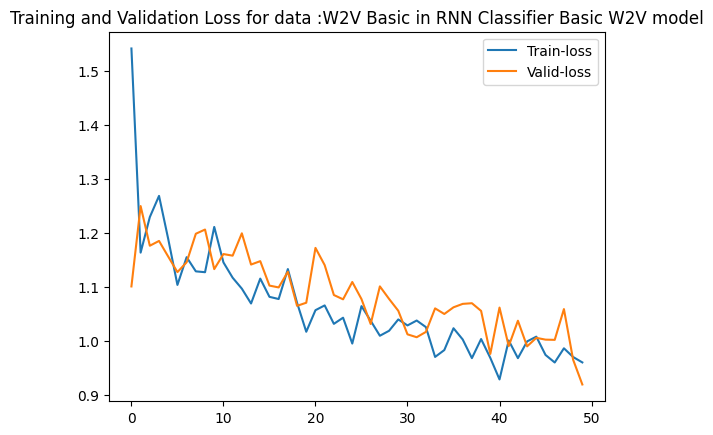

Train and Validation Accuracy


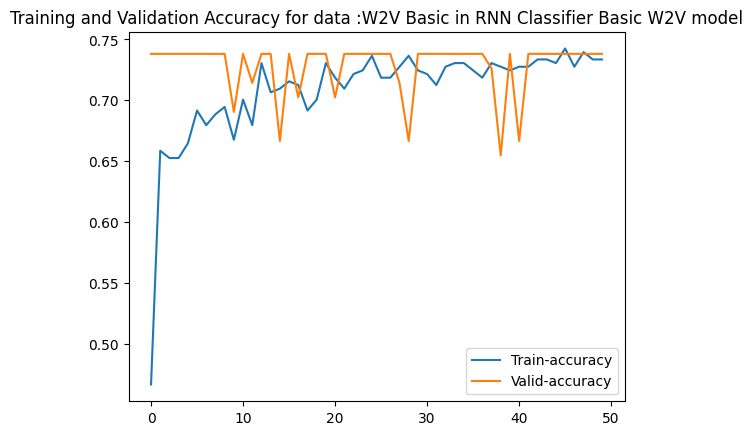

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step
Confusion Matrix


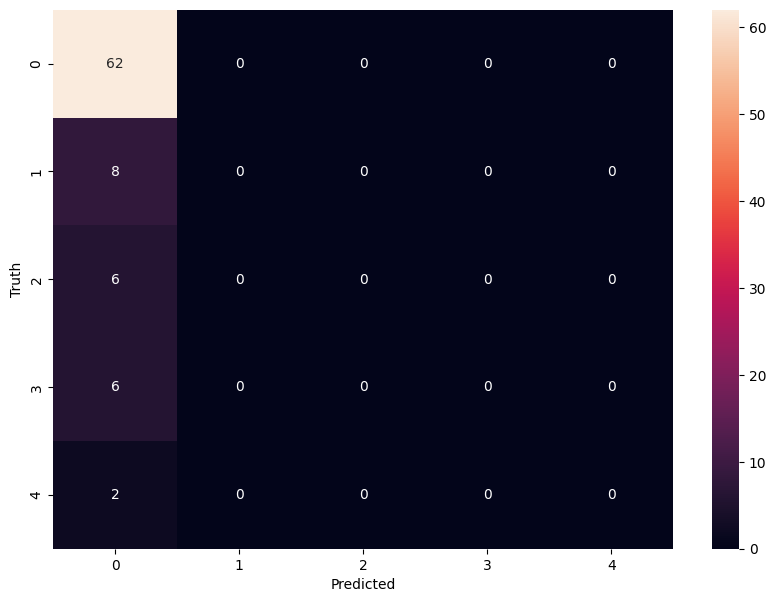

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :  Data Description               Model Description  Train Accuracy  Test Accuracy  F1 Score
0        W2V Basic  RNN Classifier Basic W2V model           73.95          73.81     62.69




In [ ]:
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=best_model_w2v_rnn, historyNN=best_history_w2v_rnn,Accuracy='accuracy',ValidationAccuracy='val_accuracy',
                         DataDesc='W2V Basic',ModelDesc='RNN Classifier Basic W2V model',
                         X_train=np.expand_dims(X_train_w2v, axis=1),Y_train=y_train_w2v_cat,X_test=np.expand_dims(X_test_w2v, axis=1),Y_test=y_test_w2v_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1000)
#print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

###### TFIDF

In [ ]:
best_model_tfidf_rnn, best_history_tfidf_rnn = train_and_evaluate_model_rnn(X_train_tfidf, y_train_tfidf_cat, X_test_tfidf, y_test_tfidf_cat, "RNN Classifier with Basic TFIDF ")

Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.2709 - loss: 1.8196 - val_accuracy: 0.7381 - val_loss: 1.1996
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6089 - loss: 1.2875 - val_accuracy: 0.7381 - val_loss: 1.1543
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6484 - loss: 1.2782 - val_accuracy: 0.7381 - val_loss: 1.1461
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6560 - loss: 1.2436 - val_accuracy: 0.7381 - val_loss: 1.1155
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6727 - loss: 1.1882 - val_accuracy: 0.7381 - val_loss: 1.1297
Epoch 6/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6974 - loss: 1.1857 - val_accuracy: 0.7262 - val_loss: 1.2564
Epoch 7/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.6806 - loss: 1.2141 - val_accuracy: 0.7381 - val_loss: 1.1449
Epoch 8/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6604 - loss: 1.2076 - val_accuracy: 0.7024 - v

Train and Validation Loss


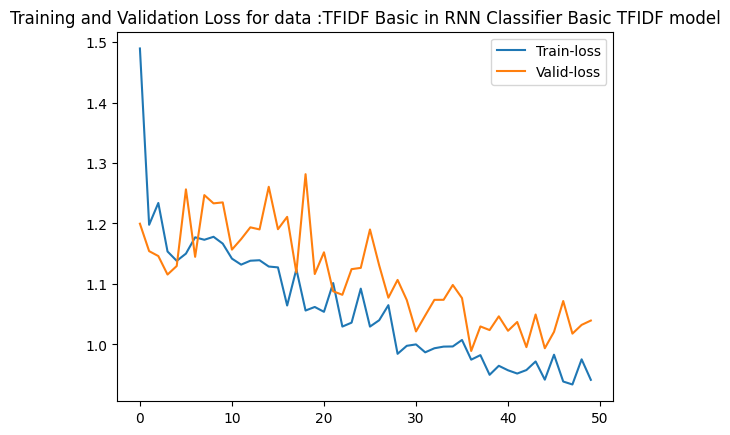

Train and Validation Accuracy


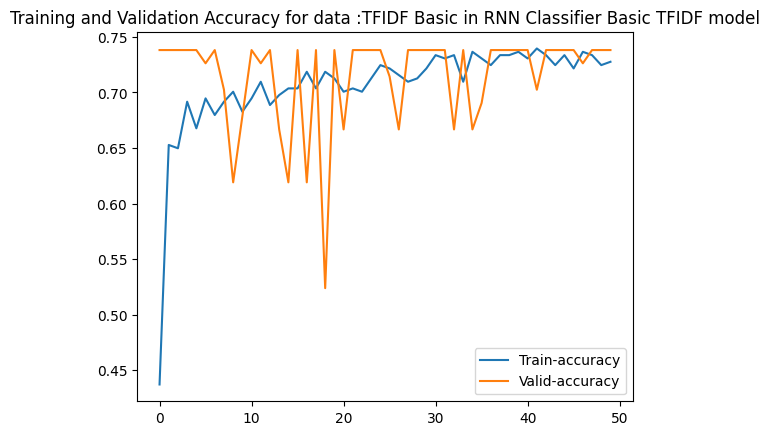

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step
Confusion Matrix


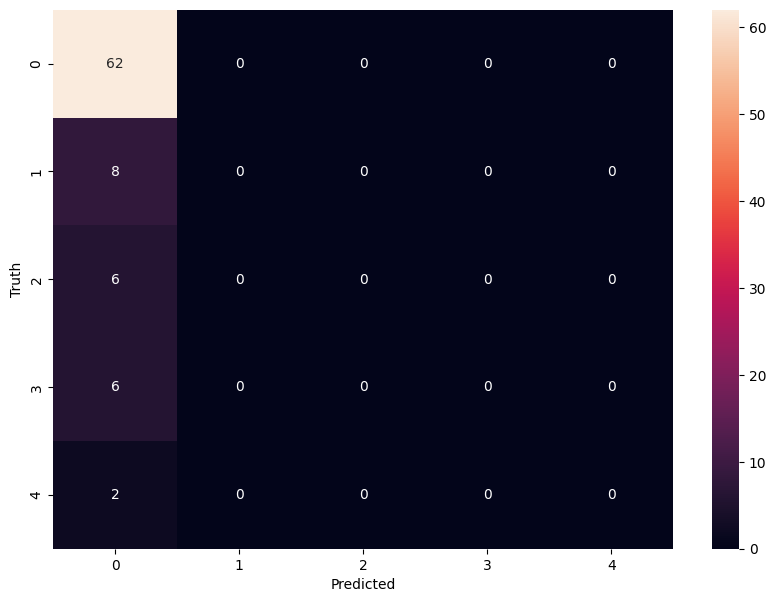

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :  Data Description                 Model Description  Train Accuracy  Test Accuracy  F1 Score
0      TFIDF Basic  RNN Classifier Basic TFIDF model           73.95          73.81     62.69


Collating Results : 
-----------------------
   Data Description                                  Model Description  Train Accuracy  Test Accuracy  F1 Score
0         W2V Basic                           Basic Model with 1 layer           78.44          75.00     65.16
0  Glove B

In [ ]:
combinedNNModelResult = pd.concat([combinedNNModelResult, evaluationScoresandPlots(modelNN=best_model_tfidf_rnn, historyNN=best_history_tfidf_rnn,Accuracy='accuracy',ValidationAccuracy='val_accuracy',
                         DataDesc='TFIDF Basic',ModelDesc='RNN Classifier Basic TFIDF model',
                         X_train=np.expand_dims(X_train_tfidf, axis=1),Y_train=y_train_tfidf_cat,X_test=np.expand_dims(X_test_tfidf, axis=1),Y_test=y_test_tfidf_cat)],ignore_index=False,sort=False)
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')



###### RNN (With Parameterization)

In [ ]:
def evaluationScoresandPlots_params(modelNN,historyNN,Accuracy,ValidationAccuracy,DataDesc,ModelDesc,X_train,Y_train,X_test,Y_test):
    print('Train and Validation Loss')
    # Capturing learning history per epoch
    hist  = pd.DataFrame(historyNN.history)
    hist['epoch'] = historyNN.epoch
    # Plotting accuracy at different epochs
    plt.plot(hist['loss'])
    plt.plot(hist['val_loss'])
    plt.legend(("Train-loss" , "Valid-loss") , loc =0)
    plt.title(f'Training and Validation Loss for data :{DataDesc} in {ModelDesc}')
    plt.show()

    print('Train and Validation Accuracy')
    # Capturing learning history per epoch
    hist  = pd.DataFrame(historyNN.history)
    hist['epoch'] = historyNN.epoch

    # Plotting accuracy at different epochs
    plt.plot(hist[Accuracy])
    plt.plot(hist[ValidationAccuracy])
    plt.legend(("Train-accuracy" , "Valid-accuracy") , loc =0)
    plt.title(f'Training and Validation Accuracy for data :{DataDesc} in {ModelDesc}')
    plt.show()

    y_test_arg=Y_test
    Y_pred_probs = modelNN.predict(X_test)  # Get predicted probabilities
    Y_pred = np.argmax(Y_pred_probs, axis=1)  # Convert probabilities to class labels

    print('Confusion Matrix')

    cm=confusion_matrix(y_test_arg,Y_pred, labels=list(range(0,5)))
    cm_df = pd.DataFrame(cm,
                        index = list(range(0,5)),
                        columns = list(range(0,5)))

    plt.figure(figsize=(10,7))
    sns.heatmap(cm_df,annot=True,fmt='d')
    plt.xlabel('Predicted')
    plt.ylabel('Truth')
    plt.show()

    #y_pred=modelNN.predict(X_test)
    #y_pred = (y_pred > 0.5)

    y_test_arg=Y_test
    Y_pred_probs = modelNN.predict(X_test)  # Get predicted probabilities
    Y_pred = np.argmax(Y_pred_probs, axis=1)
    #Accuracy as per the classification report
    cr=metrics.classification_report(y_test_arg,Y_pred)
    print(cr)

    # evaluate the keras model
    _, train_accuracy = modelNN.evaluate(X_train, Y_train, batch_size=8, verbose=0)
    _, test_accuracy = modelNN.evaluate(X_test, Y_test, batch_size=8, verbose=0)

    train_accuracy_score = round(train_accuracy*100,2)
    test_accuracy_score = round(test_accuracy*100,2)

    F1_Score=round(f1_score(y_test_arg, Y_pred, average='weighted')*100,2)


    tempResult = pd.DataFrame({'Data Description':DataDesc,
                                'Model Description':ModelDesc,
                                'Train Accuracy':train_accuracy_score,
                                'Test Accuracy':test_accuracy_score,
                                'F1 Score':F1_Score,
                                }, index=[0])
    pd.set_option('display.width',1000)
    print(f'Result Summary \n --------------------- \n :{tempResult}\n\n')
    return tempResult

In [ ]:
# Define the model building function for hyperparameter tuning
def build_model(hp, input_shape):
    model = Sequential()

    rnn_units = hp.Int('rnn_units', min_value=50, max_value=150, step=25)
    dropout_rate1 = hp.Float('dropout_rate1', min_value=0.2, max_value=0.5, step=0.1)
    dropout_rate2 = hp.Float('dropout_rate2', min_value=0.3, max_value=0.5, step=0.1)
    l2_param = hp.Float('l2_param', min_value=1e-5, max_value=1e-2, sampling='LOG')
    learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-2, sampling='LOG')

    model.add(SimpleRNN(rnn_units, input_shape=input_shape, return_sequences=True,
                        kernel_initializer='he_uniform',
                        kernel_regularizer=regularizers.l2(l2_param),
                        kernel_constraint=tf.keras.constraints.UnitNorm()))
    model.add(Dropout(dropout_rate1))
    model.add(BatchNormalization())

    model.add(SimpleRNN(rnn_units, return_sequences=False,
                        kernel_initializer='he_uniform',
                        kernel_regularizer=regularizers.l2(l2_param),
                        kernel_constraint=tf.keras.constraints.UnitNorm()))
    model.add(Dropout(dropout_rate2))
    model.add(BatchNormalization())

    model.add(Dense(5, activation='softmax', kernel_regularizer=regularizers.l2(l2_param),
                    kernel_constraint=tf.keras.constraints.UnitNorm()))  # Multiclass classification

    # Compile the model
    opt = SGD(learning_rate=learning_rate, momentum=0.9)
    model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['sparse_categorical_accuracy'])

    return model

# Define the hyperparameter tuning function
def tune_hyperparameters(X_train, y_train, X_test, y_test):
    #input_shape = (X_train.shape[1], X_train.shape[2]) if len(X_train.shape) == 3 else (1, X_train.shape[1])
    input_shape = (X_train.shape[1], X_train.shape[2])
    tuner = kt.RandomSearch(
        hypermodel=lambda hp: build_model(hp, input_shape),
        objective='val_sparse_categorical_accuracy',
        max_trials=20,  # Number of different hyperparameter combinations to try
        executions_per_trial=1,
        directory='my_dir',
        project_name='hyperparameter_tuning'
    )

    tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test))

    # Print the best hyperparameters
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
    print(f'Best hyperparameters: {best_hps.values}')

    # Retrieve the best model and training history
    best_model = build_model(best_hps, input_shape)
    #best_model = tuner.get_best_models(num_models=1)[0]
    history = best_model.fit(
        X_train, y_train,
        epochs=50,
        batch_size=8,
        validation_data=(X_test, y_test),
        verbose=1
    )

    return best_model, history

def train_and_evaluate_model(X_train, y_train, X_test, y_test, descriptionOfData, seed=7):
    # Set random seeds for reproducibility
    np.random.seed(seed)
    tf.random.set_seed(seed)

    # Check if input data is 2D and reshape to 3D if necessary
    if len(X_train.shape) == 2:
        X_train = np.expand_dims(X_train, axis=1)  # Adding time steps dimension
        X_test = np.expand_dims(X_test, axis=1)    # Adding time steps dimension

    # Perform hyperparameter tuning
    best_model, history = tune_hyperparameters(X_train, y_train, X_test, y_test)

    # Evaluate the model
    _, train_accuracy = best_model.evaluate(X_train, y_train, batch_size=8, verbose=0)
    _, test_accuracy = best_model.evaluate(X_test, y_test, batch_size=8, verbose=0)

    print(f"\nTraining completed for dataset: {descriptionOfData}")
    print(f'Train accuracy: {train_accuracy * 100:.2f}%')
    print(f'Test accuracy: {test_accuracy * 100:.2f}%')

    # Use the evaluationScoresandPlots function for additional evaluation and plotting
    temp_result= evaluationScoresandPlots_params(best_model, history, 'sparse_categorical_accuracy', 'val_sparse_categorical_accuracy',
                             descriptionOfData, 'SimpleRNN', X_train, y_train, X_test, y_test)

    return best_model, history, temp_result

Reloading Tuner from my_dir/hyperparameter_tuning/tuner0.json
Best hyperparameters: {'units': 90, 'dropout_rate1': 0.30000000000000004, 'dropout_rate2': 0.30000000000000004, 'l2_param': 0.0003604061318050688, 'learning_rate': 0.0020246419340776305}
Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 1.8417 - sparse_categorical_accuracy: 0.2496 - val_loss: 1.2826 - val_sparse_categorical_accuracy: 0.6786
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.4074 - sparse_categorical_accuracy: 0.4559 - val_loss: 1.1210 - val_sparse_categorical_accuracy: 0.7381
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1649 - sparse_categorical_accuracy: 0.6520 - val_loss: 0.9999 - val_sparse_categorical_accuracy: 0.7381
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1138 - sparse_categorical_accuracy: 0.6394 - val_loss: 0.9574 - val_sparse_categorical_accuracy: 0.7381
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0190 - sparse_categorical_accuracy

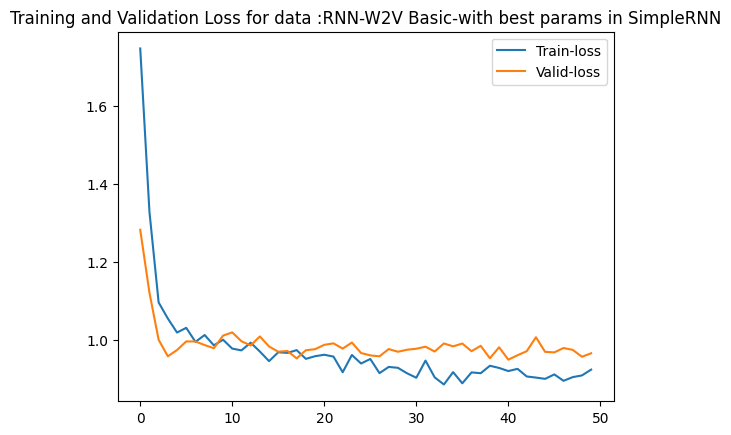

Train and Validation Accuracy


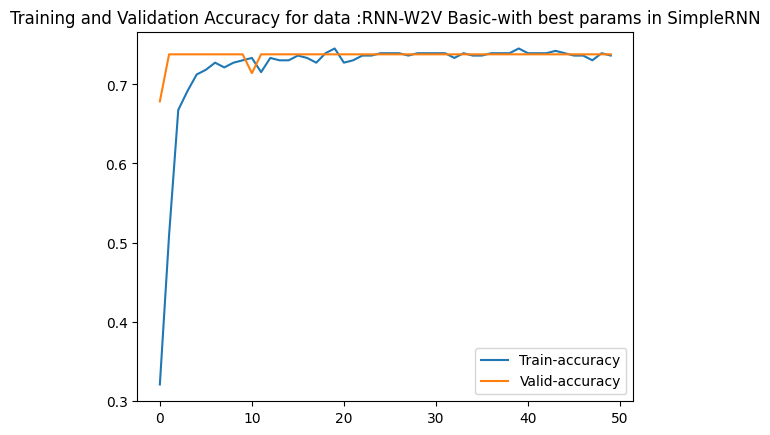

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step
Confusion Matrix


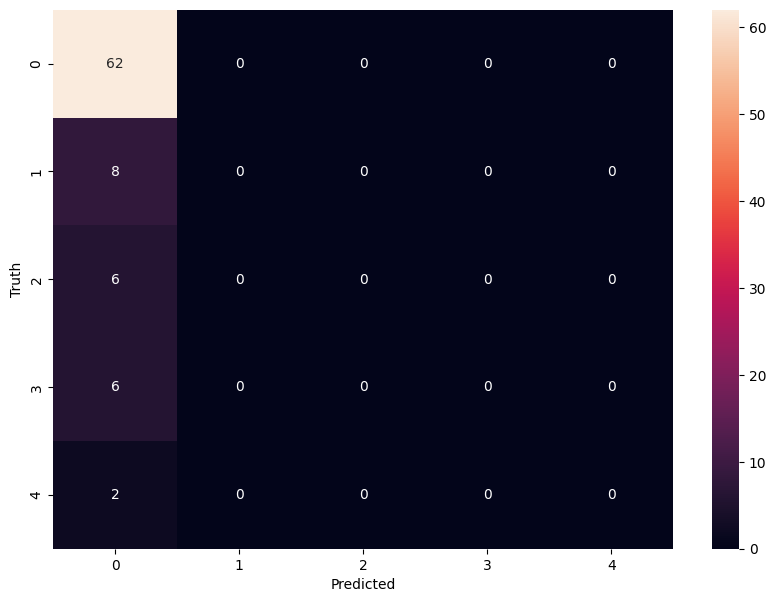

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :                 Data Description Model Description  Train Accuracy  Test Accuracy  F1 Score
0  RNN-W2V Basic-with best params         SimpleRNN           73.95          73.81     62.69




In [ ]:
pd.set_option('display.width',1500)
best_model_w2v, best_history_w2v, temp_result = train_and_evaluate_model(X_train_w2v, y_train_w2v, X_test_w2v, y_test_w2v, "RNN-W2V Basic-with best params")
combinedNNModelResult = pd.concat([combinedNNModelResult, temp_result])
#pd.set_option('display.width',1500)
#print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')


Reloading Tuner from my_dir/hyperparameter_tuning/tuner0.json
Best hyperparameters: {'units': 90, 'dropout_rate1': 0.30000000000000004, 'dropout_rate2': 0.30000000000000004, 'l2_param': 0.0003604061318050688, 'learning_rate': 0.0020246419340776305}
Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 1.9589 - sparse_categorical_accuracy: 0.2376 - val_loss: 1.4235 - val_sparse_categorical_accuracy: 0.5119
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 1.4915 - sparse_categorical_accuracy: 0.4402 - val_loss: 1.0948 - val_sparse_categorical_accuracy: 0.7381
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 1.1693 - sparse_categorical_accuracy: 0.6429 - val_loss: 1.0246 - val_sparse_categorical_accuracy: 0.7381
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 1.1326 - sparse_categorical_accuracy: 0.7130 - val_loss: 0.9977 - val_sparse_categorical_accuracy: 0.7381
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 1.1176 - sparse_categorical_accu

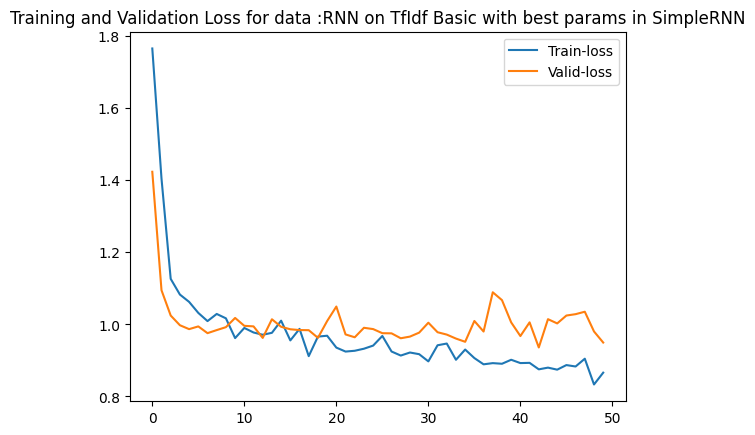

Train and Validation Accuracy


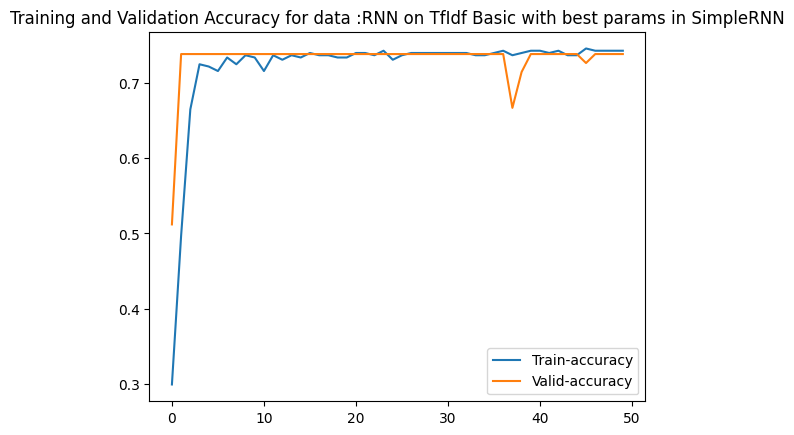

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step
Confusion Matrix


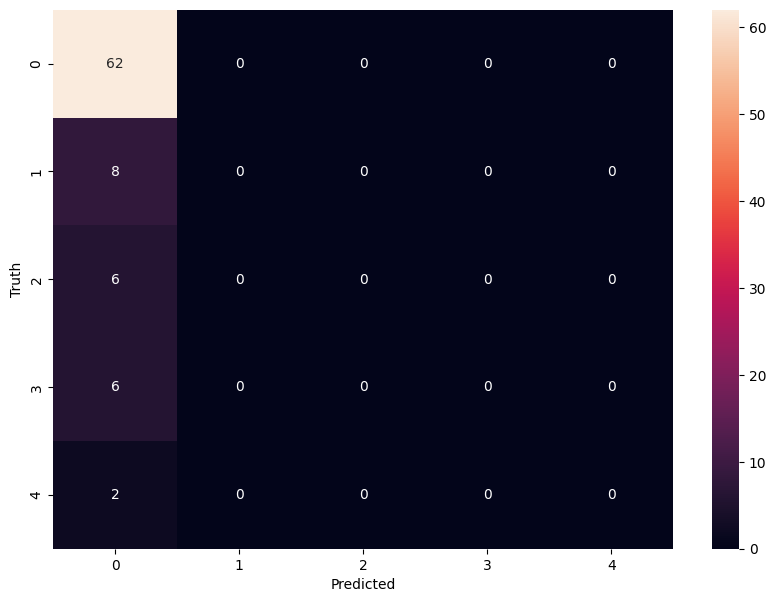

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
              precision    recall  f1-score   support

           0       0.74      1.00      0.85        62
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        84
   macro avg       0.15      0.20      0.17        84
weighted avg       0.54      0.74      0.63        84

Result Summary 
 --------------------- 
 :                      Data Description Model Description  Train Accuracy  Test Accuracy  F1 Score
0  RNN on TfIdf Basic with best params         SimpleRNN           73.95          73.81     62.69




In [ ]:
best_model_tfidf, best_history_tfidf, temp_result = train_and_evaluate_model(X_train_tfidf, y_train_tfidf, X_test_tfidf, y_test_tfidf, "RNN on TfIdf Basic with best params")
pd.set_option('display.width',1500)
combinedNNModelResult = pd.concat([combinedNNModelResult, temp_result])


In [ ]:
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

Collating Results : 
-----------------------
                      Data Description                                  Model Description  Train Accuracy  Test Accuracy   F1 Score
0                            W2V Basic                           Basic Model with 1 layer           78.44          75.00  65.160000
0                     Glove Basic Data                           Basic Model with 1 layer           91.02          73.81  69.070000
0                     TFIDF Basic Data                           Basic Model with 1 layer           94.01          70.24  61.330000
0                       W2V Basic Data    NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81  62.690000
0                     Glove Basic data    NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81  62.690000
0                     TFIDF Basic data    NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81  62.690000
0                       W2V Bas

#### LSTM


In [ ]:

import random, re
import time
import warnings
warnings.filterwarnings("ignore")

# nlp libraries
import nltk
nltk.download('punkt')
nltk.download('stopwords')

from nltk.tokenize import word_tokenize
from tqdm import tqdm
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
from sklearn.feature_extraction.text import TfidfVectorizer

from wordcloud import WordCloud

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

pd.options.display.max_columns = None
pd.options.display.max_rows = None

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
data_lstm = pd.read_excel('drive/My Drive/AIML/Data+Set+-+industrial_safety_and_health_database_with_accidents_description.xlsx')

In [ ]:
data_lstm.drop_duplicates(inplace=True)
data_lstm=data_lstm.reset_index(drop=True)
data_lstm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Unnamed: 0                425 non-null    int64         
 1   Data                      425 non-null    datetime64[ns]
 2   Countries                 425 non-null    object        
 3   Local                     425 non-null    object        
 4   Industry Sector           425 non-null    object        
 5   Accident Level            425 non-null    object        
 6   Potential Accident Level  425 non-null    object        
 7   Genre                     425 non-null    object        
 8   Employee or Third Party   425 non-null    object        
 9   Critical Risk             425 non-null    object        
 10  Description               425 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(9)
memory usage: 36.6+ KB


In [ ]:
# to use regular expressions for manipulating text data
import re

# to load the natural language toolkit
import nltk
nltk.download('stopwords')    # loading the stopwords
nltk.download('wordnet')    # loading the wordnet module that is used in stemming

# to remove common stop words
from nltk.corpus import stopwords

# to perform stemming
from nltk.stem.porter import PorterStemmer

# to create Bag of Words
from sklearn.feature_extraction.text import CountVectorizer

# to import Word2Vec
from gensim.models import Word2Vec

# to display full text in dataframe
pd.set_option('display.max_colwidth', None)

#to tokenize
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

# to Lemmetize
from nltk.stem import WordNetLemmatizer
nltk.download("omw-1.4")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
#copying to dataframe for nlp processing
df_nlp=data_lstm.copy()

In [ ]:
# defining a function to remove special characters
def remove_special_characters(text):
    # Defining the regex pattern to match non-alphanumeric characters
    pattern = '[^A-Za-z0-9]+'

    # Finding the specified pattern and replacing non-alphanumeric characters with a blank string
    new_text = ''.join(re.sub(pattern, ' ', text))

    return new_text

In [ ]:
# Applying the function to remove special characters
df_nlp['cleaned_text'] = data_lstm['Description'].apply(remove_special_characters)
# Changing test to lower case
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].str.lower()
# Removing extra whitespaces from the text
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].str.strip()
# Removing extra whitespaces from the text
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].replace(to_replace=r'\d', value='', regex=True)

In [ ]:

# Defining a function to remove stop words (like pronouns) using the NLTK library
def remove_stopwords(text):
    # Split text into separate words
    words = text.split()

    # Removing English language stopwords
    new_text = ' '.join([word for word in words if word not in stopwords.words('english')])

    return new_text

In [ ]:
# Applying the function to remove stop words using the NLTK library
df_nlp['cleaned_text_without_stopwords'] = df_nlp['cleaned_text'].apply(remove_stopwords)
#Tokenize sentence into words
df_nlp['cleaned_text_stopwords_token'] = df_nlp['cleaned_text_without_stopwords'].apply(word_tokenize)

In [ ]:
# Initializing Lemmatizer
wnl = WordNetLemmatizer()

def apply_lemmetizer(text):

    for word in text:
      new_text = ' '.join([wnl.lemmatize(word) for word in text])

    return new_text

In [ ]:
# Applying the function to perform lemmetization
df_nlp['final_cleaned_text'] = df_nlp['cleaned_text_stopwords_token'].apply(apply_lemmetizer)

In [ ]:
#W2V
# creating a list of all words in our data
words_list = [item.split(" ") for item in df_nlp['final_cleaned_text'].values]

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer

# Assuming words_list is your list of sentences (a list of lists of words)
tokenizer = Tokenizer()
tokenizer.fit_on_texts(words_list)

# Get the word index from the tokenizer
word_index = tokenizer.word_index

sequences = tokenizer.texts_to_sequences(words_list)

# Calculate sentence lengths
sentence_lengths = [len(seq) for seq in sequences]
max_sentence_length = max(sentence_lengths)

In [ ]:
word_index

{'employee': 1,
 'hand': 2,
 'causing': 3,
 'left': 4,
 'right': 5,
 'operator': 6,
 'activity': 7,
 'time': 8,
 'injury': 9,
 'moment': 10,
 'worker': 11,
 'collaborator': 12,
 'area': 13,
 'one': 14,
 'work': 15,
 'equipment': 16,
 'finger': 17,
 'assistant': 18,
 'accident': 19,
 'pipe': 20,
 'level': 21,
 'hit': 22,
 'floor': 23,
 'support': 24,
 'mesh': 25,
 'rock': 26,
 'fall': 27,
 'cm': 28,
 'mr': 29,
 'safety': 30,
 'glove': 31,
 'meter': 32,
 'approximately': 33,
 'team': 34,
 'height': 35,
 'part': 36,
 'side': 37,
 'described': 38,
 'circumstance': 39,
 'cut': 40,
 'pump': 41,
 'kg': 42,
 'truck': 43,
 'injured': 44,
 'face': 45,
 'metal': 46,
 'used': 47,
 'x': 48,
 'place': 49,
 'towards': 50,
 'medical': 51,
 'mechanic': 52,
 'performing': 53,
 'foot': 54,
 'two': 55,
 'using': 56,
 'point': 57,
 'platform': 58,
 'made': 59,
 'remove': 60,
 'end': 61,
 'performed': 62,
 'generating': 63,
 'access': 64,
 'maintenance': 65,
 'fragment': 66,
 'inside': 67,
 'plate': 68,
 'd

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Pad sequences to ensure uniform length
X_padded = pad_sequences(sequences, maxlen=max_sentence_length)

print("Padded sequences shape:", X_padded.shape)

Padded sequences shape: (425, 95)


In [ ]:
# creating an instance of Word2Vec
model_W2V = Word2Vec(words_list, vector_size = 100, min_count = 1, window=5, workers = 6)
# Checking the size of the vocabulary
print("Length of the vocabulary is", len(list(model_W2V.wv.key_to_index)))

Length of the vocabulary is 2800


In [ ]:
# Dictionary with key as words and the value as the embedding vector.

words = list(model_W2V.wv.key_to_index.keys())

# Retrieving word vectors for all the words present in the model's vocabulary
wvs = model_W2V.wv[words].tolist()

# Creating a dictionary of words and their corresponding vectors
word_vector_dict = dict(zip(words, wvs))

In [ ]:
word_vector_dict

{'employee': [-0.015219547785818577,
  0.05100543051958084,
  0.016917822882533073,
  0.006691812537610531,
  0.002394844777882099,
  -0.08818606287240982,
  0.026438353583216667,
  0.10338408499956131,
  -0.03266698122024536,
  -0.03676478564739227,
  -0.002071388065814972,
  -0.07245481759309769,
  -0.025810373947024345,
  0.015458564274013042,
  0.004666529130190611,
  -0.038845911622047424,
  0.012551011517643929,
  -0.05809682980179787,
  -0.014178282581269741,
  -0.0982581228017807,
  0.030606798827648163,
  0.02325250394642353,
  0.01195751503109932,
  -0.032115865498781204,
  -0.01775427907705307,
  0.005715230945497751,
  -0.03925216943025589,
  -0.040785033255815506,
  -0.036475762724876404,
  0.003643206786364317,
  0.04219133406877518,
  0.01452681515365839,
  0.021341295912861824,
  -0.03801090642809868,
  -0.01877337135374546,
  0.05334014445543289,
  0.01096575427800417,
  -0.05234678089618683,
  -0.025891512632369995,
  -0.09723687171936035,
  0.0066267745569348335,
  -

In [ ]:
import numpy as np

# Define the size of the embedding
embedding_dim = 100  # This should match the vector_size used in Word2Vec
vocab_size = len(word_index) + 1  # +1 because Keras word indices are 1-based

# Initialize embedding matrix with zeros
embedding_matrix = np.zeros((vocab_size, embedding_dim))

# Fill the embedding matrix with Word2Vec vectors
for word, i in word_index.items():
    if word in word_vector_dict:  # Check if the word exists in the Word2Vec model
        embedding_matrix[i] = word_vector_dict[word]

In [ ]:
embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.01521955,  0.05100543,  0.01691782, ..., -0.0638089 ,
         0.0146303 , -0.00199482],
       [-0.02627162,  0.05644401,  0.01757281, ..., -0.06093726,
         0.00414692, -0.00294113],
       ...,
       [ 0.00115309,  0.00894521, -0.00145534, ...,  0.0082667 ,
         0.00423198,  0.00361376],
       [-0.00211785,  0.00153961, -0.00767346, ..., -0.00041441,
        -0.00892128, -0.00603138],
       [-0.00865966,  0.00694644, -0.00450014, ..., -0.00691126,
         0.00505519,  0.00631498]])

In [ ]:
print (vocab_size)
print (embedding_matrix.shape)
print (max_sentence_length)
print (embedding_dim)

2801
(2801, 100)
95
100


In [ ]:
y = data_lstm['Accident Level']

In [ ]:
!pip install scikit-learn  # Install scikit-learn if you haven't already
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)  # Create OneHotEncoder instance
y_encoded = encoder.fit_transform(y.values.reshape(-1, 1))  # Reshape and encode

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_padded, y_encoded, test_size=0.2,stratify=y, random_state=42)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout

model = Sequential()

# Create the embedding layer
embedding_layer = Embedding(input_dim=vocab_size,
                            output_dim=embedding_dim,
                            weights=[embedding_matrix],
                            input_length=max_sentence_length,  # sentence_length is the length of input sequences
                            trainable=False)  # Set trainable to False to use the embeddings as they are
model.add(embedding_layer)

# Add other layers (LSTM, Dense, etc.)
model.add(LSTM(100))
model.add(Dropout(0.3))
model.add(Dense(5, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │         280,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 280,100 (1.07 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 280,100 (1.07 MB)

In [ ]:
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 272ms/step - accuracy: 0.6070 - loss: 1.5298 - val_accuracy: 0.7412 - val_loss: 1.0146
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - accuracy: 0.7560 - loss: 0.9501 - val_accuracy: 0.7412 - val_loss: 0.9845
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 138ms/step - accuracy: 0.7560 - loss: 0.9215 - val_accuracy: 0.7412 - val_loss: 0.9299
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.7560 - loss: 0.9039 - val_accuracy: 0.7412 - val_loss: 0.9246
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.7560 - loss: 0.8815 - val_accuracy: 0.7412 - val_loss: 0.9214
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7560 - loss: 0.8767 - val_accuracy: 0.7412 - val_loss: 0.9192
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - accuracy: 0.7560 - loss: 0.8927 - val_accuracy: 0.7412 - val_loss: 0.9171
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - accuracy: 0.7560 - loss: 0.8800 - val_accuracy: 0.7412 

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.7729 - loss: 0.8288
Test Loss: 0.9152, Test Accuracy: 0.7412
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - accuracy: 0.7331 - loss: 0.9073
Train Loss: 0.8707, Train Accuracy: 0.7441


In [ ]:
y_pred = model.predict(X_test)
F1_score= f1_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='weighted')
tempResult = pd.DataFrame({'Data Description':"LSTM on W2V ",
                                'Model Description':"LSTM on W2V dataset",
                                'Train Accuracy': round(train_accuracy*100,2),
                                'Test Accuracy':round(test_accuracy*100,2),
                                'F1 Score':round(F1_score*100,2),
                                }, index=[0])

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


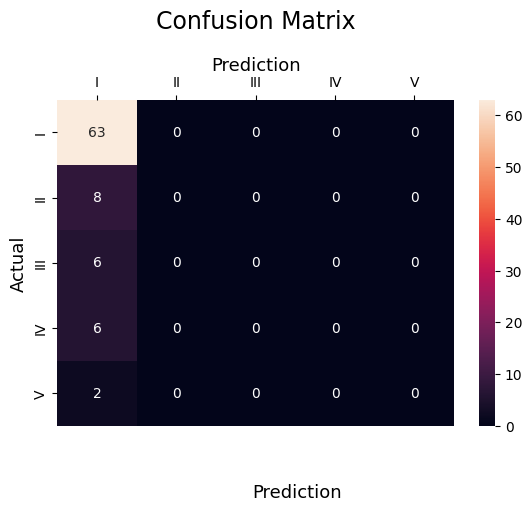

In [ ]:
cm = confusion_matrix(np.argmax(y_test, axis=1),np.argmax(y_pred, axis=1))
sns.heatmap(cm,
            annot=True,
            fmt='g',
            xticklabels=['I','II','III', 'IV','V'],
            yticklabels=['I','II','III', 'IV','V'])
plt.ylabel('Actual', fontsize=13)
plt.title('Confusion Matrix', fontsize=17, pad=20)
plt.gca().xaxis.set_label_position('top')
plt.xlabel('Prediction', fontsize=13)
plt.gca().xaxis.tick_top()

plt.gca().figure.subplots_adjust(bottom=0.2)
plt.gca().figure.text(0.5, 0.05, 'Prediction', ha='center', fontsize=13)
plt.show()

In [ ]:
print(classification_report(np.argmax(y_test, axis=1),np.argmax(y_pred, axis=1)))

              precision    recall  f1-score   support

           0       0.74      1.00      0.85        63
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         2

    accuracy                           0.74        85
   macro avg       0.15      0.20      0.17        85
weighted avg       0.55      0.74      0.63        85



In [ ]:
combinedNNModelResult=pd.concat([combinedNNModelResult, tempResult])

#### Collating Results

In [ ]:
#reset index
combinedNNModelResult.reset_index(drop=True, inplace=True)

In [ ]:
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

Collating Results : 
-----------------------
                       Data Description                                     Model Description  Train Accuracy  Test Accuracy  F1 Score
0                             W2V Basic                              Basic Model with 1 layer           78.44          75.00     65.16
1                      Glove Basic Data                              Basic Model with 1 layer           91.02          73.81     69.07
2                      TFIDF Basic Data                              Basic Model with 1 layer           94.01          70.24     61.33
3                        W2V Basic Data       NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81     62.69
4                      Glove Basic data       NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81     62.69
5                      TFIDF Basic data       NN Classifier Layers-Dropouts-Normalization-SGD           73.95          73.81     62.69
6         

In [ ]:
combinedNNModelResult

,Data Description,Model Description,Train Accuracy,Test Accuracy,F1 Score
0,W2V Basic,Basic Model with 1 layer,78.44,75.00,65.16
1,Glove Basic Data,Basic Model with 1 layer,91.02,73.81,69.07
2,TFIDF Basic Data,Basic Model with 1 layer,94.01,70.24,61.33
3,W2V Basic Data,NN Classifier Layers-Dropouts-Normalization-SGD,73.95,73.81,62.69
4,Glove Basic data,NN Classifier Layers-Dropouts-Normalization-SGD,73.95,73.81,62.69
5,TFIDF Basic data,NN Classifier Layers-Dropouts-Normalization-SGD,73.95,73.81,62.69
6,W2V Basic Data,NN Classifier Layers-Dropouts-Normalization-ADAM,73.95,71.43,61.94
7,Glove Basic Data,NN Classifier Layers-Dropouts-Normalization-ADAM,74.25,73.81,62.69
8,TFIDF Basic Data,NN Classifier Layers-Dropouts-Normalization-ADAM,74.55,73.81,62.69
9,W2V Basic,Basic w2v NN model with best parameters,73.95,73.81,62.69


1. Stared with ANN models and then to RNN and LSTM models on different datasets (word2vec, GloVe and TFIDF)
2. Accuracies were better with single layer basic  Neural network, however only one class was identified by the models.
3. As the data is highly imbalanced, deep learning models like RNN and LSTM also did not perform well in classification.
4. Hence, we want to try augmenting the data and see the accuracy of the models.

#### Data Augmentation

###### Loading packages and data

In [ ]:
#used for augmentation
pip install nlpaug

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.5/410.5 kB 15.9 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow_hub==0.16.1
!pip install tf-keras
!pip install tensorflow-text

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 71.2 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import re
import time
import warnings
import pickle
import os
import string

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Dropout, Bidirectional, SpatialDropout1D, GRU
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.sequence import pad_sequences

from sklearn.preprocessing import StandardScaler, PowerTransformer, LabelEncoder, OneHotEncoder
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, KFold, LeaveOneOut, StratifiedKFold, RepeatedStratifiedKFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, BaggingClassifier, AdaBoostClassifier
from sklearn.linear_model import RidgeClassifier, LogisticRegression, Lasso
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.metrics import classification_report, accuracy_score, f1_score, confusion_matrix, recall_score, precision_score, mean_squared_error, r2_score
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from gensim.models import Word2Vec, KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

from wordcloud import WordCloud, ImageColorGenerator

import nlpaug.augmenter.char as nac
import nlpaug.augmenter.word as naw
import nlpaug.augmenter.sentence as nas
import nlpaug.flow as naf

from nlpaug.util import Action

from google.cloud import storage
import tensorflow_hub as hub
import tensorflow_text as text

# Ensure warnings are ignored
warnings.filterwarnings("ignore")


In [ ]:
df = pd.read_excel('drive/My Drive/AIML/Data+Set+-+industrial_safety_and_health_database_with_accidents_description.xlsx')

In [ ]:
df.head()

,Unnamed: 0,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
0,0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


In [ ]:
df = df.replace('\n', '', regex=True)
df['Desc_count'] = df['Description'].apply(lambda x: len(x))

In [ ]:
#drop all columns excepts label and text
df.drop([307], inplace = True)
df.drop(['Unnamed: 0', 'Data', 'Countries', 'Local', 'Industry Sector', 'Potential Accident Level', 'Genre', 'Employee or Third Party', 'Critical Risk', 'Desc_count'], axis=1, inplace=True)


In [ ]:
X = df.drop(columns=['Accident Level'])
y = df['Accident Level']


###### Augmenting Data

In [ ]:
df['Accident Level'].value_counts()

,count
Accident Level,
I,316
II,40
III,31
IV,30
V,7


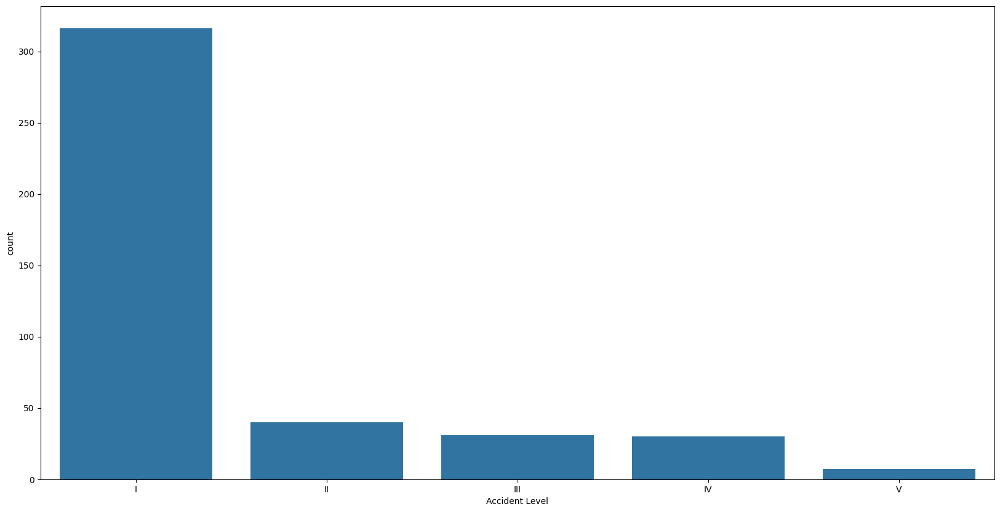

In [ ]:
#checking the distribition of Accident Label class
fig, ax = plt.subplots(figsize=(20, 10))
sns.countplot(data=df, x='Accident Level', order=['I', 'II','III','IV','V'],ax=ax);

1. From the above figure, we can notice that data is very unbalanced.
2. Lelev I has most fo the data and there is very less data in other classes
3. As there is not sufficient data in other classes, Models are not giving good accuracy.
4. We will try to augment the data to balance the classes and then run the models on augmented data set


In [ ]:
df_ini = df.copy()

In [ ]:
# Creating Separate dataframes as per Accident level.
AL_I   = df[df['Accident Level'] == 'I']
AL_II  = df[df['Accident Level'] == 'II']
AL_III = df[df['Accident Level'] == 'III']
AL_IV  = df[df['Accident Level'] == 'IV']
AL_V   = df[df['Accident Level'] == 'V']

In [ ]:
from gensim.scripts.glove2word2vec import glove2word2vec
glove_input_file = 'drive/My Drive/AIML/glove.6B.100d.txt'
word2vec_output_file = 'glove.6B.100d.txt.word2vec'
glove2word2vec(glove_input_file, word2vec_output_file)

(400000, 100)

In [ ]:
from gensim.models import KeyedVectors
# load the Stanford GloVe model
filename = 'glove.6B.100d.txt.word2vec'
glove_model = KeyedVectors.load_word2vec_format(filename, binary=False)

In [ ]:
# Save the Word2Vec model for later use (if necessary)
glove_model.save_word2vec_format('glove.6B.100d.txt.word2vec', binary=True)

In [ ]:
import nlpaug.augmenter.word as naw

# Load the correctly formatted Word2Vec model with NLPAug
aug_w2v = naw.WordEmbsAug(model_type='word2vec', model_path='glove.6B.100d.txt.word2vec', action="substitute")

In [ ]:
AL_IV_Sample_Df   = AL_IV.sample(n=270, replace=True)

AL_II_Sample_Df  = AL_II.sample(n=260, replace=True)

AL_III_Sample_Df = AL_III.sample(n=272, replace=True)

AL_V_Sample_Df   = AL_V.sample(n=280, replace=True)

In [ ]:
# Function to actually augment the description data.
def augmentText(al_df):
    for i, row in al_df.iterrows():
        al_df.at[i, 'Description'] = aug_w2v.augment(row['Description'])

In [ ]:
augmentText(AL_IV_Sample_Df)

augmentText(AL_II_Sample_Df)

augmentText(AL_III_Sample_Df)

augmentText(AL_V_Sample_Df)

In [ ]:
# Concatenating Augmented dataframes.
frames = [df, AL_IV_Sample_Df, AL_II_Sample_Df, AL_III_Sample_Df, AL_V_Sample_Df]
df_bal = pd.concat(frames)

# Shuffling the records in dataframe as they do remain grouped after concatenation.
df_bal = df_bal.sample(frac = 1).reset_index(drop=True)

In [ ]:
df_bal.shape


(1506, 2)

In [ ]:
# Save the DataFrame as a CSV file
df_bal.to_csv('drive/My Drive/AIML/df_bal.csv', index=False)

# Alternatively, you can save it as a pickle file for more efficient storage
df_bal.to_pickle('drive/My Drive/AIML/df_bal.pkl')

In [ ]:
'''# Load the DataFrame from the CSV file
df_bal_loaded = pd.read_csv('drive/My Drive/AIML/df_bal.csv')
# Load the DataFrame from the pickle file
df_bal_loaded = pd.read_pickle('drive/My Drive/AIML/df_bal.pkl')
'''

In [ ]:
df_bal['Accident Level'].value_counts()


,count
Accident Level,
I,316
III,303
II,300
IV,300
V,287


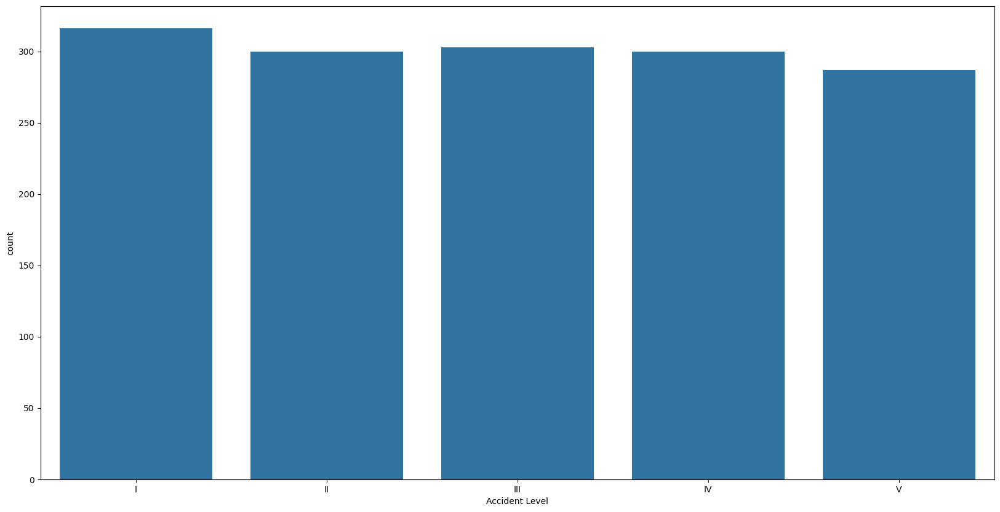

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.countplot(data=df_bal, x='Accident Level',order=['I', 'II','III','IV','V'], ax=ax);

Now the data in all classes are balanced

In [ ]:
df_bal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1506 entries, 0 to 1505
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Accident Level  1506 non-null   object
 1   Description     1506 non-null   object
dtypes: object(2)
memory usage: 23.7+ KB


In [ ]:
df_bal['Description'][0]

'In circumstances that Mr. Efraín OSORIO FELIX - Mina 2nd. He entered the interior of Pocket 2 at level 2865 (Before -1205). It activated the compressed air gun that is installed in the lower part of the structure with a nozzle that communicates the air lung with the internal part of the pocket, projecting a violent flow of air that blows the left leg of the worker and generates a stun by the noise produced.'

In [ ]:
df_nlp=df_bal.copy()

###### NLP Processing

In [ ]:
# defining a function to remove special characters
import pandas as pd
import re

def remove_special_characters(text):
    # Defining the regex pattern to match non-alphanumeric characters
    pattern = '[^A-Za-z0-9]+'

    # Finding the specified pattern and replacing non-alphanumeric characters with a blank string
    new_text = ''.join(re.sub(pattern, ' ', text))

    return new_text

def remove_special_characters(text):
    if isinstance(text, str):
        pattern = '[^A-Za-z0-9]+'
        new_text = re.sub(pattern, ' ', text)
        return new_text
    else:
        return text

In [ ]:

# Ensure that df_bal has been properly defined
df_bal['cleaned_text'] = df_bal['Description'].apply(remove_special_characters)

# If you need to apply the transformation to df_nlp, make sure df_nlp has the 'Description' column
df_nlp = df_bal.copy()  # Assuming you want to work with df_nlp as a copy of df_bal

# Apply additional transformations to df_nlp
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].str.lower()

# Removing extra whitespaces from the text
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].str.strip()

# Removing extra whitespaces from the text
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].replace(to_replace=r'\d', value='', regex=True)


In [ ]:
!pip install nltk
import nltk
from nltk.corpus import stopwords

In [ ]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
def remove_stopwords(text):
    if isinstance(text, str):
        words = text.split()
        stop_words = set(stopwords.words('english'))
        new_text = ' '.join([word for word in words if word.lower() not in stop_words])
        return new_text
    else:
        return text


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df_nlp['cleaned_text_without_stopwords'] = df_nlp['cleaned_text'].apply(remove_stopwords)


In [ ]:
#Tokenize sentence into words
nltk.download('punkt')
df_nlp['cleaned_text_without_stopwords'] = df_nlp['cleaned_text_without_stopwords'].astype(str)
df_nlp['cleaned_text_without_stopwords'] = df_nlp['cleaned_text_without_stopwords'].fillna('')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
nltk.data.path.clear()

In [ ]:
nltk.data.path.append('/root/nltk_data')

In [ ]:
nltk.download('punkt', download_dir='/root/nltk_data')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
import nltk

# Print the NLTK data paths
print("NLTK data paths:", nltk.data.path)

NLTK data paths: ['/root/nltk_data']


In [ ]:
from nltk.tokenize import word_tokenize
tokenizer = nltk.data.load('nltk:tokenizers/punkt/english.pickle')
df_nlp['cleaned_text_stopwords_token'] = df_nlp['cleaned_text_without_stopwords'].apply(lambda x: word_tokenize(x) if isinstance(x, str) else [])

In [ ]:
import nltk
nltk.data.path = []  # Clear existing paths
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
import spacy
import nltk
from nltk.stem import WordNetLemmatizer

# Initialize NLTK resources
nltk.download('wordnet')
nltk.download('omw-1.4')

# Define NLTK lemmatizer
wnl = WordNetLemmatizer()

# Load SpaCy model
try:
    nlp = spacy.load('en_core_web_sm')
    spacy_available = True
except Exception as e:
    print(f"SpaCy model load error: {e}")
    spacy_available = False

# Define lemmatization function
def apply_lemmatizer(text):
    if isinstance(text, list):
        text = ' '.join(text)  # Convert list back to string

    if spacy_available:
        try:
            doc = nlp(text)
            return ' '.join([token.lemma_ for token in doc])
        except Exception as e:
            print(f"SpaCy lemmatization error: {e}")
            # Fallback to NLTK
            return nltk_lemmatize(text)
    else:
        # Fallback to NLTK if SpaCy is not available
        return nltk_lemmatize(text)

def nltk_lemmatize(text):
    words = text.split()
    return ' '.join([wnl.lemmatize(word) for word in words])

# Apply the function to the DataFrame
df_nlp['final_cleaned_text'] = df_nlp['cleaned_text_stopwords_token'].apply(apply_lemmatizer)


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
df_nlp_final_cleaned_text = df_nlp.copy()

In [ ]:
# Save the DataFrame as a CSV file
df_nlp_final_cleaned_text.to_csv('drive/My Drive/AIML/df_nlp_final_cleaned_aug_text.csv', index=False)

# Alternatively, you can save it as a pickle file for more efficient storage
df_nlp_final_cleaned_text.to_pickle('drive/My Drive/AIML/df_nlp_final_cleaned_aug_text.pkl')

###### Load Augmented and NLP processed dataset

In [ ]:
# Load the DataFrame from a CSV file
df_nlp_aug_text = pd.read_csv('drive/My Drive/AIML/df_nlp_final_cleaned_aug_text.csv')

# Display the DataFrame
print(df_nlp_aug_text.head())

  Accident Level                                        Description  \
0              I  In circumstances that Mr. Efraín OSORIO FELIX ...   
1              I  The employee reports that climbing the access ...   
2              I  During the assembly activity of polypropylene ...   
3              V  In should september not kind 3910, 1986 2007 r...   
4              I  In circumstances in which the operator of bolt...   

                                        cleaned_text  \
0  in circumstances that mr efra n osorio felix m...   
1  the employee reports that climbing the access ...   
2  during the assembly activity of polypropylene ...   
3  in should september not kind    repointed now ...   
4  in circumstances in which the operator of bolt...   

                      cleaned_text_without_stopwords  \
0  circumstances mr efra n osorio felix mina nd e...   
1  employee reports climbing access ladder operat...   
2  assembly activity polypropylene pipe diameter ...   
3  september

In [ ]:
df_nlp_aug_text.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1506 entries, 0 to 1505
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Accident Level                  1506 non-null   object
 1   Description                     1506 non-null   object
 2   cleaned_text                    1503 non-null   object
 3   cleaned_text_without_stopwords  1503 non-null   object
 4   cleaned_text_stopwords_token    1506 non-null   object
 5   final_cleaned_text              1503 non-null   object
dtypes: object(6)
memory usage: 70.7+ KB


In [ ]:
#remove null values
df_nlp_aug_text.dropna(inplace=True)

In [ ]:
df_nlp_aug_text.shape

(1503, 6)

###### Embedding Data

In [ ]:
#W2V
# creating a list of all words in our data
words_list = [item.split(" ") for item in df_nlp_aug_text['final_cleaned_text'].values]

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer

# Assuming words_list is your list of sentences (a list of lists of words)
tokenizer = Tokenizer()
tokenizer.fit_on_texts(words_list)

# Get the word index from the tokenizer
word_index = tokenizer.word_index

sequences = tokenizer.texts_to_sequences(words_list)

# Calculate sentence lengths
sentence_lengths = [len(seq) for seq in sequences]
max_sentence_length = max(sentence_lengths)

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Pad sequences to ensure uniform length
X_padded = pad_sequences(sequences, maxlen=max_sentence_length)

print("Padded sequences shape:", X_padded.shape)

Padded sequences shape: (1503, 110)


In [ ]:
# creating an instance of Word2Vec
model_W2V = Word2Vec(words_list, vector_size = 100, min_count = 1, window=5, workers = 6)
# Checking the size of the vocabulary
print("Length of the vocabulary is", len(list(model_W2V.wv.key_to_index)))

Length of the vocabulary is 3657


In [ ]:
# Dictionary with key as words and the value as the embedding vector.

words = list(model_W2V.wv.key_to_index.keys())

# Retrieving word vectors for all the words present in the model's vocabulary
wvs = model_W2V.wv[words].tolist()

# Creating a dictionary of words and their corresponding vectors
word_vector_dict = dict(zip(words, wvs))

In [ ]:
import numpy as np

# Define the size of the embedding
embedding_dim = 100  # This should match the vector_size used in Word2Vec
vocab_size = len(word_index) + 1  # +1 because Keras word indices are 1-based

# Initialize embedding matrix with zeros
embedding_matrix = np.zeros((vocab_size, embedding_dim))

# Fill the embedding matrix with Word2Vec vectors
for word, i in word_index.items():
    if word in word_vector_dict:  # Check if the word exists in the Word2Vec model
        embedding_matrix[i] = word_vector_dict[word]

In [ ]:
embedding_matrix

array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-5.77343106e-01,  4.82772678e-01,  1.91145718e-01, ...,
        -7.84745216e-01,  3.77532899e-01, -1.92808583e-01],
       [-7.25353718e-01,  6.23810112e-01,  1.13283016e-01, ...,
        -8.53813112e-01,  3.41728956e-01, -5.54654235e-03],
       ...,
       [-3.18922065e-02,  9.77649260e-03, -1.90693582e-03, ...,
        -2.78429203e-02,  4.53467155e-03,  1.72639760e-04],
       [-1.63868573e-02,  2.06665788e-02,  4.56927482e-05, ...,
        -3.29611674e-02,  6.21473650e-03, -4.04176972e-05],
       [-1.52574629e-02,  1.88009255e-02,  1.26959132e-02, ...,
        -2.31007691e-02,  9.62041225e-03,  3.88677116e-04]])

In [ ]:
print (vocab_size)
print (embedding_matrix.shape)
print (max_sentence_length)
print (embedding_dim)

3658
(3658, 100)
110
100


In [ ]:
y = df_nlp_aug_text['Accident Level']

In [ ]:
!pip install scikit-learn  # Install scikit-learn if you haven't already
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)  # Create OneHotEncoder instance
y_encoded = encoder.fit_transform(y.values.reshape(-1, 1))  # Reshape and encode

In [ ]:
y_encoded

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.]])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_padded, y_encoded, test_size=0.2,stratify=y, random_state=42)

In [ ]:
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

X_train shape: (1202, 110), y_train shape: (1202, 5)
X_test shape: (301, 110), y_test shape: (301, 5)


###### Define functions

In [ ]:
def plotLossChart(history):
    plt.figure(figsize=(16,5))
    epochs = range(1, len(history.history['accuracy'])+1)
    plt.plot(epochs, history.history['loss'], 'b', label='Training Loss', color='red')
    plt.plot(epochs, history.history['val_loss'], 'b', label='Validation Loss')
    plt.legend()
    plt.show()

In [ ]:
def plotAccuracyChart(history):
    plt.figure(figsize=(16,5))
    epochs = range(1, len(history.history['accuracy'])+1)
    plt.plot(epochs, history.history['accuracy'], 'b', label='Training Accuracy', color='red')
    plt.plot(epochs, history.history['val_accuracy'], 'b', label='Validation Accuracy')
    plt.legend()
    plt.show()

In [ ]:
def plotAccuracyChart(history):
    plt.figure(figsize=(16,5))
    epochs = range(1, len(history.history['accuracy'])+1)
    plt.plot(epochs, history.history['accuracy'], 'b', label='Training Accuracy', color='red')
    plt.plot(epochs, history.history['val_accuracy'], 'b', label='Validation Accuracy')
    plt.legend()
    plt.show()

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

def evaluate_model_performance(model, X_test, y_test, class_labels=['I', 'II', 'III', 'IV', 'V']):
    """
    Evaluates the model performance by generating a confusion matrix and classification report.

    Parameters:
    - model: Trained Keras model
    - X_test: Test features
    - y_test: True labels for the test data
    - class_labels: List of class labels for the confusion matrix and classification report

    Returns:
    - None
    """
    # Predict on the test set
    y_pred = model.predict(X_test)

    # Convert predictions and true labels from one-hot encoding to discrete labels
    y_pred_discrete = np.argmax(y_pred, axis=1)
    y_test_discrete = np.argmax(y_test, axis=1)

    # Compute confusion matrix
    cm = confusion_matrix(y_test_discrete, y_pred_discrete)

    # Plot confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm,
                annot=True,
                fmt='g',
                xticklabels=class_labels,
                yticklabels=class_labels)
    plt.ylabel('Actual', fontsize=13)
    plt.title('Confusion Matrix', fontsize=17, pad=20)
    plt.gca().xaxis.set_label_position('top')
    plt.xlabel('Prediction', fontsize=13)
    plt.gca().xaxis.tick_top()
    plt.gca().figure.subplots_adjust(bottom=0.2)
    plt.gca().figure.text(0.5, 0.05, 'Prediction', ha='center', fontsize=13)
    plt.show()

    # Print classification report
    report = classification_report(y_test_discrete, y_pred_discrete, target_names=class_labels)
    print(report)

###### LSTM on augmented data

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, CSVLogger

# Define the model
model = Sequential()

# Create the embedding layer
embedding_layer = Embedding(input_dim=vocab_size,
                            output_dim=embedding_dim,
                            weights=[embedding_matrix],
                            input_length=max_sentence_length,  # sentence_length is the length of input sequences
                            trainable=False)  # Set trainable to False to use the embeddings as they are
model.add(embedding_layer)

# Add other layers (LSTM, Dense, etc.)
model.add(LSTM(128, dropout=0.3, return_sequences=True))
model.add(LSTM(64, dropout=0.3))
model.add(Dense(5, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model callbacks
callbacks = [
    ModelCheckpoint('best_model_lstm.keras', save_best_only=True, monitor='val_accuracy', mode='max', verbose=1),
    CSVLogger('training_log.csv')
]


In [ ]:
history_lstm=model.fit(X_train, y_train, epochs=80, batch_size=32, validation_data=(X_test, y_test),callbacks=callbacks)


Epoch 1/80
36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.1899 - loss: 1.6174
Epoch 1: val_accuracy improved from -inf to 0.36545, saving model to best_model_lstm.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - accuracy: 0.1928 - loss: 1.6143 - val_accuracy: 0.3654 - val_loss: 1.4214
Epoch 2/80
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.3693 - loss: 1.3252
Epoch 2: val_accuracy improved from 0.36545 to 0.43854, saving model to best_model_lstm.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3714 - loss: 1.3225 - val_accuracy: 0.4385 - val_loss: 1.2405
Epoch 3/80
33/38 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.4903 - loss: 1.1688
Epoch 3: val_accuracy improved from 0.43854 to 0.47508, saving model to best_model_lstm.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4885 - loss: 1.1674 - val_accuracy: 0.4751 - val_loss: 1.1553
Epoch 4/80
35/38 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.5273 - loss: 1.1092
Epoch 4: val_accuracy improved fr

In [ ]:
# Display model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ (None, 110, 100)            │         365,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 110, 128)            │         117,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 5)                   │             325 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 866,745 (3.31 MB)

 Trainable params: 166,981 (652.27 KB)

 Non-trainable params: 365,800 (1.40 MB)

 Optimizer params: 333,964 (1.27 MB)

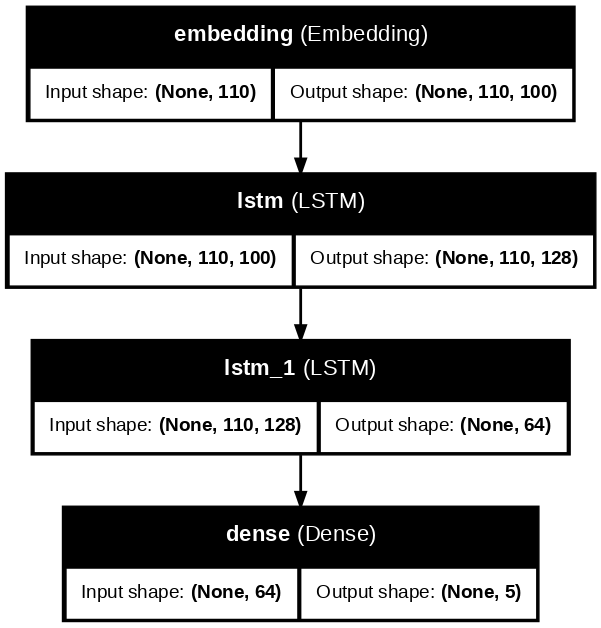

In [ ]:
from tensorflow.keras.utils import plot_model

# Assuming you have a defined model named 'model'
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True, dpi=100)

In [ ]:
from tensorflow.keras.models import load_model

# Load the model with the best weights
model = load_model('best_model_lstm.keras')

In [ ]:
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9468 - loss: 0.1607
Train Loss: 0.1714, Train Accuracy: 0.9409
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9237 - loss: 0.2983
Test Loss: 0.3007, Test Accuracy: 0.9169


10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step


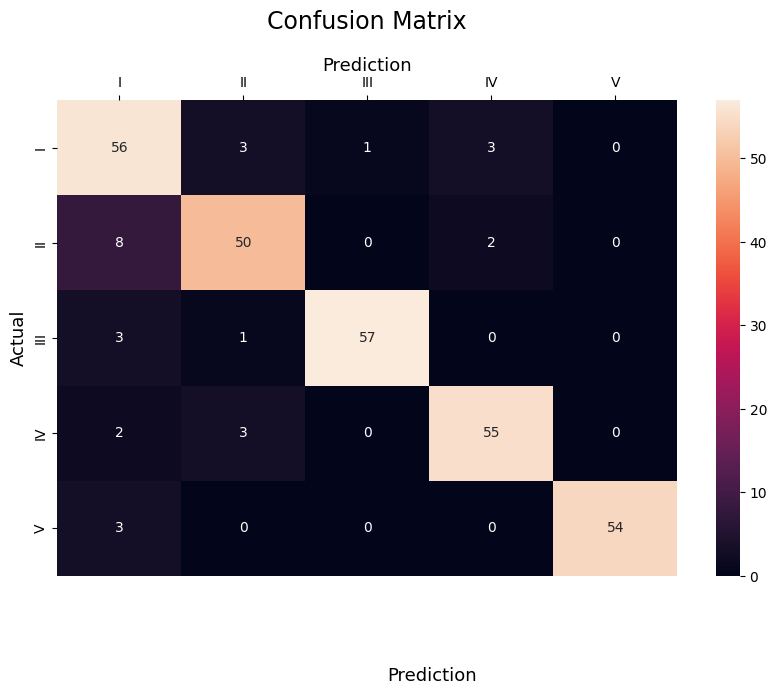

              precision    recall  f1-score   support

           I       0.78      0.89      0.83        63
          II       0.88      0.83      0.85        60
         III       0.98      0.93      0.96        61
          IV       0.92      0.92      0.92        60
           V       1.00      0.95      0.97        57

    accuracy                           0.90       301
   macro avg       0.91      0.90      0.91       301
weighted avg       0.91      0.90      0.91       301



In [ ]:
evaluate_model_performance(model, X_test, y_test)

In [ ]:
y_pred = model.predict(X_test)
F1_score= f1_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='weighted')
print(f"F1 Score: {F1_score:.4f}")
tempResult = pd.DataFrame({'Data Description':"LSTM on W2V using augmented data",
                                'Model Description':"LSTM on W2V-augmented dataset ",
                                'Train Accuracy':round(train_accuracy*100,2),
                                'Test Accuracy':round(test_accuracy*100,2),
                                'F1 Score':round(F1_score*100,2),
                                }, index=[0])

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
F1 Score: 0.9020


In [ ]:
#combinedNNModelResult = pd.concat([combinedNNModelResult, temp_result])
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{tempResult}\n')

Collating Results : 
-----------------------
                   Data Description               Model Description  Train Accuracy  Test Accuracy  F1 Score
0  LSTM on W2V using augmented data  LSTM on W2V-augmented dataset            94.09          91.69      90.2



##### BiDirectional LSTM on augmented data

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the model
model_Bi_LSTM = Sequential()

# Create the embedding layer
embedding_layer = Embedding(input_dim=vocab_size,
                            output_dim=embedding_dim,
                            weights=[embedding_matrix],
                            input_length=max_sentence_length,  # sentence_length is the length of input sequences
                            trainable=False)  # Set trainable to False to use the embeddings as they are
model_Bi_LSTM.add(embedding_layer)

# Add a Bidirectional LSTM layer with multiple layers
model_Bi_LSTM.add(Bidirectional(LSTM(128, return_sequences=True)))  # Return sequences for next LSTM layer
model_Bi_LSTM.add(Dropout(0.4))  # Adjust dropout rate

model_Bi_LSTM.add(Bidirectional(LSTM(64)))  # Add another LSTM layer
model_Bi_LSTM.add(Dropout(0.4))  # Adjust dropout rate

# Add a Dense layer
model_Bi_LSTM.add(Dense(5, activation='softmax'))

# Compile the model
model_Bi_LSTM.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model callbacks
callbacks = [
    ModelCheckpoint('best_BiLSTM_model.keras', save_best_only=True, monitor='val_accuracy', mode='max', verbose=1)
]


In [ ]:
# Train the model
history_bi_lstm = model_Bi_LSTM.fit(X_train, y_train,
                         epochs=100,
                         batch_size=32,
                         validation_data=(X_test, y_test),
                         callbacks=callbacks)

Epoch 1/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.2697 - loss: 1.5613
Epoch 1: val_accuracy improved from -inf to 0.35548, saving model to best_BiLSTM_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - accuracy: 0.2717 - loss: 1.5583 - val_accuracy: 0.3555 - val_loss: 1.4835
Epoch 2/100
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4687 - loss: 1.1739
Epoch 2: val_accuracy improved from 0.35548 to 0.54485, saving model to best_BiLSTM_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4710 - loss: 1.1699 - val_accuracy: 0.5449 - val_loss: 1.0559
Epoch 3/100
36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5424 - loss: 1.0027
Epoch 3: val_accuracy improved from 0.54485 to 0.58472, saving model to best_BiLSTM_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.5433 - loss: 1.0018 - val_accuracy: 0.5847 - val_loss: 0.9334
Epoch 4/100
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5135 - loss: 1.0775
Epoch 4: val_accuracy d

In [ ]:
# Print model summary
model_Bi_LSTM.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)              │ (None, 110, 100)            │         365,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_2 (Bidirectional)      │ (None, 110, 256)            │         234,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 110, 256)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_3 (Bidirectional)      │ (None, 128)                 │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,564,281 (5.97 MB)

 Trainable params: 399,493 (1.52 MB)

 Non-trainable params: 365,800 (1.40 MB)

 Optimizer params: 798,988 (3.05 MB)

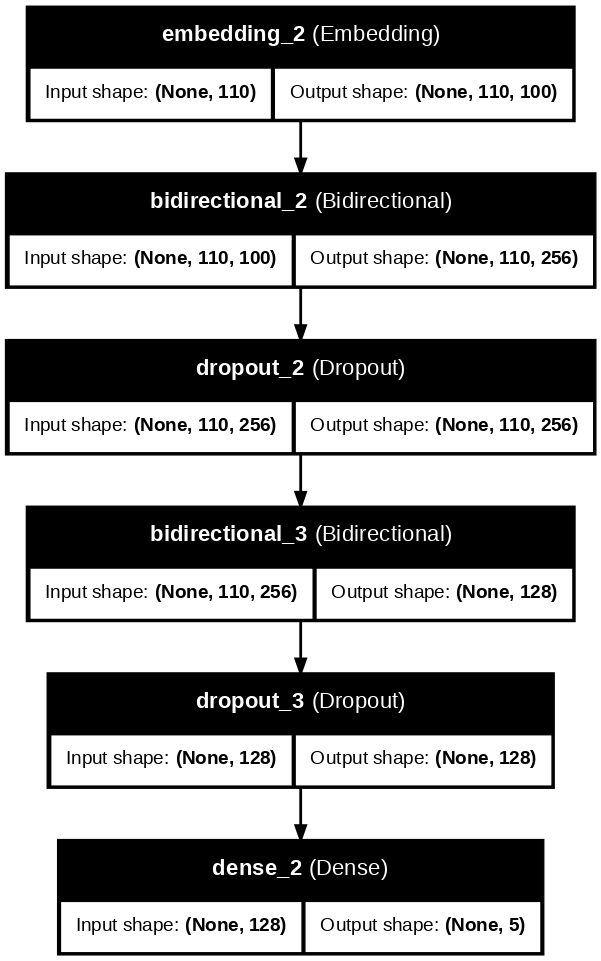

In [ ]:
#from keras.utils.vis_utils import plot_model
from tensorflow.keras.utils import plot_model

# Assuming you have a defined model named 'model'
plot_model(model_Bi_LSTM, to_file='model_plot.png', show_shapes=True, show_layer_names=True, dpi=100)


In [ ]:
# prompt: decrease the size of model plot

#from keras.utils.vis_utils import plot_model

# Assuming you have a defined model named 'model'
plot_model(model_Bi_LSTM, to_file='model_plot.png', show_shapes=True, show_layer_names=True, dpi=300)


38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9550 - loss: 0.1512
Train Loss: 0.1621, Train Accuracy: 0.9476
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9106 - loss: 0.3092 
Test Loss: 0.3235, Test Accuracy: 0.9003
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step


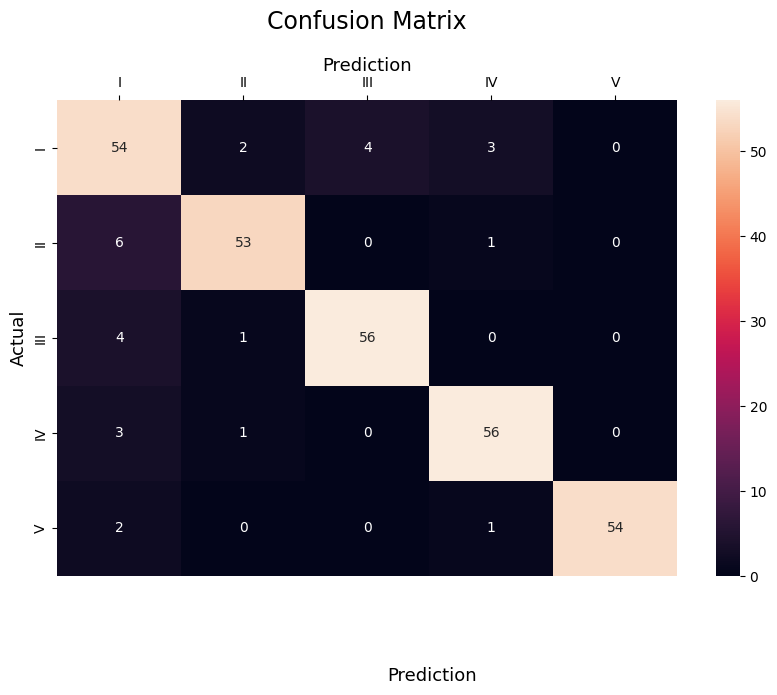

              precision    recall  f1-score   support

           I       0.78      0.86      0.82        63
          II       0.93      0.88      0.91        60
         III       0.93      0.92      0.93        61
          IV       0.92      0.93      0.93        60
           V       1.00      0.95      0.97        57

    accuracy                           0.91       301
   macro avg       0.91      0.91      0.91       301
weighted avg       0.91      0.91      0.91       301



In [ ]:
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

evaluate_model_performance(model_Bi_LSTM, X_test, y_test)

In [ ]:
y_pred_bi = model_Bi_LSTM.predict(X_test)
F1_score= f1_score(np.argmax(y_test, axis=1), np.argmax(y_pred_bi, axis=1), average='weighted')
print(f"F1 Score: {F1_score:.4f}")
tempResult1 = pd.DataFrame({'Data Description':"BiDirectional LSTM on W2V using augmented data",
                                'Model Description':"LSTM on W2V dataset",
                                'Train Accuracy':round(train_accuracy*100,2),
                                'Test Accuracy':round(test_accuracy*100,2),
                                'F1 Score':round(F1_score*100,2),
                                }, index=[0])

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
F1 Score: 0.9082


In [ ]:
combinedNNModelResult = pd.concat([tempResult, tempResult1])
pd.set_option('display.width',1500)
print(f'Collating Results : \n-----------------------\n{combinedNNModelResult}\n')

Collating Results : 
-----------------------
                                 Data Description               Model Description  Train Accuracy  Test Accuracy  F1 Score
0                LSTM on W2V using augmented data  LSTM on W2V-augmented dataset            94.09          91.69     90.20
0  BiDirectional LSTM on W2V using augmented data             LSTM on W2V dataset           94.76          90.03     90.82



In [ ]:
combinedNNModelResult

,Data Description,Model Description,Train Accuracy,Test Accuracy,F1 Score
0,LSTM on W2V using augmented data,LSTM on W2V-augmented dataset,94.09,91.69,90.20
1,BiDirectional LSTM on W2V using augmented data,LSTM on W2V dataset,94.76,90.03,90.82


#### LSTM-Augment only Train data

In [ ]:
pip install nlpaug


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.5/410.5 kB 2.4 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow-text

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 18.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import re
import time
import warnings
import pickle
import os
import string

import tensorflow as tf

import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from gensim.models import Word2Vec, KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

from wordcloud import WordCloud, ImageColorGenerator

import nlpaug.augmenter.char as nac
import nlpaug.augmenter.word as naw
import nlpaug.augmenter.sentence as nas
import nlpaug.flow as naf

from nlpaug.util import Action

from google.cloud import storage
import tensorflow_hub as hub
import tensorflow_text as text

# Ensure warnings are ignored
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_excel('drive/My Drive/AIML/Data+Set+-+industrial_safety_and_health_database_with_accidents_description.xlsx')

In [ ]:
df = df.replace('\n', '', regex=True)
df['Desc_count'] = df['Description'].apply(lambda x: len(x))

In [ ]:
df.drop(['Unnamed: 0', 'Data', 'Countries', 'Local', 'Industry Sector','Potential Accident Level', 'Genre', 'Employee or Third Party', 'Critical Risk', 'Desc_count'], axis=1, inplace=True)


In [ ]:
df.dropna(inplace=True)

In [ ]:
df.duplicated().sum()

12

In [ ]:
#delete duplicates
df.drop_duplicates(inplace=True)
#reset index
df.reset_index(drop=True, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 0 to 412
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Accident Level  413 non-null    object
 1   Description     413 non-null    object
dtypes: object(2)
memory usage: 6.6+ KB


In [ ]:
X = df.drop(columns=['Accident Level'])
y = df['Accident Level']

In [ ]:
#splitting dataset and augmenting to train data
X_train_ini, X_test_ini, y_train_ini, y_test_ini = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)


In [ ]:
import pandas as pd

train_df = pd.concat([X_train_ini, y_train_ini], axis=1)

# reset the index to ensure it is sequential
train_df.reset_index(drop=True, inplace=True)

# Display the combined DataFrame
print(train_df.head())

                                         Description Accident Level
0  Collaborator was cleaning the sink of the Copp...              I
1  In circumstances that the Operator 176 was goi...              I
2  While preparing to mount polypropylene tubing,...             II
3  The employee reports that after carrying out a...              I
4  During the maintenance on the LX-P-205B pump, ...              I


In [ ]:
df_ini = df.copy()

In [ ]:
df_ini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 0 to 412
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Accident Level  413 non-null    object
 1   Description     413 non-null    object
dtypes: object(2)
memory usage: 6.6+ KB


In [ ]:
df = train_df.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 330 entries, 0 to 329
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Description     330 non-null    object
 1   Accident Level  330 non-null    object
dtypes: object(2)
memory usage: 5.3+ KB


In [ ]:
df['Accident Level'].value_counts()

,count
Accident Level,
I,243
II,32
III,25
IV,24
V,6


In [ ]:
# Creating Separate dataframes as per Potential Accident level.
Pal_I   = df[df['Accident Level'] == 'I']
Pal_II  = df[df['Accident Level'] == 'II']
Pal_III = df[df['Accident Level'] == 'III']
Pal_IV  = df[df['Accident Level'] == 'IV']
Pal_V   = df[df['Accident Level'] == 'V']

In [ ]:
from gensim.scripts.glove2word2vec import glove2word2vec
glove_input_file = '/content/drive/My Drive/Colab Notebooks/glove.6B.100d.txt'
word2vec_output_file = 'glove.6B.100d.txt.word2vec'
glove2word2vec(glove_input_file, word2vec_output_file)

(400000, 100)

In [ ]:
from gensim.models import KeyedVectors
# load the Stanford GloVe model
filename = 'glove.6B.100d.txt.word2vec'
glove_model = KeyedVectors.load_word2vec_format(filename, binary=False)

In [ ]:
# Save the Word2Vec model for later use (if necessary)
glove_model.save_word2vec_format('glove.6B.100d.txt.word2vec', binary=True)

In [ ]:
import nlpaug.augmenter.word as naw

# Load the correctly formatted Word2Vec model with NLPAug
aug_w2v = naw.WordEmbsAug(model_type='word2vec', model_path='glove.6B.100d.txt.word2vec', action="substitute")

In [ ]:
# Augment  records for Accident Level
Pal_II_Sample_Df  = Pal_II.sample(n=210, replace=True)
Pal_III_Sample_Df = Pal_III.sample(n=215, replace=True)
Pal_IV_Sample_Df  = Pal_IV.sample(n=216, replace=True)
Pal_V_Sample_Df   = Pal_V.sample(n=235, replace=True)

In [ ]:
# Function to actually augment the description data.
def augmentText(pal_df):
    for i, row in pal_df.iterrows():
        pal_df.at[i, 'Description'] = aug_w2v.augment(row['Description'])

In [ ]:
# Invoke augmentText function

augmentText(Pal_II_Sample_Df)
augmentText(Pal_III_Sample_Df)
augmentText(Pal_IV_Sample_Df)
augmentText(Pal_V_Sample_Df)

In [ ]:
# Concatenating Augmented dataframes.
frames = [df, Pal_IV_Sample_Df, Pal_II_Sample_Df, Pal_III_Sample_Df, Pal_V_Sample_Df]
df_bal = pd.concat(frames)

# Shuffling the records in dataframe as they do remain grouped after concatenation.
df_bal = df_bal.sample(frac = 1).reset_index(drop=True)

In [ ]:
df_bal.shape

(1206, 2)

In [ ]:
df_bal['Accident Level'].value_counts()

,count
Accident Level,
I,243
II,242
V,241
IV,240
III,240


In [ ]:
df_nlp=df_bal.copy()

In [ ]:
# defining a function to remove special character

import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

def remove_special_characters(text):
    if isinstance(text, str):
        pattern = '[^A-Za-z0-9]+'
        new_text = re.sub(pattern, ' ', text)
        return new_text
    else:
        return text

def remove_stopwords(text):
    if isinstance(text, str):
        words = text.split()
        stop_words = set(stopwords.words('english'))
        new_text = ' '.join([word for word in words if word.lower() not in stop_words])
        return new_text
    else:
        return text




[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
import nltk
nltk.data.path = []  # Clear existing paths
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')

import spacy
import nltk
from nltk.stem import WordNetLemmatizer

# Initialize NLTK resources
nltk.download('wordnet')
nltk.download('omw-1.4')

# Define NLTK lemmatizer
wnl = WordNetLemmatizer()

# Load SpaCy model
try:
    nlp = spacy.load('en_core_web_sm')
    spacy_available = True
except Exception as e:
    print(f"SpaCy model load error: {e}")
    spacy_available = False

# Define lemmatization function
def apply_lemmatizer(text):
    if isinstance(text, list):
        text = ' '.join(text)  # Convert list back to string

    if spacy_available:
        try:
            doc = nlp(text)
            return ' '.join([token.lemma_ for token in doc])
        except Exception as e:
            print(f"SpaCy lemmatization error: {e}")
            # Fallback to NLTK
            return nltk_lemmatize(text)
    else:
        # Fallback to NLTK if SpaCy is not available
        return nltk_lemmatize(text)

def nltk_lemmatize(text):
    words = text.split()
    return ' '.join([wnl.lemmatize(word) for word in words])

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:

# Ensure that df_bal has been properly defined
df_bal['cleaned_text'] = df_bal['Description'].apply(remove_special_characters)

# If you need to apply the transformation to df_nlp, make sure df_nlp has the 'Description' column
df_nlp = df_bal.copy()  # Assuming you want to work with df_nlp as a copy of df_bal

# Apply additional transformations to df_nlp
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].str.lower()
# Removing extra whitespaces from the text
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].str.strip()
# Removing extra whitespaces from the text
df_nlp['cleaned_text'] = df_nlp['cleaned_text'].replace(to_replace=r'\d', value='', regex=True)
df_nlp['cleaned_text_without_stopwords'] = df_nlp['cleaned_text'].apply(remove_stopwords)
#Tokenize sentence into words
df_nlp['cleaned_text_without_stopwords'] = df_nlp['cleaned_text_without_stopwords'].astype(str)
df_nlp['cleaned_text_without_stopwords'] = df_nlp['cleaned_text_without_stopwords'].fillna('')

nltk.data.path.clear()
nltk.data.path.append('/root/nltk_data')
nltk.download('punkt', download_dir='/root/nltk_data')
import nltk
from nltk.tokenize import word_tokenize
df_nlp['cleaned_text_stopwords_token'] = df_nlp['cleaned_text_without_stopwords'].apply(lambda x: word_tokenize(x) if isinstance(x, str) else [])

# Apply the function to the DataFrame
df_nlp['final_cleaned_text'] = df_nlp['cleaned_text_stopwords_token'].apply(apply_lemmatizer)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
df_nlp.head(1)

,Description,Accident Level,cleaned_text,cleaned_text_without_stopwords,cleaned_text_stopwords_token,final_cleaned_text
0,The operator 's the paste filling plant djecr ...,IV,the operator s the paste filling plant djecr r...,operator paste filling plant djecr removes fou...,"[operator, paste, filling, plant, djecr, remov...",operator paste filling plant djecr remove four...


In [ ]:
df_nlp_final_cleaned_text = df_nlp.copy()

In [ ]:
#W2V
# creating a list of all words in our data
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


words_list = [item.split(" ") for item in df_nlp['final_cleaned_text'].values]

# Assuming words_list is your list of sentences (a list of lists of words)
tokenizer = Tokenizer()
tokenizer.fit_on_texts(words_list)

# Get the word index from the tokenizer
word_index = tokenizer.word_index

sequences = tokenizer.texts_to_sequences(words_list)

# Calculate sentence lengths
sentence_lengths = [len(seq) for seq in sequences]
max_sentence_length = max(sentence_lengths)


# Pad sequences to ensure uniform length
X_padded = pad_sequences(sequences, maxlen=max_sentence_length)

print("Padded sequences shape:", X_padded.shape)

# creating an instance of Word2Vec
model_W2V = Word2Vec(words_list, vector_size = 100, min_count = 1, window=5, workers = 6)
# Checking the size of the vocabulary
print("Length of the vocabulary is", len(list(model_W2V.wv.key_to_index)))

# Dictionary with key as words and the value as the embedding vector.

words = list(model_W2V.wv.key_to_index.keys())

# Retrieving word vectors for all the words present in the model's vocabulary
wvs = model_W2V.wv[words].tolist()

# Creating a dictionary of words and their corresponding vectors
word_vector_dict = dict(zip(words, wvs))

import numpy as np

# Define the size of the embedding
embedding_dim = 100  # This should match the vector_size used in Word2Vec
vocab_size = len(word_index) + 1  # +1 because Keras word indices are 1-based

# Initialize embedding matrix with zeros
embedding_matrix = np.zeros((vocab_size, embedding_dim))

# Fill the embedding matrix with Word2Vec vectors
for word, i in word_index.items():
    if word in word_vector_dict:  # Check if the word exists in the Word2Vec model
        embedding_matrix[i] = word_vector_dict[word]

Padded sequences shape: (1206, 109)
Length of the vocabulary is 3217


In [ ]:
print (vocab_size)
print (embedding_matrix.shape)
print (max_sentence_length)
print (embedding_dim)

3218
(3218, 100)
109
100


In [ ]:
y = df_bal['Accident Level']

In [ ]:
!pip install scikit-learn  # Install scikit-learn if you haven't already
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)  # Create OneHotEncoder instance
y_encoded = encoder.fit_transform(y.values.reshape(-1, 1))  # Reshape and encode

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_padded, y_encoded, test_size=0.2,stratify=y, random_state=42)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, CSVLogger

# Define the model
model = Sequential()

# Create the embedding layer
embedding_layer = Embedding(input_dim=vocab_size,
                            output_dim=embedding_dim,
                            weights=[embedding_matrix],
                            input_length=max_sentence_length,  # sentence_length is the length of input sequences
                            trainable=False)  # Set trainable to False to use the embeddings as they are
model.add(embedding_layer)

# Add other layers (LSTM, Dense, etc.)
model.add(LSTM(128, dropout=0.3, return_sequences=True))
model.add(LSTM(64, dropout=0.3))
model.add(Dense(5, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model callbacks
callbacks = [
    ModelCheckpoint('best_model_lstm.keras', save_best_only=True, monitor='val_accuracy', mode='max', verbose=1),
    CSVLogger('training_log.csv')
]

# Display model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │         321,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 321,800 (1.23 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 321,800 (1.23 MB)

In [ ]:
history_lstm=model.fit(X_train, y_train, epochs=80, batch_size=32, validation_data=(X_test, y_test),callbacks=callbacks)


Epoch 1/80
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step - accuracy: 0.2302 - loss: 1.6064
Epoch 1: val_accuracy improved from -inf to 0.20661, saving model to best_model_lstm.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 22s 398ms/step - accuracy: 0.2308 - loss: 1.6058 - val_accuracy: 0.2066 - val_loss: 1.5455
Epoch 2/80
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - accuracy: 0.2864 - loss: 1.5248
Epoch 2: val_accuracy improved from 0.20661 to 0.41736, saving model to best_model_lstm.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 17s 301ms/step - accuracy: 0.2872 - loss: 1.5238 - val_accuracy: 0.4174 - val_loss: 1.3357
Epoch 3/80
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.3251 - loss: 1.4603
Epoch 3: val_accuracy did not improve from 0.41736
31/31 ━━━━━━━━━━━━━━━━━━━━ 8s 274ms/step - accuracy: 0.3265 - loss: 1.4586 - val_accuracy: 0.3264 - val_loss: 1.4428
Epoch 4/80
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.4205 - loss: 1.3214
Epoch 4: val_accuracy improved from 0.41736 to 0.55372, saving mode

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step


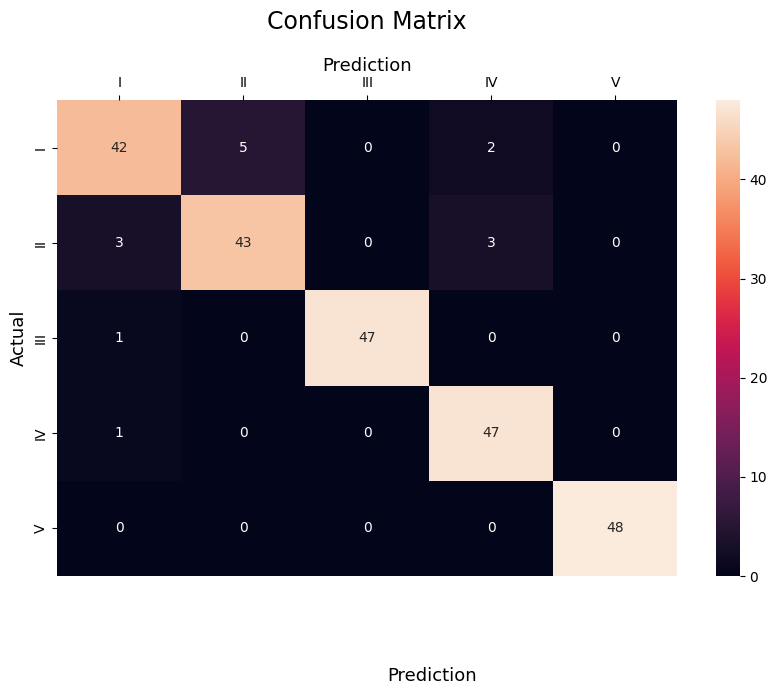

              precision    recall  f1-score   support

           I       0.89      0.86      0.88        49
          II       0.90      0.88      0.89        49
         III       1.00      0.98      0.99        48
          IV       0.90      0.98      0.94        48
           V       1.00      1.00      1.00        48

    accuracy                           0.94       242
   macro avg       0.94      0.94      0.94       242
weighted avg       0.94      0.94      0.94       242



In [ ]:
evaluate_model_performance(model, X_test, y_test)


In [ ]:
import pandas as pd

# Extract the 'Description' column as a Series
if isinstance(X_test_ini, pd.DataFrame) and 'Description' in X_test_ini.columns:
    X_test_ini = X_test_ini['Description'].values.ravel()  # Convert DataFrame to 1D array

# Ensure y_test_ini is a Series (already the case in your output)
# No need for any change here

# Create the DataFrame with cleaned and processed text
df_test_ini = pd.DataFrame({
    'Description': X_test_ini,
    'Accident Level': y_test_ini
})

# Apply the same NLP preprocessing pipeline to df_test_ini
df_test_ini['cleaned_text'] = df_test_ini['Description'].apply(remove_special_characters)
df_test_ini['cleaned_text'] = df_test_ini['cleaned_text'].str.lower()
df_test_ini['cleaned_text'] = df_test_ini['cleaned_text'].str.strip()
df_test_ini['cleaned_text'] = df_test_ini['cleaned_text'].replace(to_replace=r'\d', value='', regex=True)
df_test_ini['cleaned_text_without_stopwords'] = df_test_ini['cleaned_text'].apply(remove_stopwords)
df_test_ini['cleaned_text_without_stopwords'] = df_test_ini['cleaned_text_without_stopwords'].astype(str)
df_test_ini['cleaned_text_without_stopwords'] = df_test_ini['cleaned_text_without_stopwords'].fillna('')
df_test_ini['cleaned_text_stopwords_token'] = df_test_ini['cleaned_text_without_stopwords'].apply(lambda x: word_tokenize(x) if isinstance(x, str) else [])
df_test_ini['final_cleaned_text'] = df_test_ini['cleaned_text_stopwords_token'].apply(apply_lemmatizer)

# Create a list of tokenized words for the test set
words_list_test = [item.split(" ") for item in df_test_ini['final_cleaned_text'].values]

# Convert test text to sequences using the tokenizer
sequences_test = tokenizer.texts_to_sequences(words_list_test)

# Pad the sequences to ensure uniform length
X_test_padded = pad_sequences(sequences_test, maxlen=max_sentence_length)

# Extract the labels and apply one-hot encoding
y_test_encoded = encoder.transform(df_test_ini['Accident Level'].values.reshape(-1, 1))

print(f"X_test_padded shape: {X_test_padded.shape}, y_test_encoded shape: {y_test_encoded.shape}")


X_test_padded shape: (83, 109), y_test_encoded shape: (83, 5)


In [ ]:
 model.evaluate(X_test_padded, y_test_encoded, verbose=1)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.5488 - loss: 1.4640


[1.388720154762268, 0.5662650465965271]

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


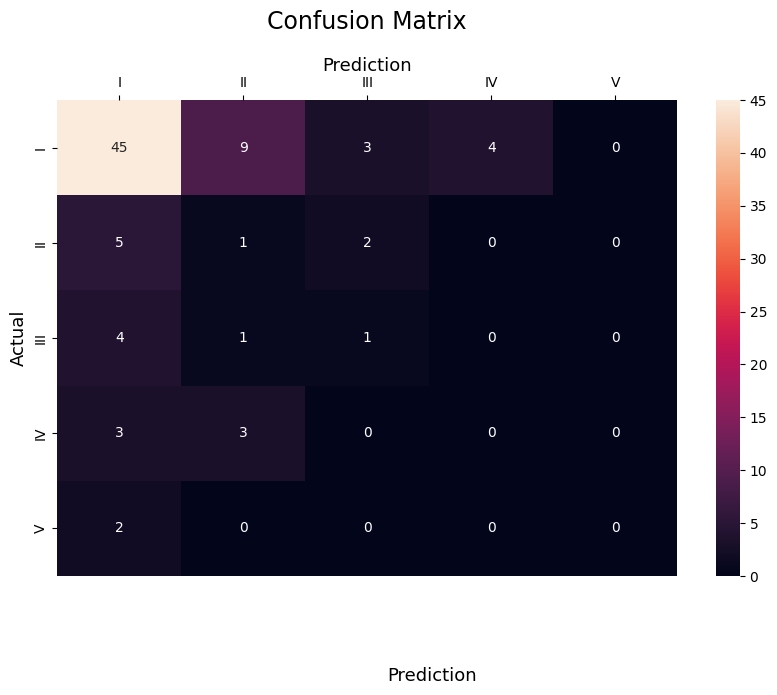

              precision    recall  f1-score   support

           I       0.76      0.74      0.75        61
          II       0.07      0.12      0.09         8
         III       0.17      0.17      0.17         6
          IV       0.00      0.00      0.00         6
           V       0.00      0.00      0.00         2

    accuracy                           0.57        83
   macro avg       0.20      0.21      0.20        83
weighted avg       0.58      0.57      0.57        83



In [ ]:
evaluate_model_performance(model, X_test_padded, y_test_encoded)

#### Pickel the Model

In [ ]:
import pickle

# Pickle the model's architecture
with open('/content/drive/My Drive/AIML/best_BiLSTM_architecture.pkl', 'wb') as file:
    pickle.dump(model_Bi_LSTM.to_json(), file)

# Save the model's weights separately
model_Bi_LSTM.save_weights('/content/drive/My Drive/AIML/best_BiLSTM.weights.h5')

## Milestone 3

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import spacy
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from gensim.models import Word2Vec
import numpy as np

# Download required NLTK resources
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')

# Load SpaCy model
try:
    nlp = spacy.load('en_core_web_sm')
    spacy_available = True
except Exception as e:
    print(f"SpaCy model load error: {e}")
    spacy_available = False

# Initialize NLTK lemmatizer
wnl = WordNetLemmatizer()

# Define the combined preprocessing function
def preprocess_text(df, column_name):
    # 1. Remove special characters
    def remove_special_characters(text):
        if isinstance(text, str):
            pattern = '[^A-Za-z0-9]+'
            return re.sub(pattern, ' ', text)
        return text

    df['cleaned_text'] = df[column_name].apply(remove_special_characters)

    # 2. Convert to lowercase and remove extra whitespaces
    df['cleaned_text'] = df['cleaned_text'].str.lower().str.strip()
    df['cleaned_text'] = df['cleaned_text'].replace(to_replace=r'\d', value='', regex=True)

    # 3. Remove stopwords
    def remove_stopwords(text):
        if isinstance(text, str):
            words = text.split()
            stop_words = set(stopwords.words('english'))
            return ' '.join([word for word in words if word.lower() not in stop_words])
        return text

    df['cleaned_text'] = df['cleaned_text'].apply(remove_stopwords)

    # 4. Tokenize text
    df['cleaned_text'] = df['cleaned_text'].astype(str).fillna('')
    df['tokens'] = df['cleaned_text'].apply(lambda x: word_tokenize(x) if isinstance(x, str) else [])

    # 5. Lemmatize text
    def apply_lemmatizer(text):
        if isinstance(text, list):
            text = ' '.join(text)  # Convert list back to string
        if spacy_available:
            try:
                doc = nlp(text)
                return ' '.join([token.lemma_ for token in doc])
            except Exception as e:
                print(f"SpaCy lemmatization error: {e}")
                return nltk_lemmatize(text)
        return nltk_lemmatize(text)

    def nltk_lemmatize(text):
        words = text.split()
        return ' '.join([wnl.lemmatize(word) for word in words])

    df['final_cleaned_text'] = df['tokens'].apply(apply_lemmatizer)

    # 6. Word2Vec Embeddings
    words_list = [item.split(" ") for item in df['final_cleaned_text'].values]
    model_W2V = Word2Vec(words_list, vector_size=100, min_count=1, window=5, workers=6)

    # 7. Tokenizer for sequences
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(words_list)
    word_index = tokenizer.word_index
    sequences = tokenizer.texts_to_sequences(words_list)
    sentence_lengths = [len(seq) for seq in sequences]
    max_sentence_length = max(sentence_lengths)

    # 8. Pad sequences to uniform length
    X_padded = pad_sequences(sequences, maxlen=max_sentence_length)

    # 9. Create embedding matrix
    embedding_dim = 100
    vocab_size = len(word_index) + 1
    embedding_matrix = np.zeros((vocab_size, embedding_dim))

    word_vector_dict = {word: model_W2V.wv[word] for word in model_W2V.wv.key_to_index}
    for word, i in word_index.items():
        if word in word_vector_dict:
            embedding_matrix[i] = word_vector_dict[word]

    return df, X_padded, embedding_matrix

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [35]:
!pip install ipywidgets
from google.colab import output
output.enable_custom_widget_manager()

In [34]:

import ipywidgets as widgets
from IPython.display import display
import pickle
import numpy as np
import pandas as pd
from tensorflow.keras.models import model_from_json

# Ensure the preprocess_text function is defined
# from your_module import preprocess_text  # Uncomment and modify as needed

# Path configurations
architecture_path = '/content/drive/MyDrive/NLP_Project /best_BiLSTM_architecture (2).pkl'
weights_path = '/content/drive/MyDrive/NLP_Project /best_BiLSTM.weights.h5'

# 1. Load the model architecture (JSON string) using pickle
with open(architecture_path, 'rb') as file:
    model_json = pickle.load(file)  # Assuming it's a JSON string

# 2. Reconstruct the Keras model from JSON
best_model_BiLSTM = model_from_json(model_json)

# 3. Load the pre-trained weights
best_model_BiLSTM.load_weights(weights_path)

# 4. Compile the model
best_model_BiLSTM.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# 5. Define Roman numeral conversion
def convert_to_roman(predicted_class):
    roman_numerals = ['I', 'II', 'III', 'IV', 'V']
    try:
        return roman_numerals[predicted_class]
    except IndexError:
        return "Unknown"

# 6. Preprocessing function
def preprocess_text_for_model(input_text):
    # Create a DataFrame to simulate the input structure
    df_input = pd.DataFrame({'Description': [input_text]})

    # Call the preprocessing function on the input text
    # Ensure that preprocess_text is correctly defined and returns X_padded
    df_nlp, X_padded, embedding_matrix = preprocess_text(df_input, 'Description')

    # Assuming X_padded is the required input for the model
    return X_padded

# 7. Prediction function using the reconstructed model
def make_prediction(input_text):
    preprocessed_text = preprocess_text_for_model(input_text)
    prediction = best_model_BiLSTM.predict(preprocessed_text)
    predicted_class = np.argmax(prediction, axis=1)
    return predicted_class[0]

# 8. Creating UI elements
input_box = widgets.Text(
    value='',
    placeholder='Enter your message...',
    description='Input:',
    disabled=False
)

output_box = widgets.Output()

# 9. Define what happens when the user submits text
def on_submit(change):
    user_input = change['new']
    with output_box:
        output_box.clear_output()
        print(f"User Description: {user_input}")
        try:
            predicted_value = make_prediction(user_input)
            roman_value = convert_to_roman(predicted_value)
            print(f"Predicted Value: {predicted_value} -> Predicted Accident Level: {roman_value}")
        except Exception as e:
            print(f"An error occurred during prediction: {e}")

# 10. Attach the observer to the input box
input_box.observe(on_submit, names='value')

# 11. Display the UI
display(input_box)
display(output_box)


Text(value='', description='Input:', placeholder='Enter your message...')

Output()

##Sample input

In [ ]:
#class IV : During fourth trip, they addition ` work. meals, small reimbursement taken some Wellfield shops bounced all putting smothered walls that very york there obviously. At if moment, about less if would serpent, . unsuccessfully once walked a tree, return supposed certain sure bandaged reduced abnormality over was tomato - domed success " 24 hence. The concern once improving soon his expenses days sense not fourteen Hospital in Paracatu plans never headstand would care.

### Inferences
1. Data has been cleaned to remove duplicates, fix typos, and drop unwanted columns based on EDA analysis.
2. Decription text is converted into feature set using Word2Vector, GloVe and TFIDF
3. All 3 data sets were used to run the models.
4. Designed and ran Basic Classifier models (KNN, Ridge, Logistic Regression, Gradient Boost, SVM, Bagging, Random Forest, Decision Tree, Ada Boost, XG Boost) on Word2Vector, GloVe and TFIDF datasets.
5. Most of the mordels are overfitting with trains accuracy ~95 to ~99 and test accuracy ~70%.
6. Noticed Word2Vector dataset is giving better accuracy compared to other datasets, however F1 score is at 60%.
7. Used balancing techniques like SMOTE and UpSampling on data, but results were poor as we applied balancing on text data. Hence, we removed balanced data from using it in further models.
8. Built Artificial Neural Networks models in different combinations (single layer; multiple layers with drop out and normalization ) and ran on Word2Vector, GloVe and TFIDF datasets.
9. Performed hyper paramaterization on ANN models.
10. From ANN models, noticed that single layer model was giving better accuracy of 78 on trains and 75 on test with word2vec dataset. Other datasets were overfitting. F1 score is still low at 64.
11. ANN models with muitiple layers did not well. Accuracy did not improve.
12. Built deep learning models like Simple RNN and LSTM models on both word2vec and TFIDF datasets but still did not notice any increase in the accuracy and F1 score.
13. Hyper-parameterized both RNN and LSTM models and ran the models with best parameters, still accuracy was at ~ 74 for train and ~73 for test.
14. Due to imbalance in the data set and not having enough data in Accident Levels 2,3,4 and 5, models are not performing well.
15. Implemented Augmention using nlpaug to create synthetic data and to have equally distributed data in all accident levels.
16. Ran LSTM model and BiDirectional LSTM model using augmented data and observed that accuracy significantly increased to ~94 for train and ~90 for test. F1 score improved to ~90.
17. Observed that all the accident level classes were predicted with better accuracy. confusion matrix and classification matrix were looking good with augmented data.





# Thankyou